# Subclustering of mesoderm cells in Set 3

In [1]:
# loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
# loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/Set3/seu_HQC_Set3.obj")
seu_HQC

An object of class Seurat 
28756 features across 6180 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


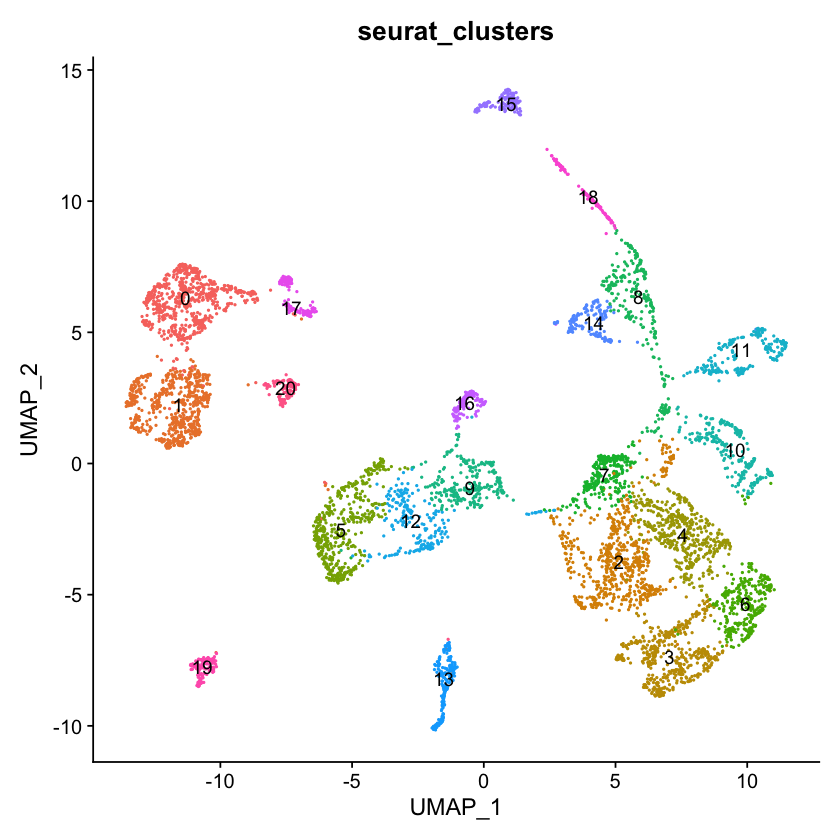

In [3]:
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'seurat_clusters') + NoLegend()

## Trunk mesoderm
### picking up target clusters

In [4]:
# library(RColorBrewer)
# colPal0_1 <- colorRampPalette(c("magenta3", 
#                                "magenta3", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80",
#                                "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80", "gray80"))

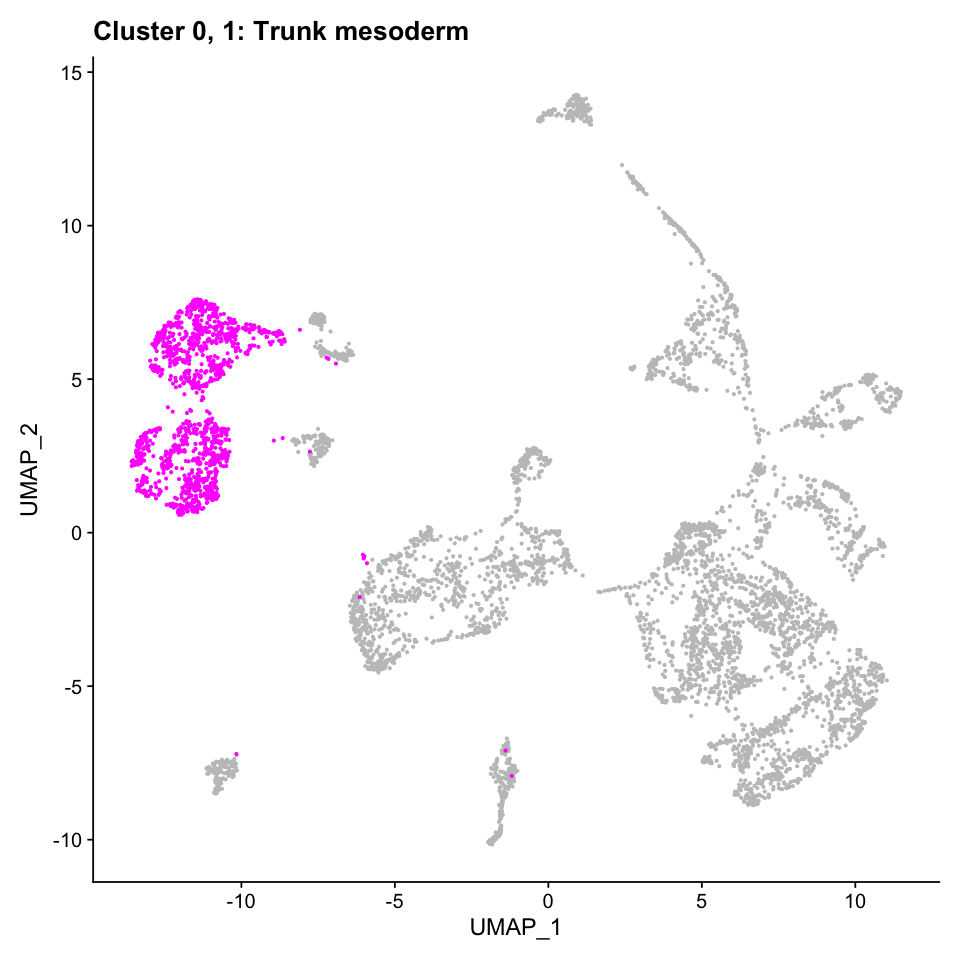

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(0, 1))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 0, 1: Trunk mesoderm')

In [6]:
# options(repr.plot.width=8, repr.plot.height=8)
# DimPlot(seu_HQC, reduction =  "umap", label = FALSE)  + scale_color_manual(values = colPal0_1(21)) + NoLegend() + 
# ggtitle("cluster_0_1")

In [7]:
seu_HQC_meso <- subset(seu_HQC, ident = c("0","1"))
seu_HQC_meso

An object of class Seurat 
28756 features across 1285 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [8]:
seu_HQC_meso$allcell_clusters <- Idents(object = seu_HQC_meso)

### renormalize and clustering

In [9]:
DefaultAssay(seu_HQC_meso) <- "RNA"
seu_HQC_meso <- suppressWarnings(SCTransform(seu_HQC_meso, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


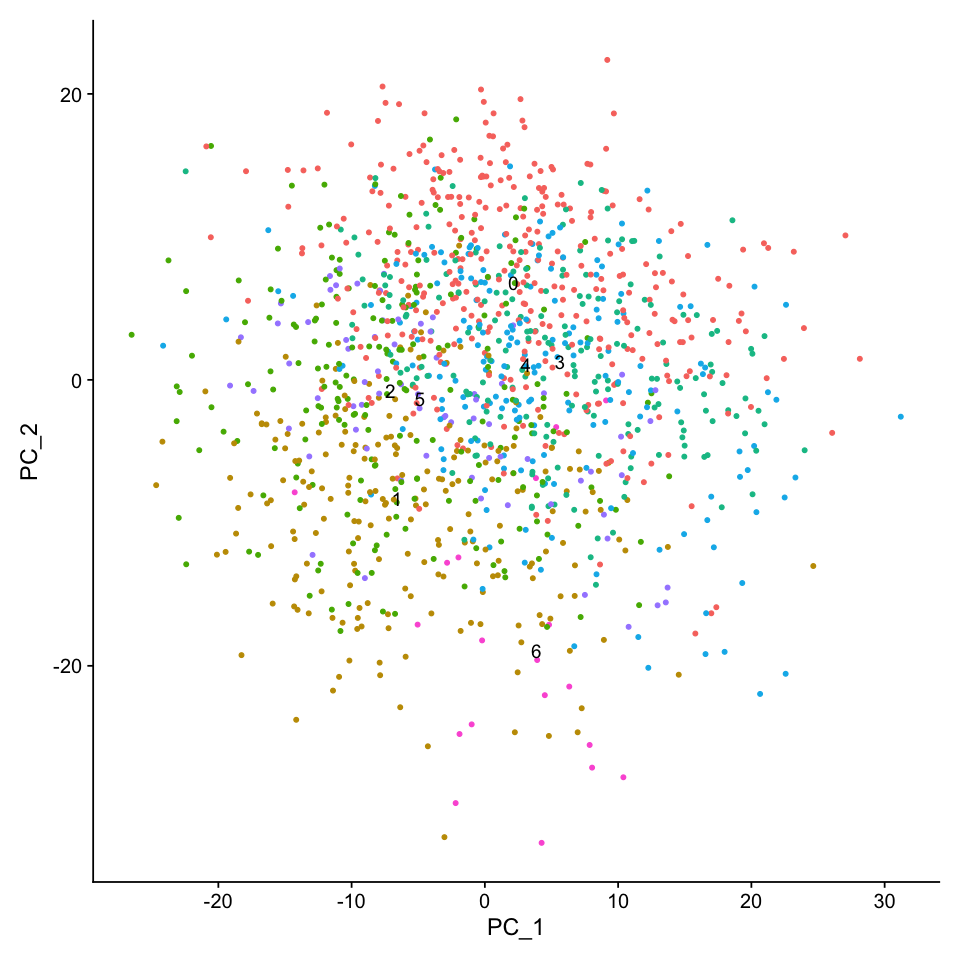

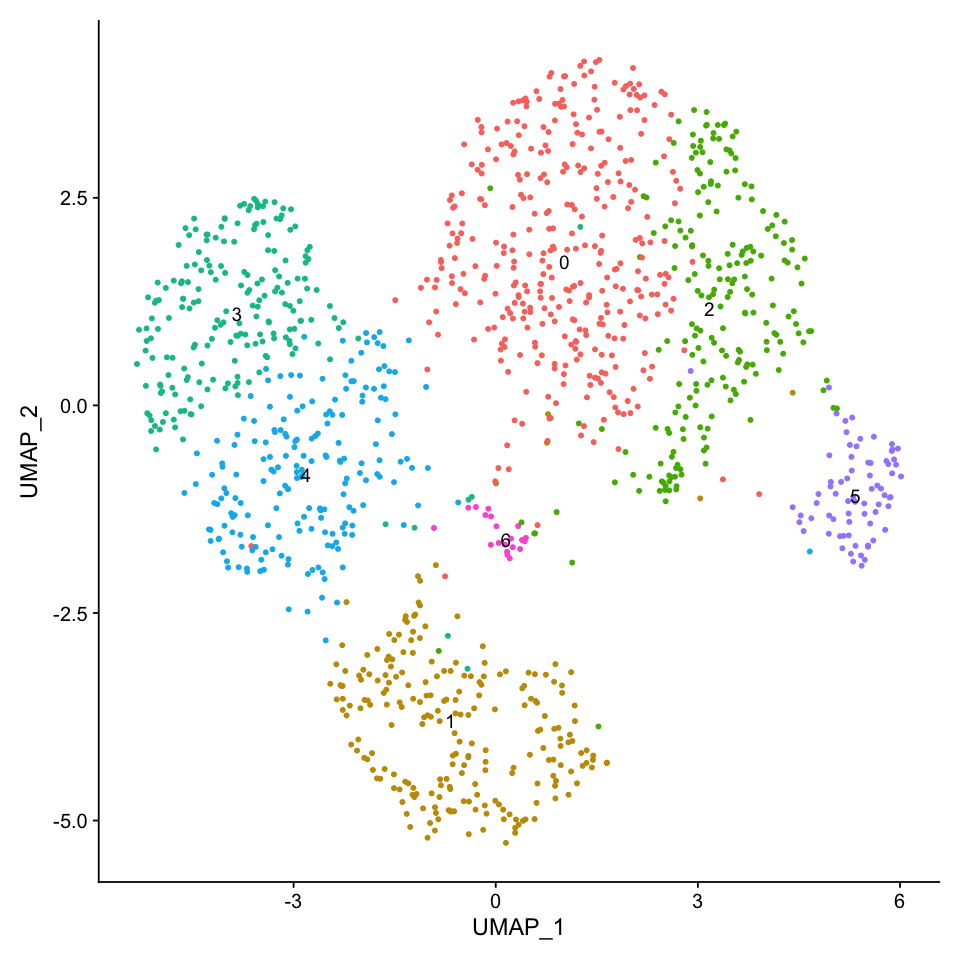

In [10]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso <- RunPCA(seu_HQC_meso, verbose = FALSE)
# seu_HQC_meso <- RunTSNE(seu_HQC_meso, dims = 1:30, verbose = FALSE)
seu_HQC_meso <- RunUMAP(seu_HQC_meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso <- FindNeighbors(seu_HQC_meso, dims = 1:30, verbose = FALSE)
seu_HQC_meso <- FindClusters(seu_HQC_meso, verbose = FALSE)
DimPlot(seu_HQC_meso, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso, reduction =  "umap", label = TRUE) + NoLegend()

In [11]:
# seu_HQC_meso <- RunUMAP(seu_HQC_meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
# DimPlot(seu_HQC_meso, reduction =  "umap", label = TRUE) + NoLegend()

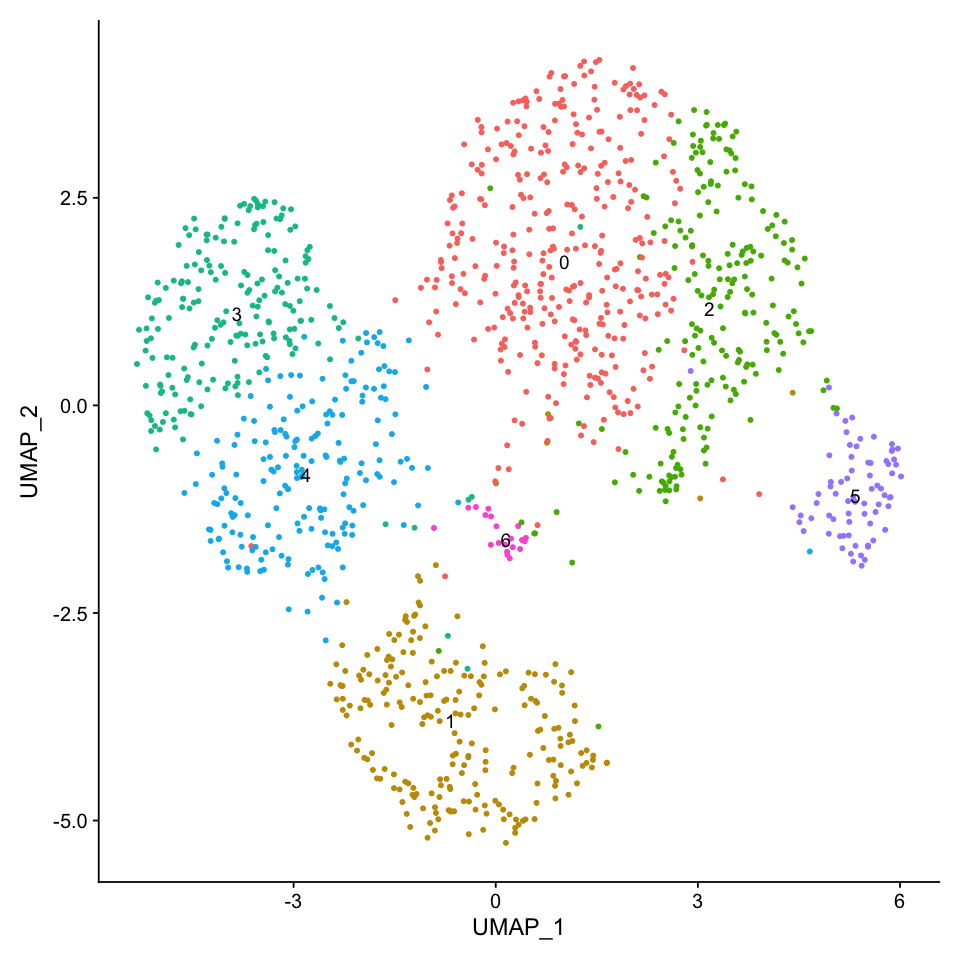

In [12]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso <- FindClusters(seu_HQC_meso, verbose = FALSE, resolution = 0.8)
DimPlot(seu_HQC_meso, reduction =  "umap", label = TRUE) + NoLegend()

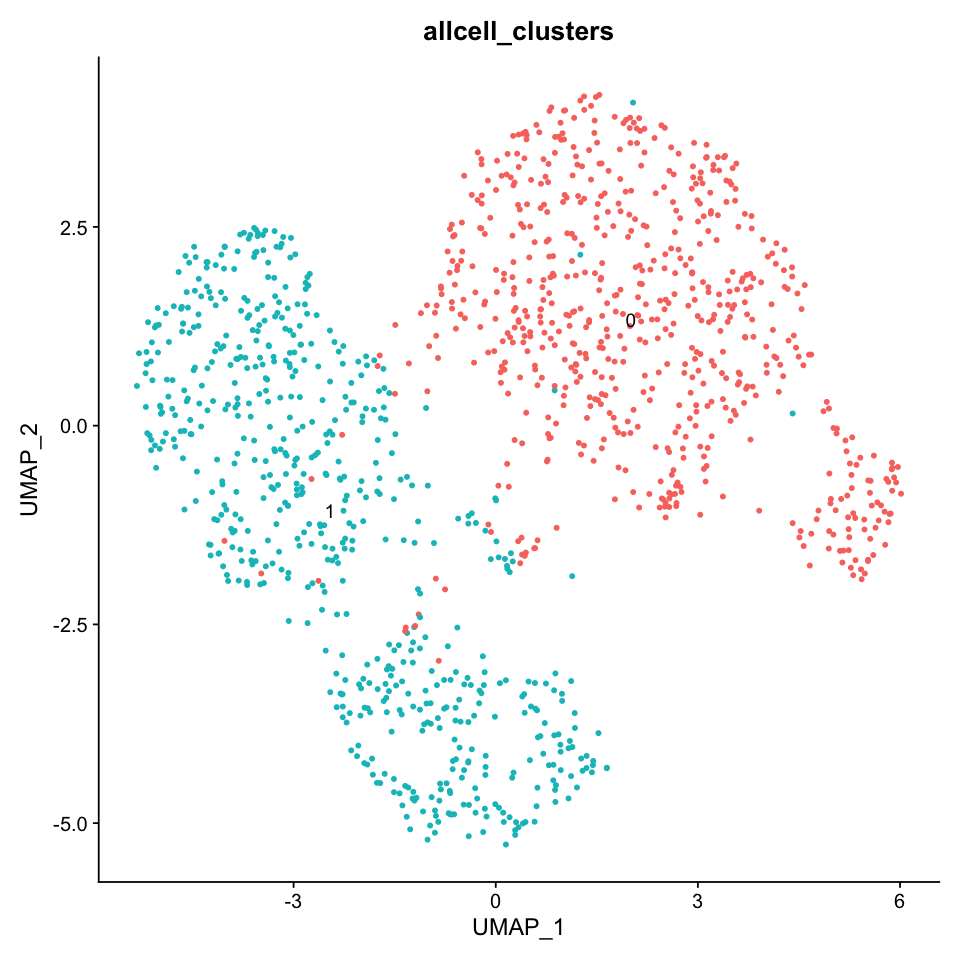

In [13]:
DimPlot(seu_HQC_meso, reduction =  "umap", label = TRUE, group.by = "allcell_clusters") + NoLegend()

In [14]:
levels <- c(5,2,0,1,4,3,6)
levels(seu_HQC_meso) <- levels

In [15]:
all.markers.meso <- FindAllMarkers(object = seu_HQC_meso, only.pos = TRUE)

Calculating cluster 5

Calculating cluster 2

Calculating cluster 0

Calculating cluster 1

Calculating cluster 4

Calculating cluster 3

Calculating cluster 6



In [16]:
nrow(all.markers.meso)
all.markers.meso.top10 <- all.markers.meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso.top10)

[1] 512

[1] 70

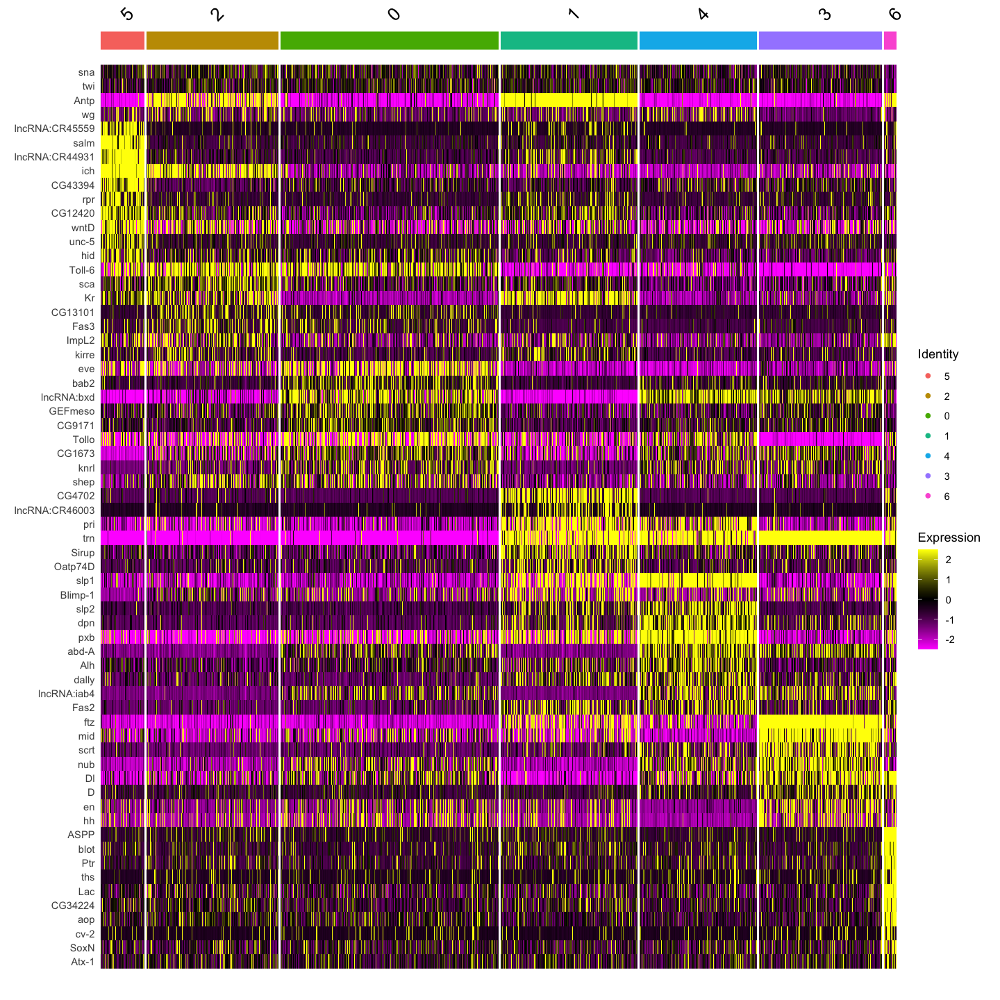

In [17]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_meso, features = c("sna", "twi", "Antp","wg", all.markers.meso.top10$gene))

cluster 6: Expressing ectoderm markers including SoxN  
remove them as doublet cells

### Removing doublets

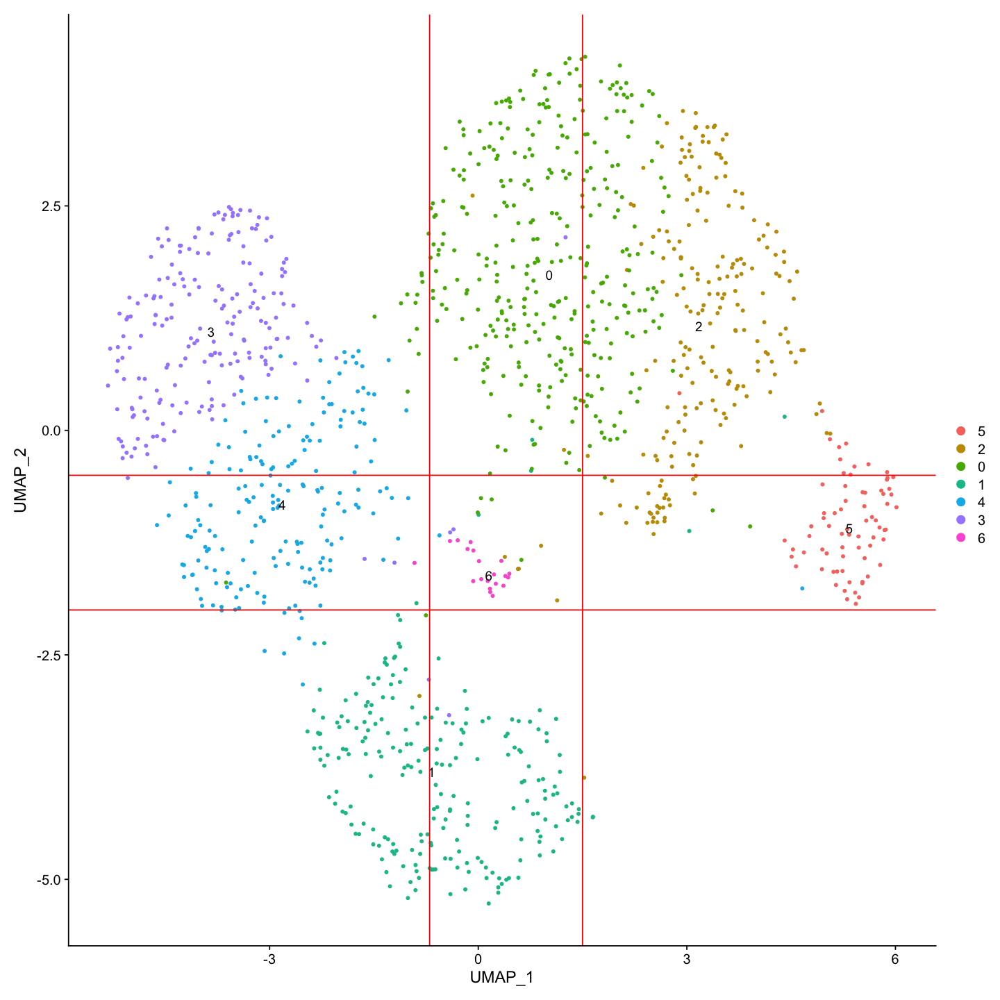

In [18]:
DimPlot(seu_HQC_meso, reduction =  "umap", label = TRUE) + 
geom_vline(xintercept=-0.7, colour="red") + 
geom_vline(xintercept=1.5, colour="red") + 
geom_hline(yintercept=-2, colour="red") + 
geom_hline(yintercept=-0.5, colour="red")

In [19]:
head(Embeddings(seu_HQC_meso, reduction = "umap"))

,UMAP_1,UMAP_2
AAACGAAGTGACCGAA,1.0293846,3.9661902
AAACGCTAGCGTCAGA,-5.0129014,0.9202466
AAACGCTCAAGTAGTA,-1.4790550,-3.2689459
AAACGCTTCCACGTGG,0.6187613,0.5086146
AAAGGATAGTTCCGGC,-2.2203913,0.1999166
AAAGGATCAGCTGTCG,2.2068204,3.4361180


In [20]:
seu_HQC_meso_umap <- Embeddings(seu_HQC_meso, reduction = "umap")

In [21]:
seu_HQC_meso_umap <- as.data.frame(seu_HQC_meso_umap)
dim(seu_HQC_meso_umap)

[1] 1285    2

In [22]:
seu_HQC_meso_umap <- seu_HQC_meso_umap %>% rownames_to_column("cellID")
head(seu_HQC_meso_umap)

,cellID,UMAP_1,UMAP_2
,<chr>,<dbl>,<dbl>
1,AAACGAAGTGACCGAA,1.0293846,3.9661902
2,AAACGCTAGCGTCAGA,-5.0129014,0.9202466
3,AAACGCTCAAGTAGTA,-1.4790550,-3.2689459
4,AAACGCTTCCACGTGG,0.6187613,0.5086146
5,AAAGGATAGTTCCGGC,-2.2203913,0.1999166
6,AAAGGATCAGCTGTCG,2.2068204,3.4361180


In [23]:
seu_HQC_meso_umap_doublet <- filter(seu_HQC_meso_umap, UMAP_1 >-0.7 & UMAP_1 < 1.5 & UMAP_2 > -2 & UMAP_2 < -0.5)

In [24]:
dim(seu_HQC_meso_umap_doublet)

[1] 32  3

In [25]:
doublet_list <- seu_HQC_meso_umap_doublet$cellID
doublet_list

[1] "AAAGGATGTACGCTAT" "AAAGTCCGTAGAGATT" "AACAAGACAGAACATA" "ACCTACCCACACCTTC"
 [5] "ACTTTCATCACCTGTC" "ATCACTTCACGGCGTT" "ATCGGCGGTTGCCGAC" "CACAACACAGATAAAC"
 [9] "CCGGTGAGTCAACATC" "CGAAGTTTCACTAGCA" "CGTAAGTCAGGGATAC" "CTGCGAGCATGACCCG"
[13] "CTGGACGCAATTGAAG" "CTGTGGGCATTGAAGA" "GCTACCTTCTCCGAGG" "GGGAGTAAGTGTTGAA"
[17] "GGTAGAGGTACTCCCT" "GTCGAATTCTGTACAG" "GTGAGCCTCGAACACT" "GTGTTCCAGGTAATCA"
[21] "TACGGGCGTAGCGCCT" "TAGGTTGGTCATAAAG" "TCACGGGGTCTCCTGT" "TCCTCTTTCGTGGCTG"
[25] "TCCTGCAAGGCCACTC" "TCTTCCTTCTCGTGAA" "TGAGACTTCGAAGGAC" "TGGATCACAAGACTGG"
[29] "TGTGAGTGTCTTCGAA" "TGTGGCGGTTCCGCGA" "TGTTTGTAGCTTAGTC" "TTCGATTCAGAGGTTG"

In [26]:
seu_HQC_meso_umap_singlet <- filter(seu_HQC_meso_umap, !cellID %in% doublet_list)
dim(seu_HQC_meso_umap_singlet)

[1] 1253    3

In [27]:
singlet_list <- seu_HQC_meso_umap_singlet$cellID
length(singlet_list)

[1] 1253

In [28]:
seu_HQC_meso2 <- seu_HQC_meso[, singlet_list]
seu_HQC_meso2

An object of class Seurat 
26956 features across 1253 samples within 2 assays 
Active assay: SCT (9450 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering again

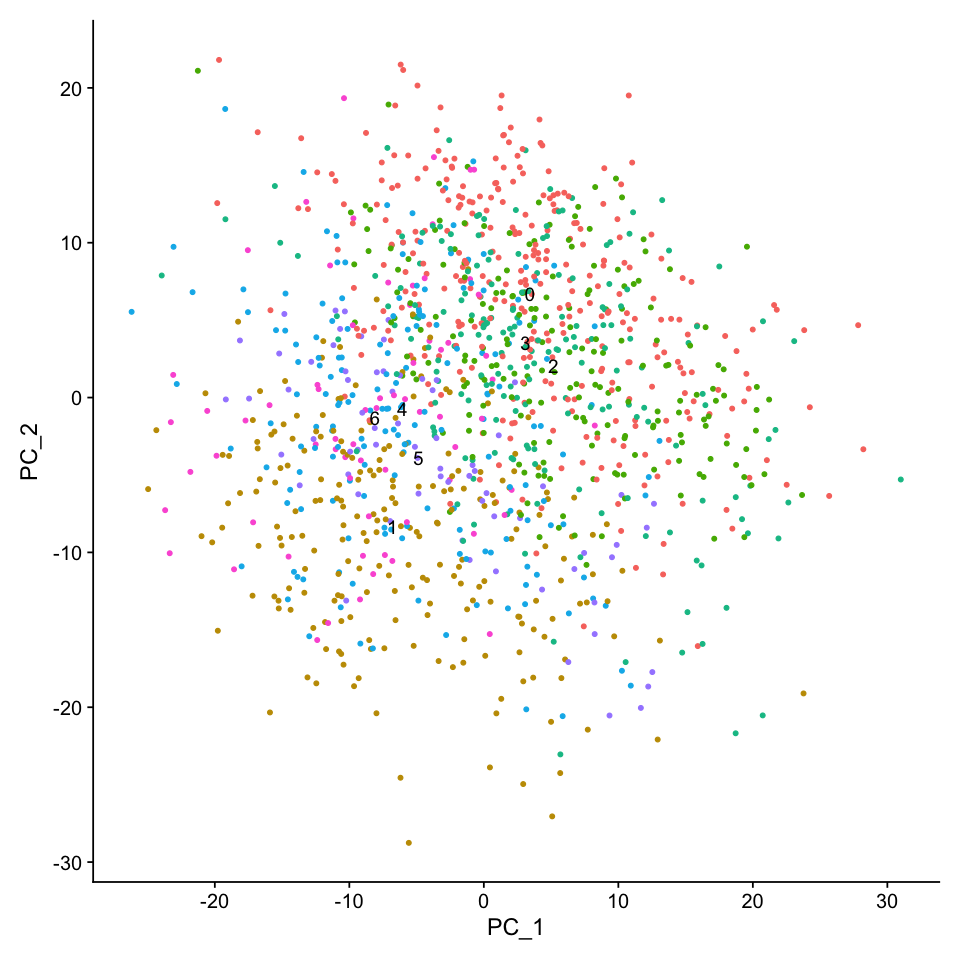

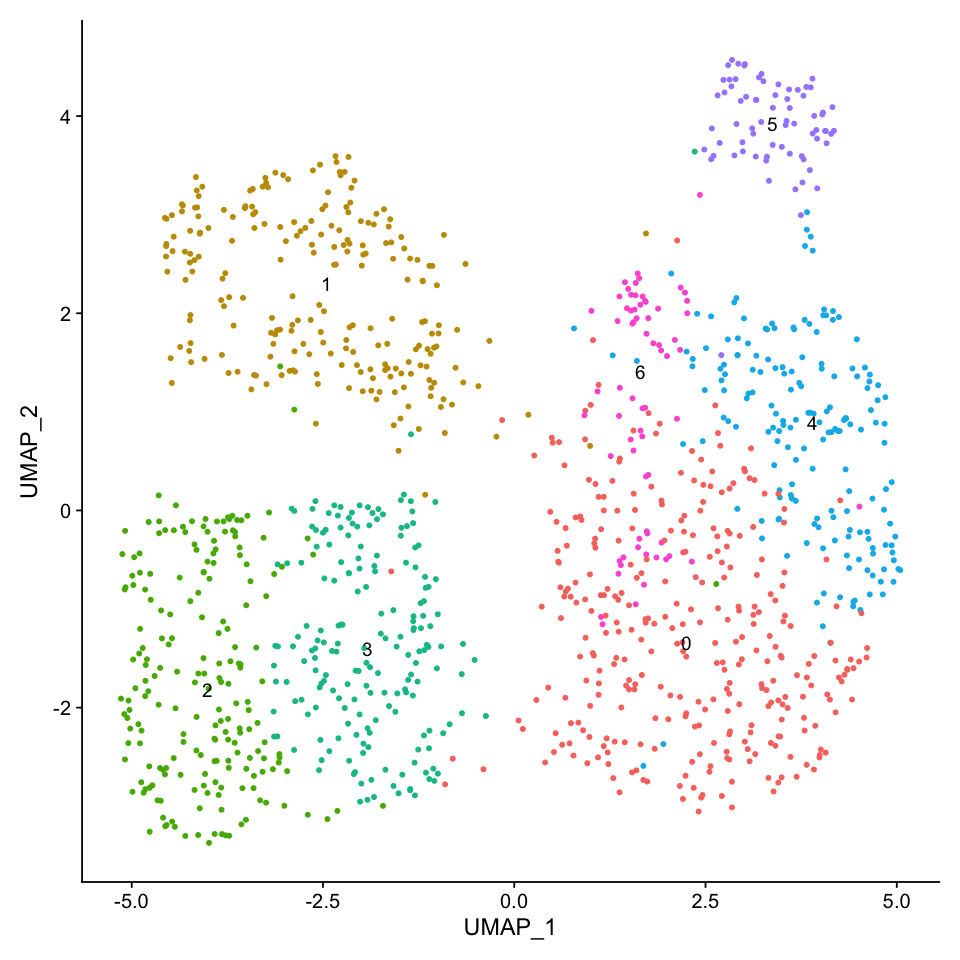

In [29]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso2 <- RunPCA(seu_HQC_meso2, verbose = FALSE)
# seu_HQC_meso2 <- RunTSNE(seu_HQC_meso2, dims = 1:30, verbose = FALSE)
seu_HQC_meso2 <- RunUMAP(seu_HQC_meso2, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso2 <- FindNeighbors(seu_HQC_meso2, dims = 1:30, verbose = FALSE)
seu_HQC_meso2 <- FindClusters(seu_HQC_meso2, verbose = FALSE)
DimPlot(seu_HQC_meso2, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso2, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso2, reduction =  "umap", label = TRUE) + NoLegend()

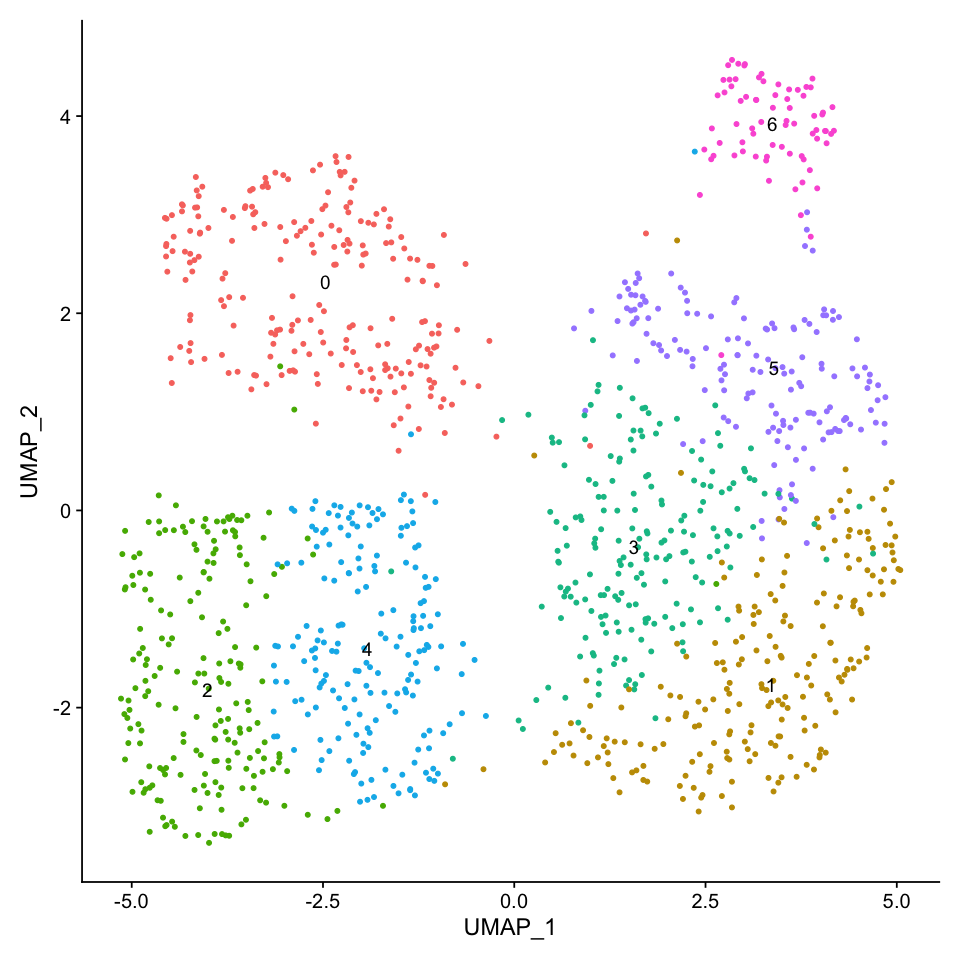

In [30]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso2 <- FindClusters(seu_HQC_meso2, verbose = FALSE, resolution = 0.9)
DimPlot(seu_HQC_meso2, reduction =  "umap", label = TRUE) + NoLegend()

In [31]:
levels <- c(6,5,3,1,0,2,4)
levels(seu_HQC_meso2) <- levels

In [32]:
all.markers.meso2 <- FindAllMarkers(object = seu_HQC_meso2, only.pos = TRUE)

Calculating cluster 6

Calculating cluster 5

Calculating cluster 3

Calculating cluster 1

Calculating cluster 0

Calculating cluster 2

Calculating cluster 4



In [33]:
nrow(all.markers.meso2)
all.markers.meso2.top10 <- all.markers.meso2 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso2.top10)

[1] 283

[1] 70

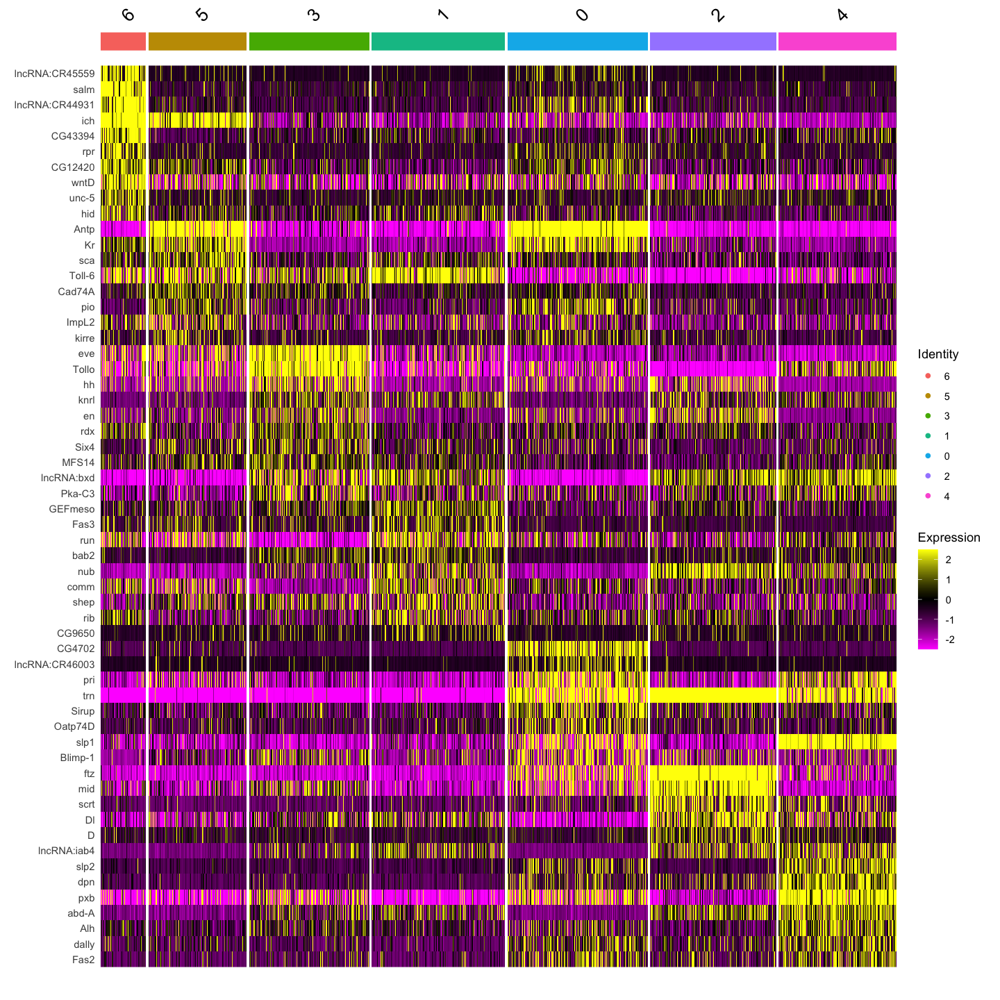

In [34]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_meso2, features = c(all.markers.meso2.top10$gene))

In [35]:
# ME_VF_top40 <- head(VariableFeatures(seu_HQC_meso2), 40)
# ME_VF_top40
# ME_VF_top1_20 <- ME_VF_top40[1:20]
# ME_VF_top1_20
# ME_VF_top21_40 <- ME_VF_top40[21:40]
# ME_VF_top21_40

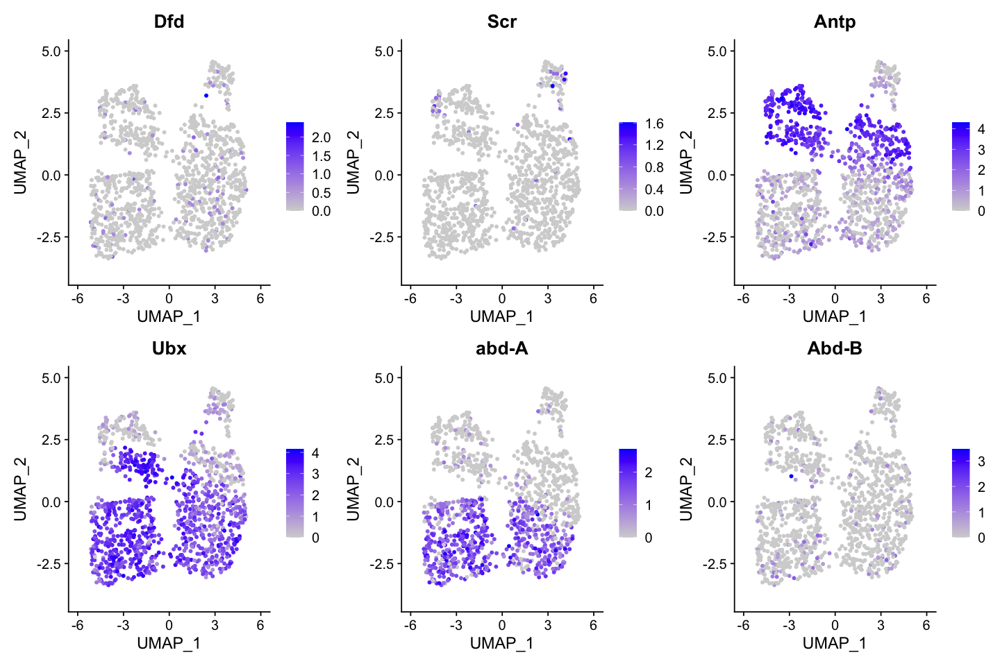

In [36]:
options(repr.plot.width=12, repr.plot.height=8)
FeaturePlot(seu_HQC_meso2, reduction = "umap", features = c('Dfd','Scr','Antp','Ubx','abd-A','Abd-B'), 
            pt.size = 1,  ncol = 3)

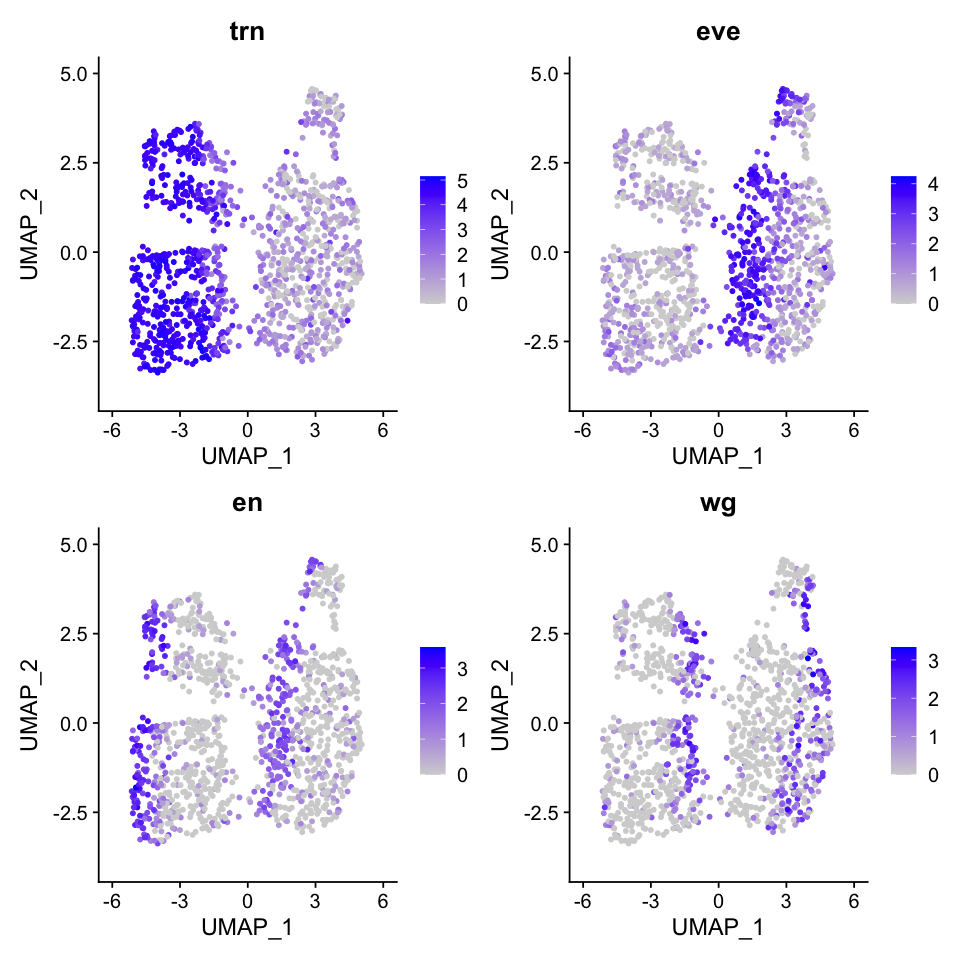

In [37]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_meso2, reduction = "umap", features = c('trn','eve','en','wg'), pt.size = 1,  ncol = 2)

In [38]:
# options(repr.plot.width=10, repr.plot.height=40)
# FeaturePlot(seu_HQC_meso2, reduction = "umap", features =ME_VF_top1_20, pt.size = 1,  ncol = 2)

In [39]:
# options(repr.plot.width=10, repr.plot.height=40)
# FeaturePlot(seu_HQC_meso2, reduction = "umap", features =ME_VF_top21_40, pt.size = 1,  ncol = 2)

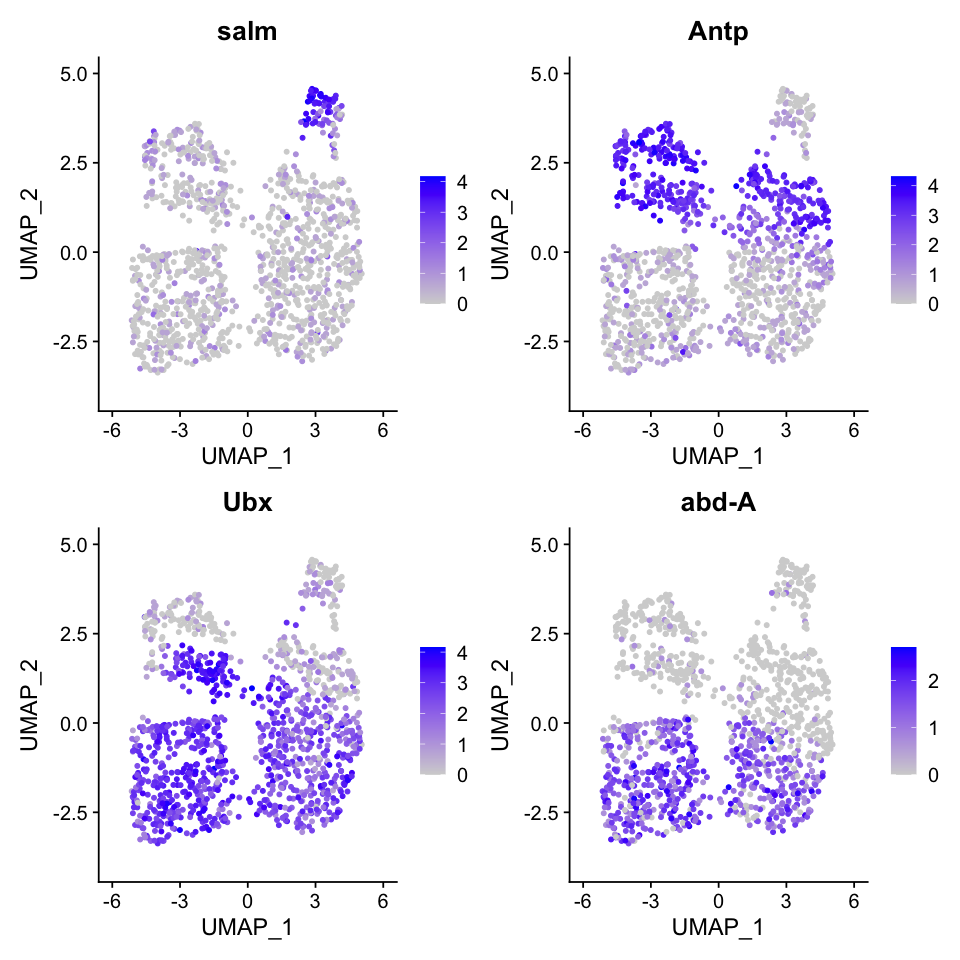

In [40]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_meso2, reduction = "umap", features =c("salm", "Antp", "Ubx", "abd-A"), pt.size = 1,  ncol = 2)

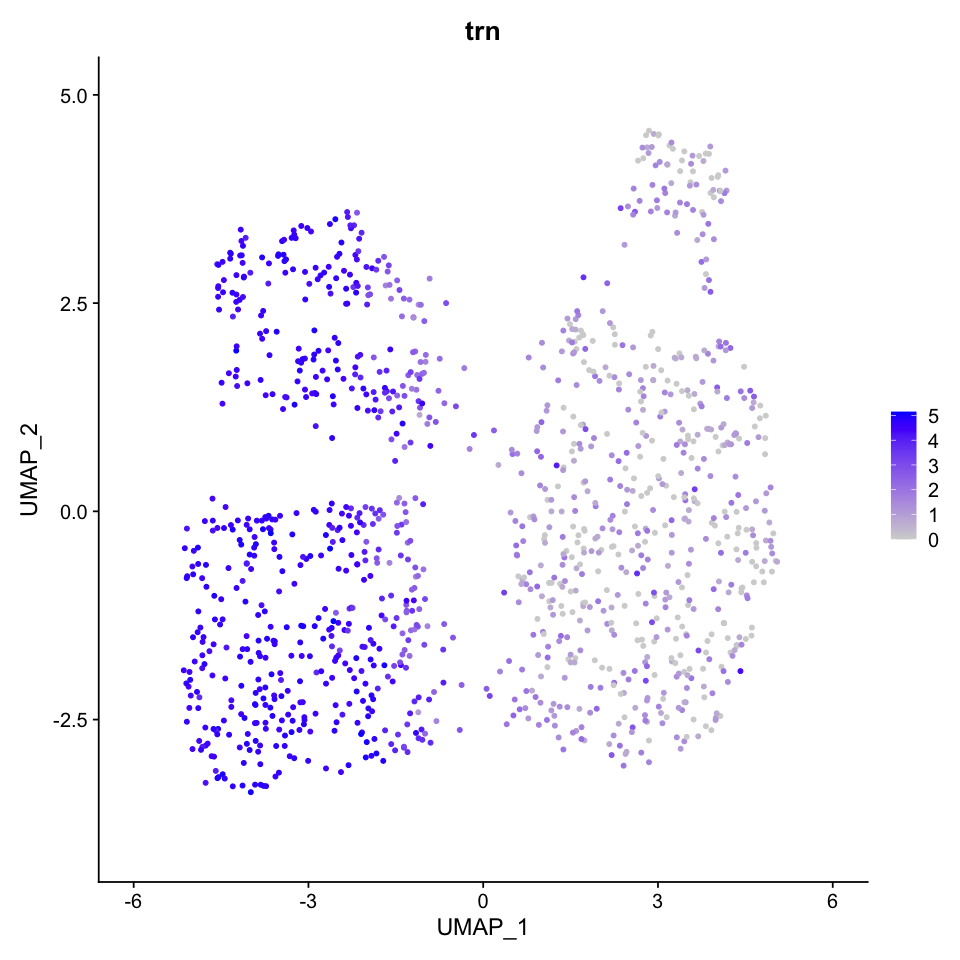

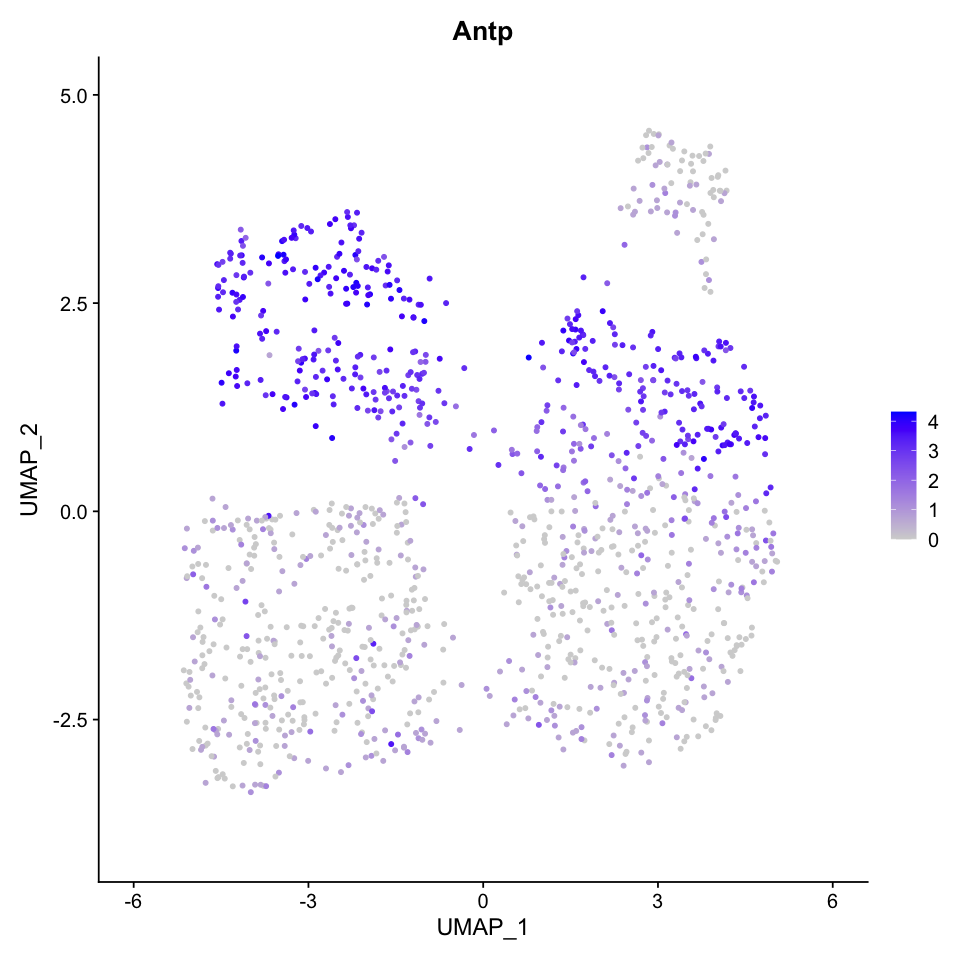

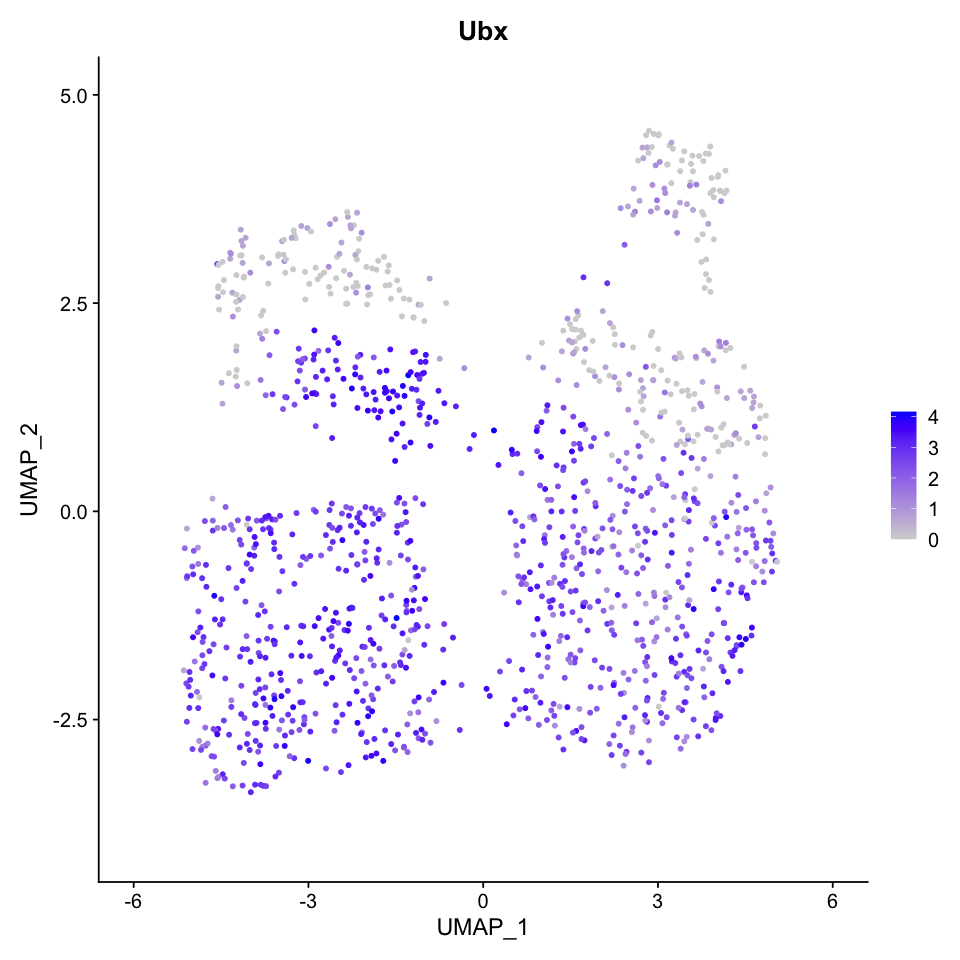

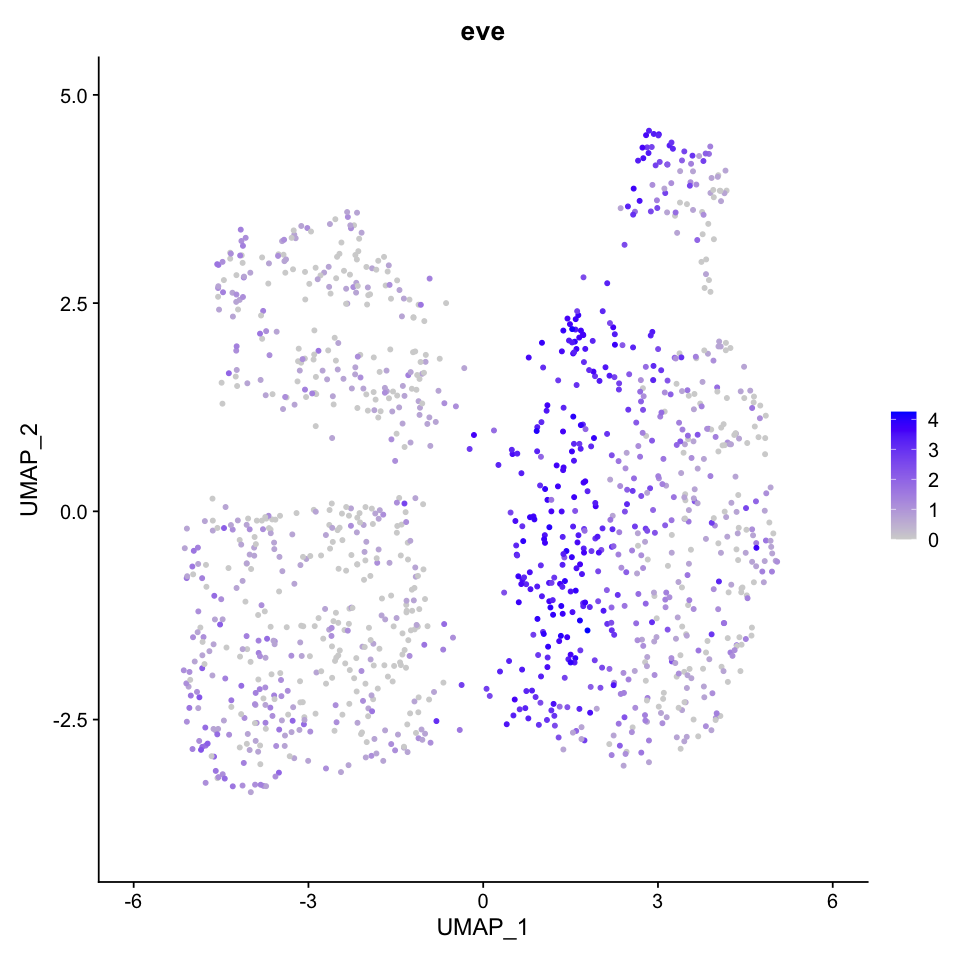

In [41]:
path = './figures/03_subclustering_meso_manualID'
for (name in c('trn','Antp','Ubx','eve')){
    options(repr.plot.width=8, repr.plot.height=8)
    p <- FeaturePlot(seu_HQC_meso2, features = name)
    plot(p)
    basename = paste(name, '_trunk_meso.eps', sep = '')
    filename = paste(path, basename, sep = '/')
    ggsave(p, file = filename, width = 8, height = 8)
}

cluster 0: PS4 and PS6 (Antp+, Ubx+/- trn+)  
cluster 1: abdominal, odd (Antp-, Ubx+, trn-)
cluster 2: abdominal, even (Antp-, Ubx+, trn+)  
cluster 3: abdominal, odd (Antp-, Ubx+, trn-)




### Annotation of cluster 1–6

In [42]:
manual_ID <- as.data.frame(seu_HQC_meso2$seurat_clusters)
colnames(manual_ID) <- c('manual_ID')
head(manual_ID)

manual_ID_1to6 <- filter(manual_ID, !(manual_ID %in% c("0")))

head(manual_ID_1to6)

manual_ID_1to6$manual_ID <- dplyr::recode(manual_ID_1to6$manual_ID, 
                                     "1"="mesoderm_abdominal_odd",
                                     "3"="mesoderm_abdominal_odd",
                                     "2"="mesoderm_abdominal_even",
                                     "4"="mesoderm_abdominal_even",
                                     "6"="mesoderm_PS3",
                                     "5"="mesoderm_PS5",
                                     
                                     )

head(manual_ID_1to6)

,manual_ID
,<fct>
AAACGAAGTGACCGAA,1
AAACGCTAGCGTCAGA,2
AAACGCTCAAGTAGTA,0
AAACGCTTCCACGTGG,3
AAAGGATAGTTCCGGC,4
AAAGGATCAGCTGTCG,1


,manual_ID
,<fct>
AAACGAAGTGACCGAA,1
AAACGCTAGCGTCAGA,2
AAACGCTTCCACGTGG,3
AAAGGATAGTTCCGGC,4
AAAGGATCAGCTGTCG,1
AAAGGTACAGAACTTC,4


,manual_ID
,<fct>
AAACGAAGTGACCGAA,mesoderm_abdominal_odd
AAACGCTAGCGTCAGA,mesoderm_abdominal_even
AAACGCTTCCACGTGG,mesoderm_abdominal_odd
AAAGGATAGTTCCGGC,mesoderm_abdominal_even
AAAGGATCAGCTGTCG,mesoderm_abdominal_odd
AAAGGTACAGAACTTC,mesoderm_abdominal_even


### Annotation of PS4/PS6

In [43]:
# cluster 0 expressed Antp and trn and contains Ubx- cells(PS4) and Ubx+ cells (PS6)
seu_HQC_meso2_0 <- subset(seu_HQC_meso2, ident = c("0"))
seu_HQC_meso2_0

An object of class Seurat 
26956 features across 225 samples within 2 assays 
Active assay: SCT (9450 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

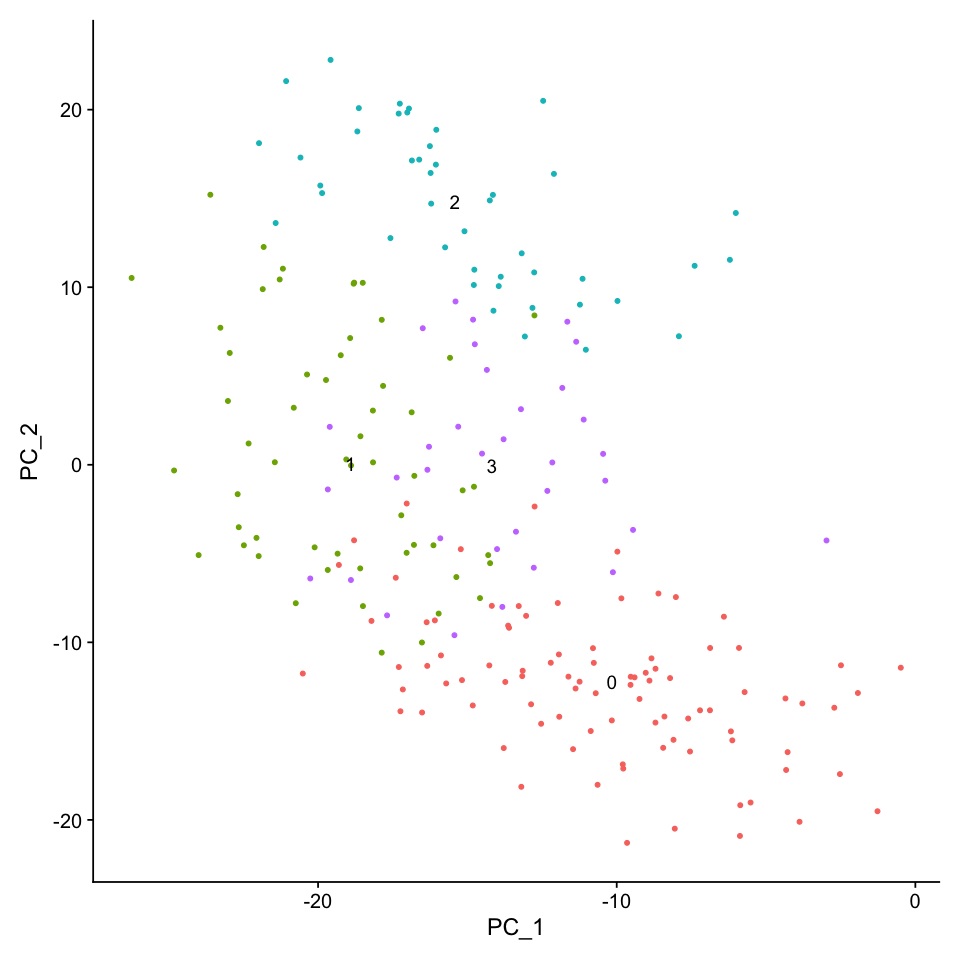

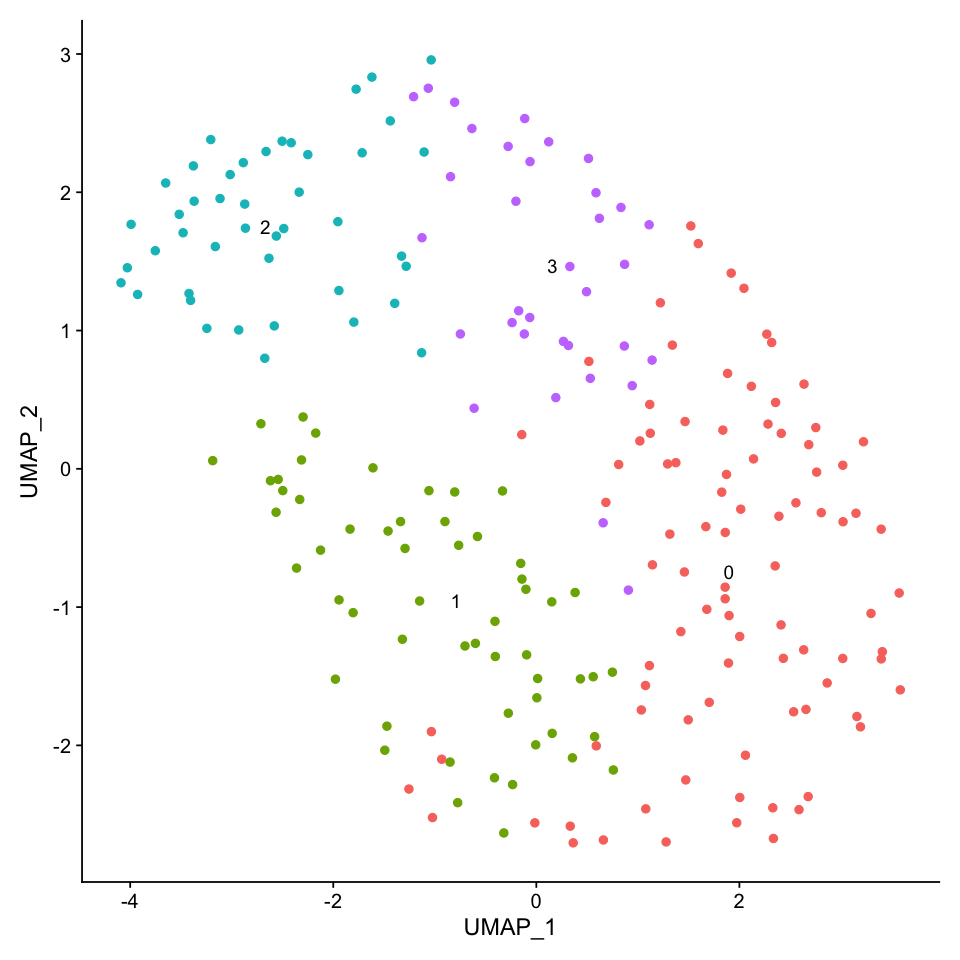

In [44]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso2_0 <- RunPCA(seu_HQC_meso2_0, verbose = FALSE)
# seu_HQC_meso2_0 <- RunTSNE(seu_HQC_meso2_0, dims = 1:30, verbose = FALSE)
seu_HQC_meso2_0 <- RunUMAP(seu_HQC_meso2_0, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso2_0 <- FindNeighbors(seu_HQC_meso2_0, dims = 1:30, verbose = FALSE)
seu_HQC_meso2_0 <- FindClusters(seu_HQC_meso2_0, verbose = FALSE)
DimPlot(seu_HQC_meso2_0, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso2_0, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso2_0, reduction =  "umap", label = TRUE, , pt.size = 2) + NoLegend()

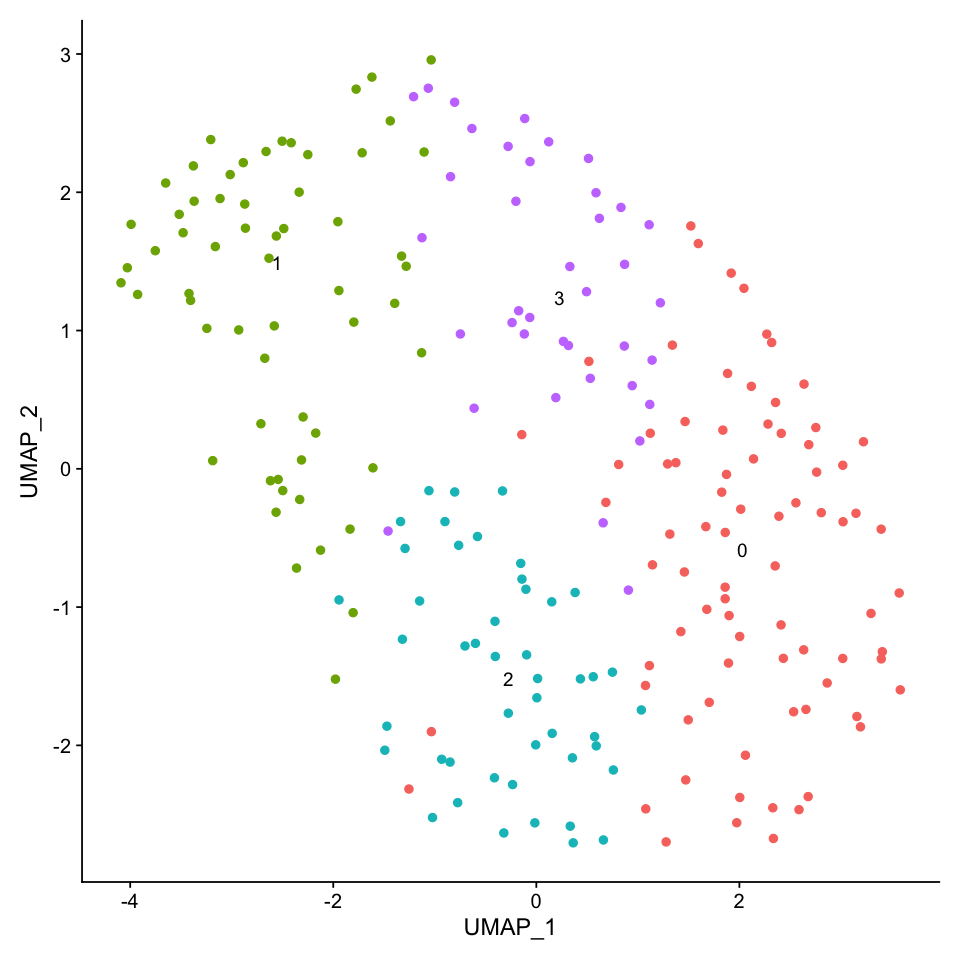

In [45]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso2_0 <- FindClusters(seu_HQC_meso2_0, verbose = FALSE, resolution = 1.0)
DimPlot(seu_HQC_meso2_0, reduction =  "umap", label = TRUE, , pt.size = 2) + NoLegend()

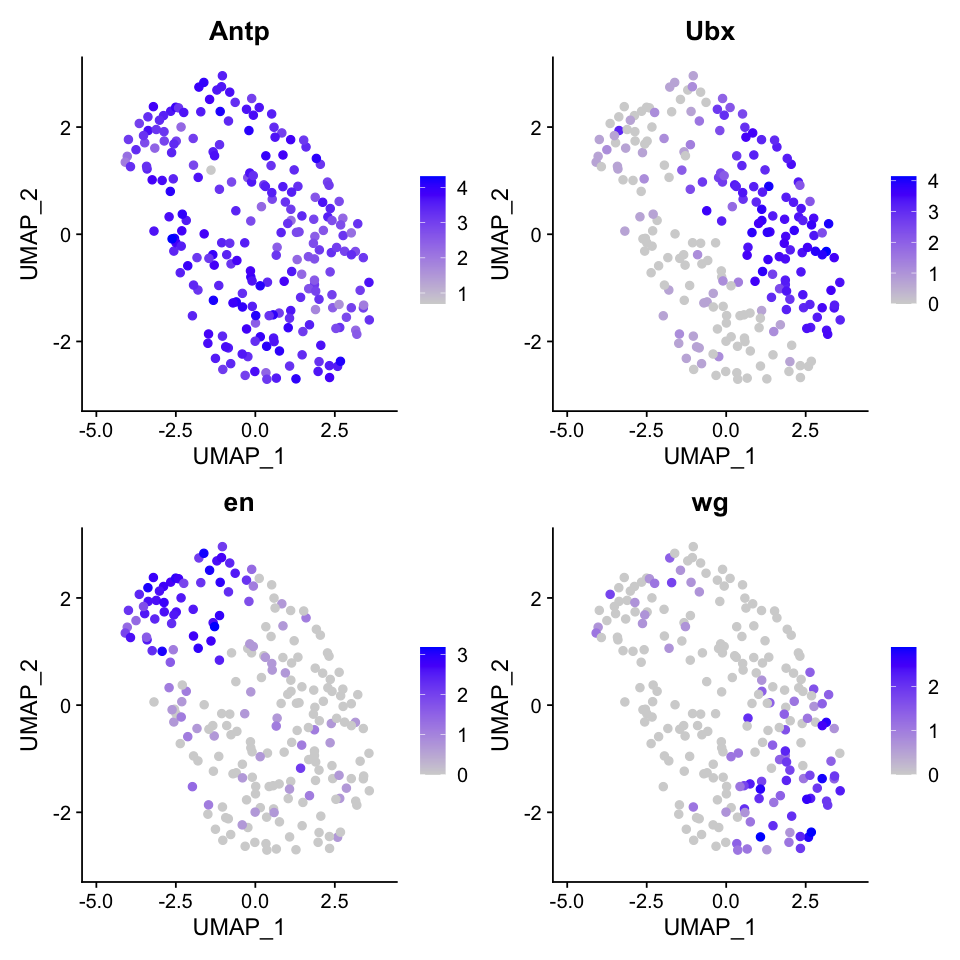

In [46]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_meso2_0, reduction = "umap", features =c( "Antp", "Ubx","en","wg"), pt.size = 2,  ncol = 2)

In [47]:
all.markers.meso2_0 <- FindAllMarkers(object = seu_HQC_meso2_0, only.pos = TRUE)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



In [48]:
all.markers.meso2_0.top10 <- all.markers.meso2_0 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

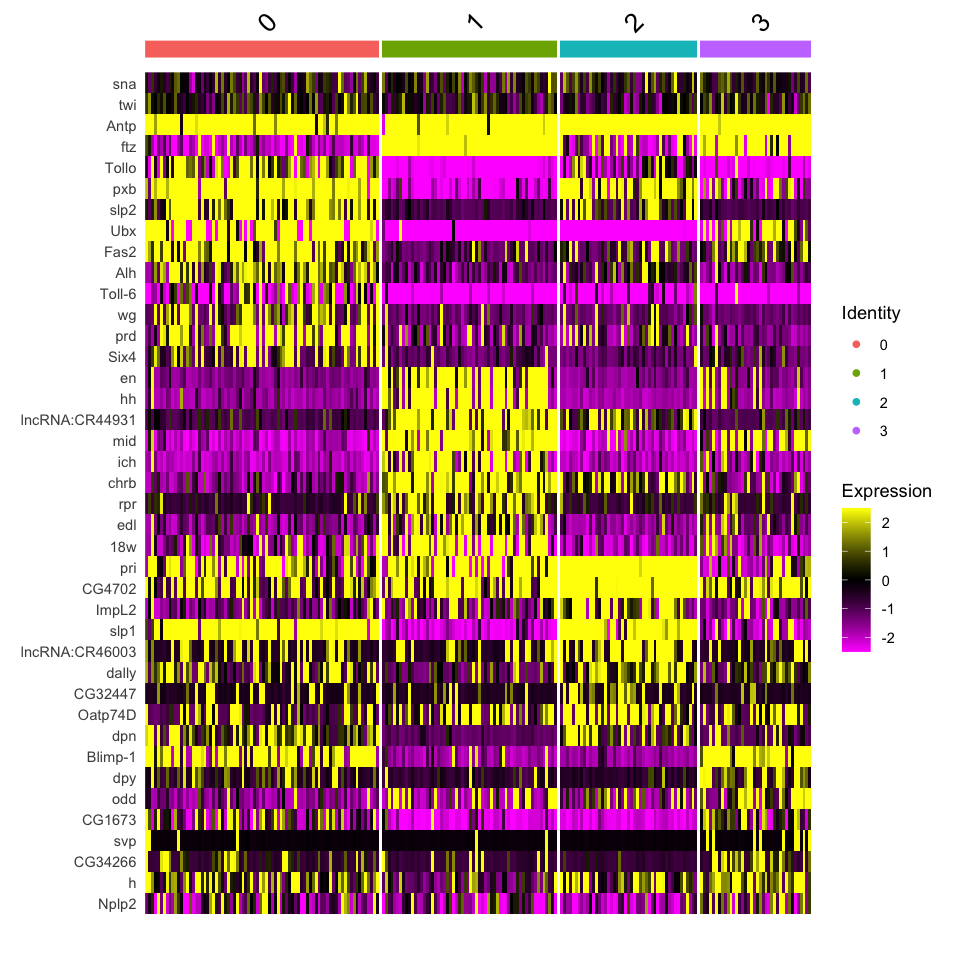

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_meso2_0, features = c("sna", "twi", "Antp", "ftz", all.markers.meso2_0.top10$gene))

Cluster 0, 3 :Ubx+, Antp+ (PS6)  
Cluster 1, 2 :Ubx-, Antp+(PS4)

In [50]:
manual_ID_0 <- as.data.frame(seu_HQC_meso2_0$seurat_clusters)
colnames(manual_ID_0) <- c('manual_ID')
head(manual_ID_0)


manual_ID_0$manual_ID <- dplyr::recode(manual_ID_0$manual_ID,
                                     "0"="mesoderm_PS6",
                                     "1"="mesoderm_PS4",
                                     "2"="mesoderm_PS4",
                                     "3"="mesoderm_PS6",
                                     
                                     )
head(manual_ID_0)

,manual_ID
,<fct>
AAACGCTCAAGTAGTA,0
AAAGGATGTCGCACAC,2
AAAGGGCTCAGCACCG,2
AACAGGGTCATACAGC,0
AACGTCATCCCACAGG,1
AACTTCTGTACGATTC,0


,manual_ID
,<fct>
AAACGCTCAAGTAGTA,mesoderm_PS6
AAAGGATGTCGCACAC,mesoderm_PS4
AAAGGGCTCAGCACCG,mesoderm_PS4
AACAGGGTCATACAGC,mesoderm_PS6
AACGTCATCCCACAGG,mesoderm_PS4
AACTTCTGTACGATTC,mesoderm_PS6


### Merge annotation

In [51]:
manual_ID_trunk_meso <- rbind(manual_ID_0, manual_ID_1to6)
head(manual_ID_trunk_meso)
tail(manual_ID_trunk_meso)
dim(manual_ID_trunk_meso)

,manual_ID
,<fct>
AAACGCTCAAGTAGTA,mesoderm_PS6
AAAGGATGTCGCACAC,mesoderm_PS4
AAAGGGCTCAGCACCG,mesoderm_PS4
AACAGGGTCATACAGC,mesoderm_PS6
AACGTCATCCCACAGG,mesoderm_PS4
AACTTCTGTACGATTC,mesoderm_PS6


,manual_ID
,<fct>
TTTCATGTCAATGTCG,mesoderm_abdominal_even
TTTGACTGTCTGTTAG,mesoderm_abdominal_odd
TTTGATCCATGATGCT,mesoderm_abdominal_odd
TTTGATCGTCCTGGTG,mesoderm_abdominal_even
TTTGGAGCACGCGCAT,mesoderm_abdominal_even
TTTGGAGTCTCAACGA,mesoderm_abdominal_even


[1] 1253    1

In [52]:
seu_HQC_meso2$manual_ID <- manual_ID_trunk_meso

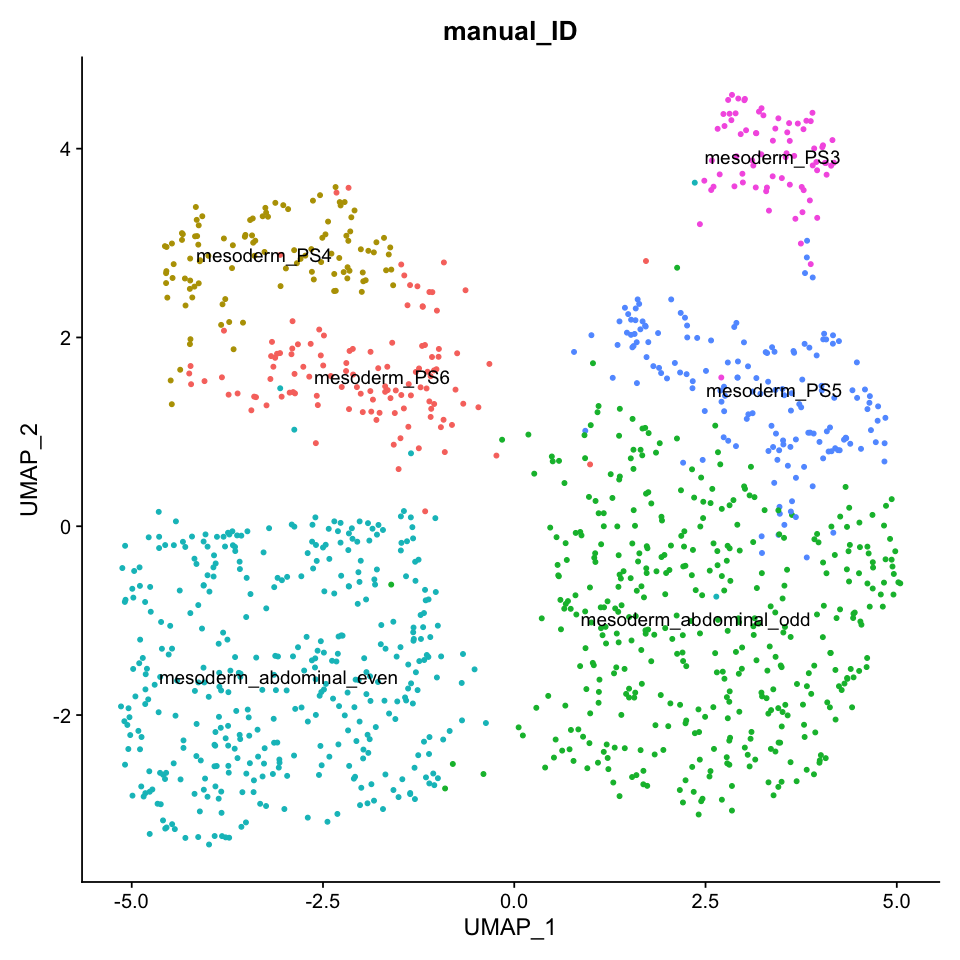

In [53]:
DimPlot(seu_HQC_meso2, reduction =  "umap", group.by = "manual_ID", label = TRUE) + NoLegend()

Calculating cluster mesoderm_PS3

Calculating cluster mesoderm_PS4

Calculating cluster mesoderm_PS5

Calculating cluster mesoderm_PS6

Calculating cluster mesoderm_abdominal_odd

Calculating cluster mesoderm_abdominal_even



[1] 270   7

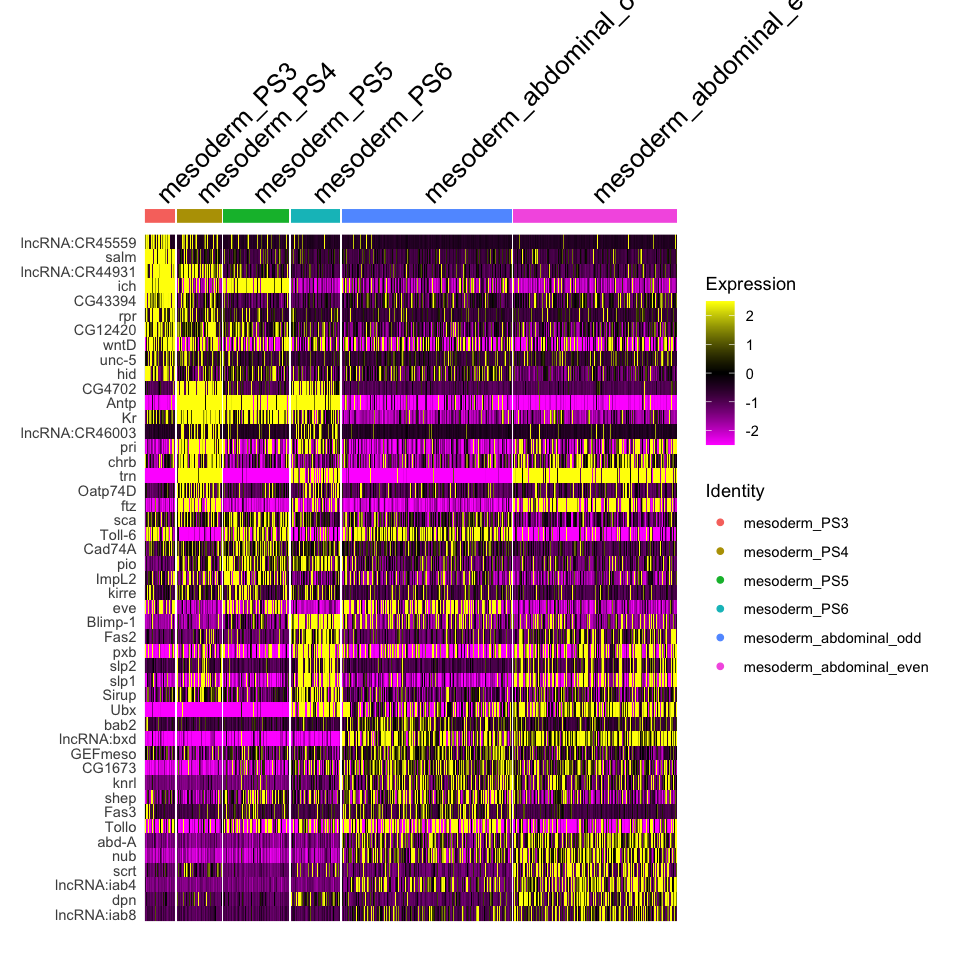

In [54]:
Idents(seu_HQC_meso2) <- 'manual_ID'
levels(seu_HQC_meso2) <- c('mesoderm_PS3', 'mesoderm_PS4', 'mesoderm_PS5', 'mesoderm_PS6',
                          'mesoderm_abdominal_odd', 'mesoderm_abdominal_even')
all.markers <- FindAllMarkers(seu_HQC_meso2, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
write.table(all.markers, file = './subcluster_markers/markers_trunk_meso.txt', sep = '\t')
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_meso2, features = c(all.markers.top10$gene))

In [55]:
write.table(manual_ID_trunk_meso, 
            file="./manual_ID_list/seu_HQC_meso_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [56]:
length(doublet_list)

[1] 32

In [57]:
ID <- rep("doublet", length=length(doublet_list)) 
ID

[1] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
 [8] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
[15] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
[22] "doublet" "doublet" "doublet" "doublet" "doublet" "doublet" "doublet"
[29] "doublet" "doublet" "doublet" "doublet"

In [58]:
doublet_ID <- data.frame(doublet_list, ID)
head(doublet_ID)

,doublet_list,ID
,<chr>,<chr>
1,AAAGGATGTACGCTAT,doublet
2,AAAGTCCGTAGAGATT,doublet
3,AACAAGACAGAACATA,doublet
4,ACCTACCCACACCTTC,doublet
5,ACTTTCATCACCTGTC,doublet
6,ATCACTTCACGGCGTT,doublet


In [59]:
doublet_ID <- doublet_ID %>% column_to_rownames("doublet_list")
head(doublet_ID)

,ID
,<chr>
AAAGGATGTACGCTAT,doublet
AAAGTCCGTAGAGATT,doublet
AACAAGACAGAACATA,doublet
ACCTACCCACACCTTC,doublet
ACTTTCATCACCTGTC,doublet
ATCACTTCACGGCGTT,doublet


In [60]:
write.table(doublet_ID, file="./manual_ID_list/seu_HQC_meso_doublet_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [61]:
seu.doublet <- subset(seu_HQC, cells = doublet_list)
seu.doublet$manual_ID <- 'doublet'
seu.doublet

An object of class Seurat 
28756 features across 32 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

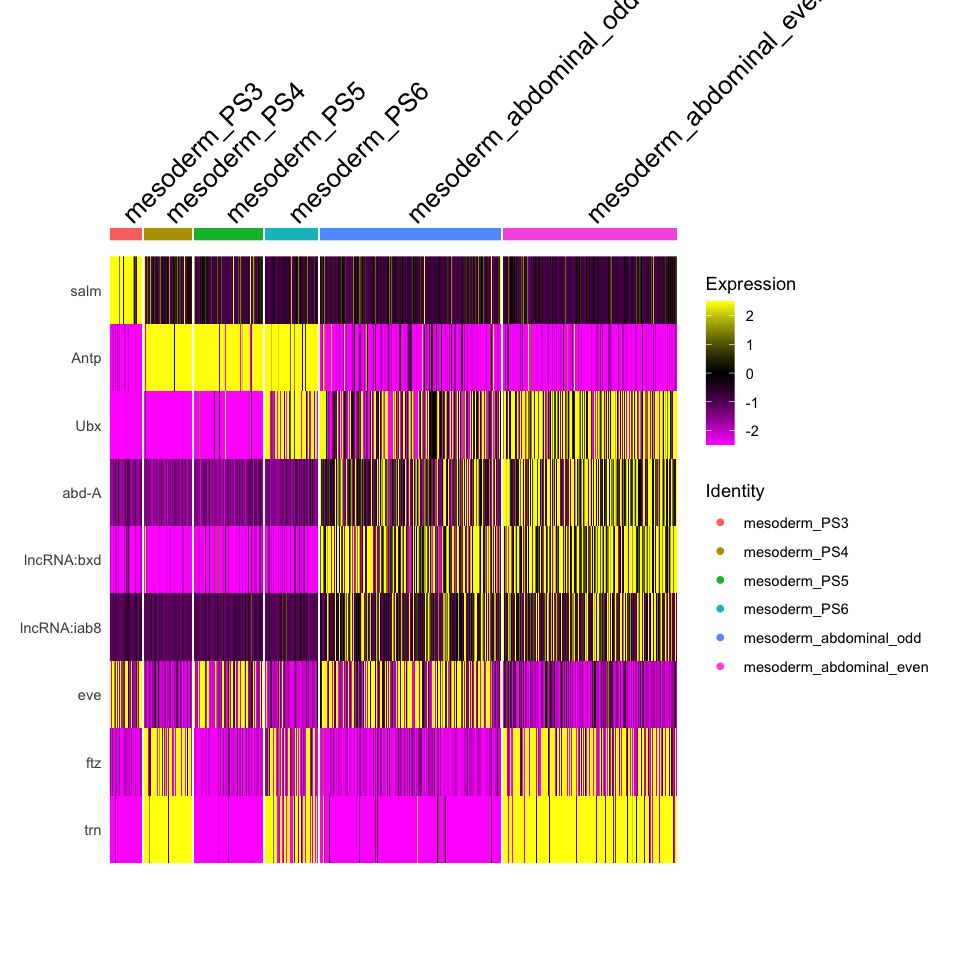

In [62]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_meso2,  features = c("salm", "Antp", "Ubx", "abd-A", "lncRNA:bxd", "lncRNA:iab8","eve", "ftz", "trn"))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/trunk_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

Saving 7 x 7 in image



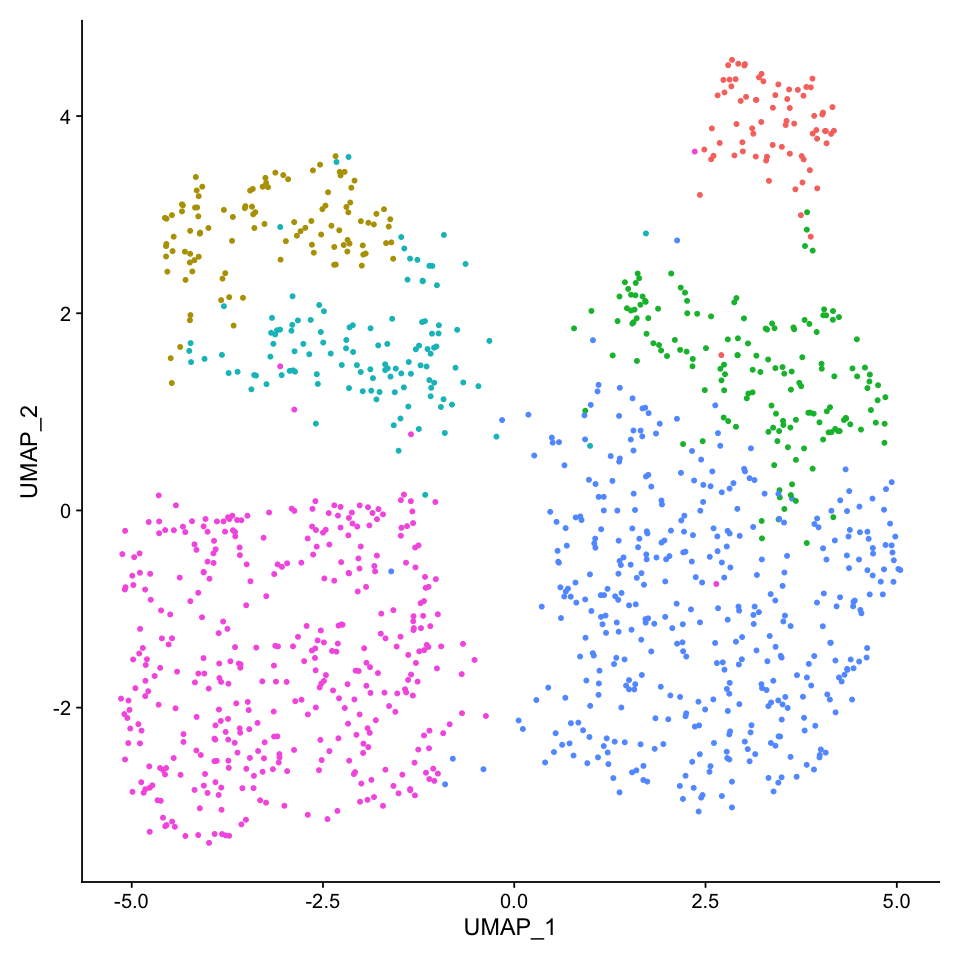

In [63]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso2, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/trunk_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



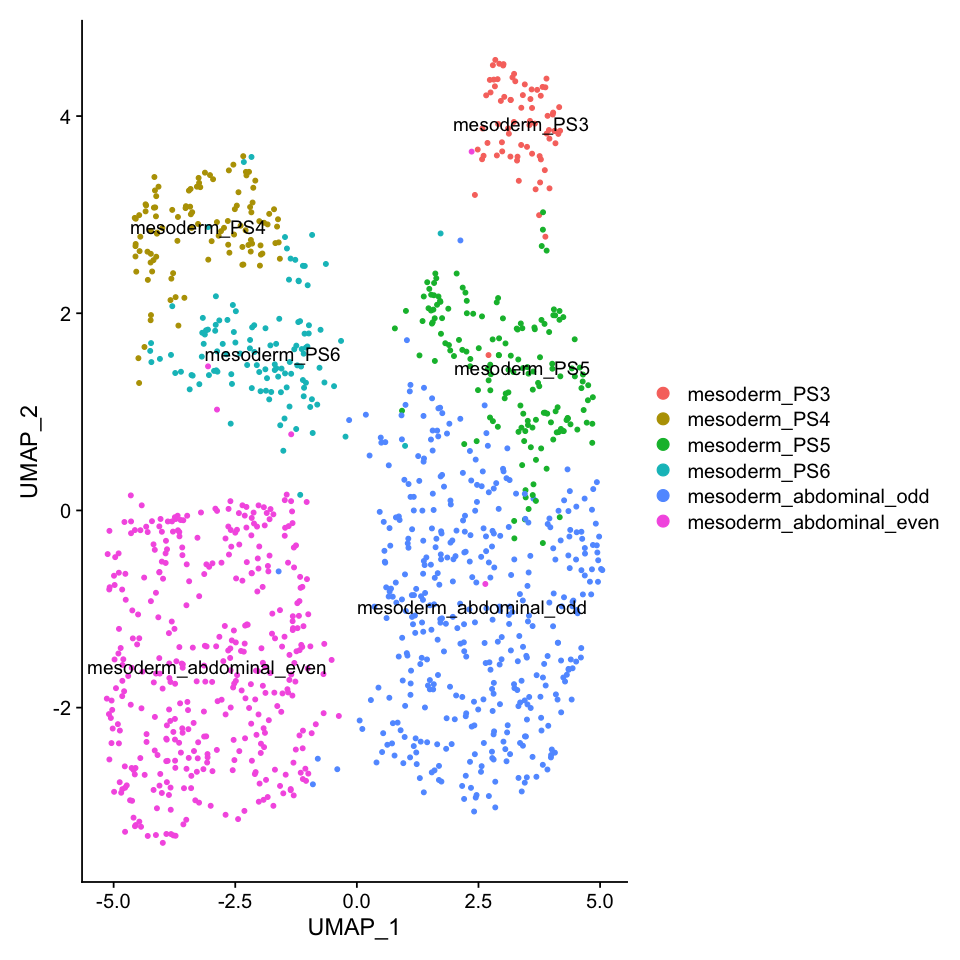

In [64]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso2, reduction =  "umap", label = TRUE) 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/trunk_meso_umap2.eps", dpi = 300)

## Anterior mesoderm (gcm+)
### picking up target clusters

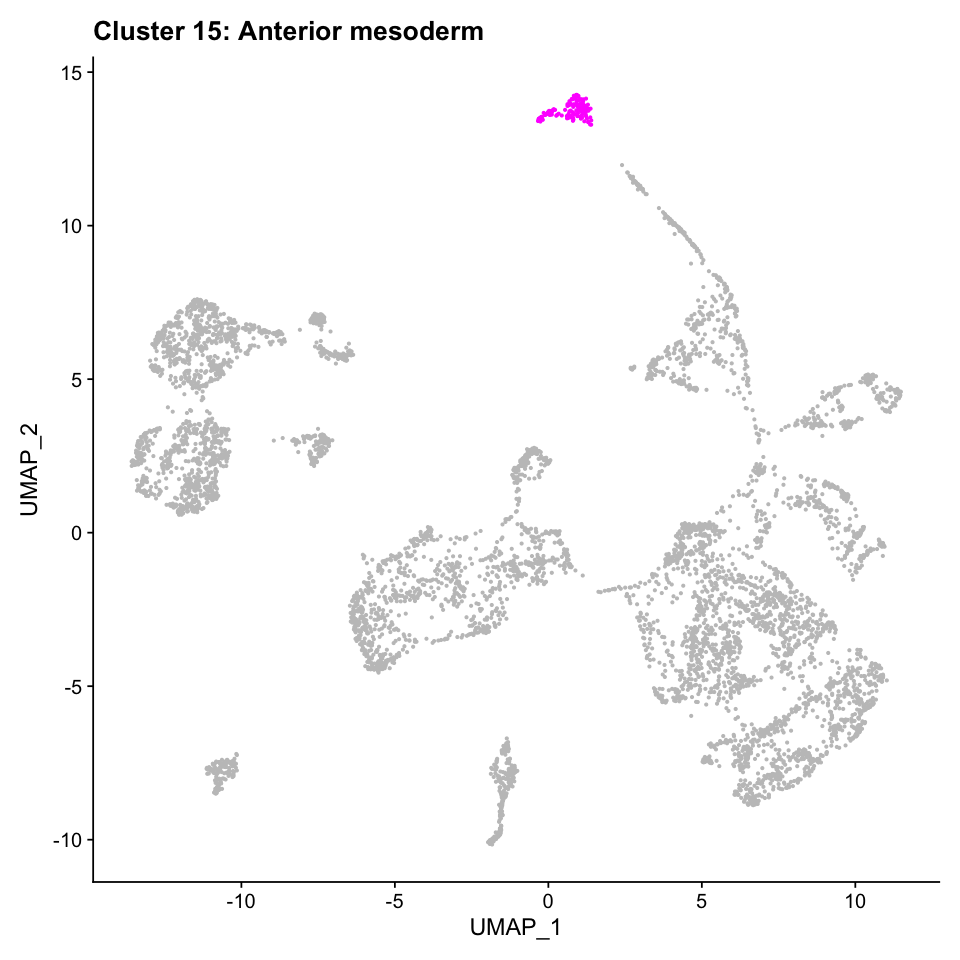

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(15))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 15: Anterior mesoderm')

In [66]:
seu_HQC_meso_gcm <- subset(seu_HQC, ident = 15)
seu_HQC_meso_gcm

An object of class Seurat 
28756 features across 143 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
The number of cells (143 cells) < 500  
Skipping re-normalize

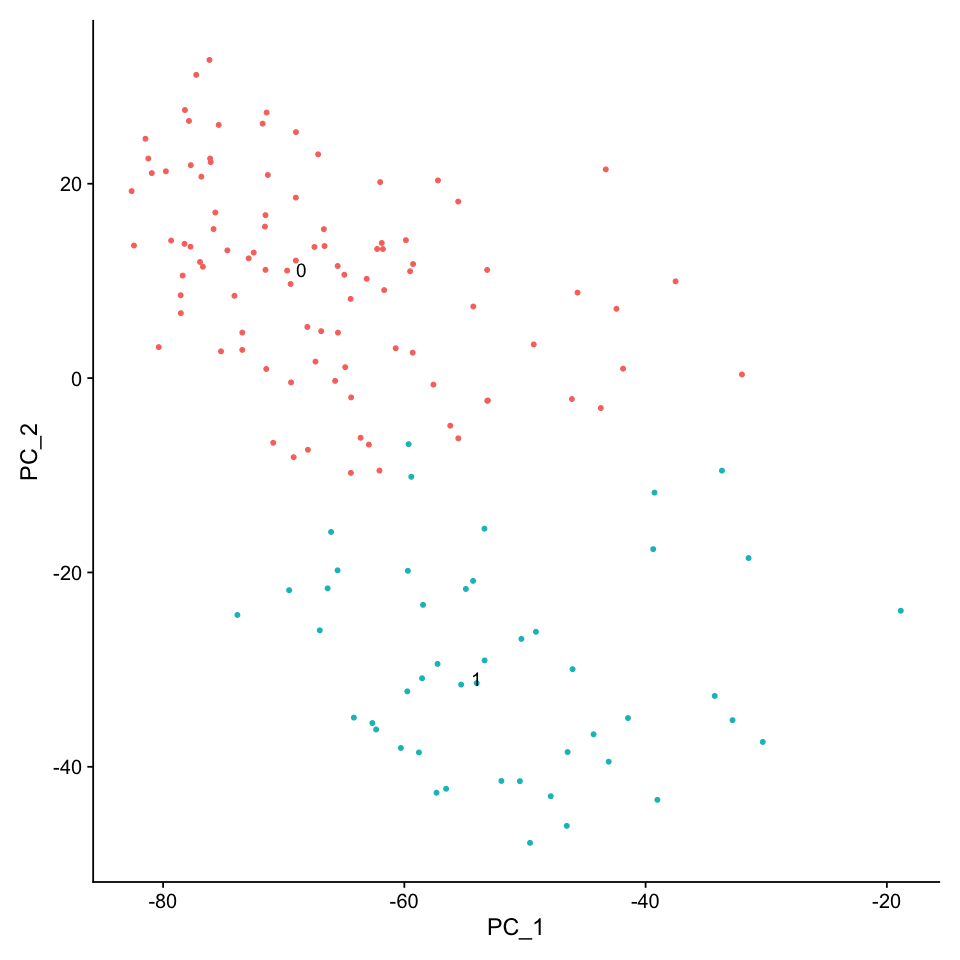

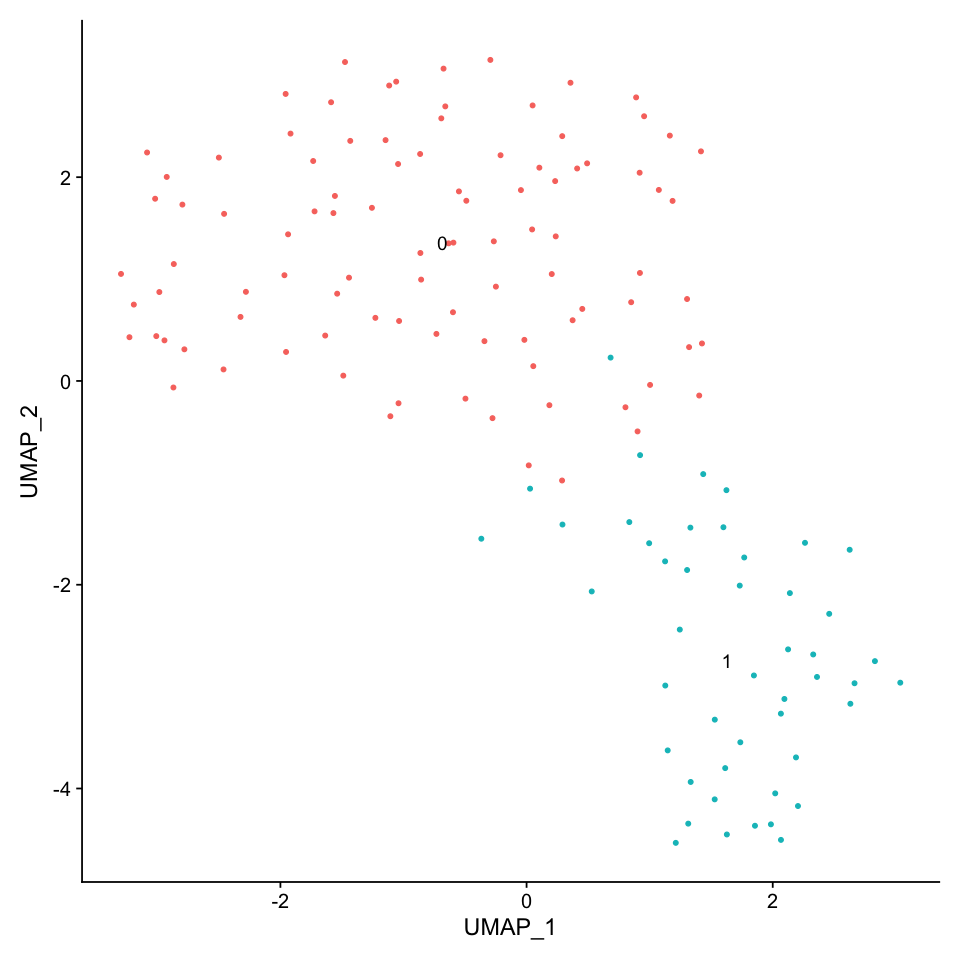

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso_gcm <- RunPCA(seu_HQC_meso_gcm, verbose = FALSE)
# seu_HQC_meso_gcm <- RunTSNE(seu_HQC_meso_gcm, dims = 1:30, verbose = FALSE)
seu_HQC_meso_gcm <- RunUMAP(seu_HQC_meso_gcm, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso_gcm <- FindNeighbors(seu_HQC_meso_gcm, dims = 1:30, verbose = FALSE)
seu_HQC_meso_gcm <- FindClusters(seu_HQC_meso_gcm, verbose = FALSE)
DimPlot(seu_HQC_meso_gcm, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso_gcm, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso_gcm, reduction =  "umap", label = TRUE) + NoLegend()

In [68]:
all.markers.meso_gcm <- FindAllMarkers(object = seu_HQC_meso_gcm, only.pos = TRUE)
all.markers.meso_gcm.top10 <- all.markers.meso_gcm %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1



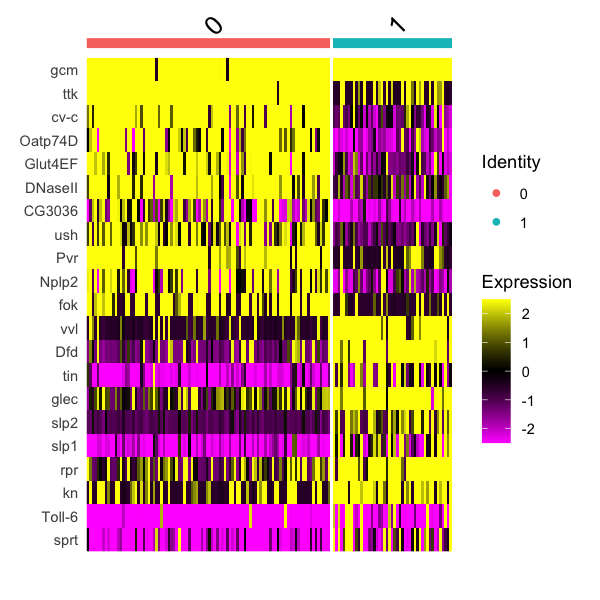

In [69]:
options(repr.plot.width=5, repr.plot.height=5)
DoHeatmap(seu_HQC_meso_gcm, features = c("gcm", all.markers.meso_gcm.top10$gene))

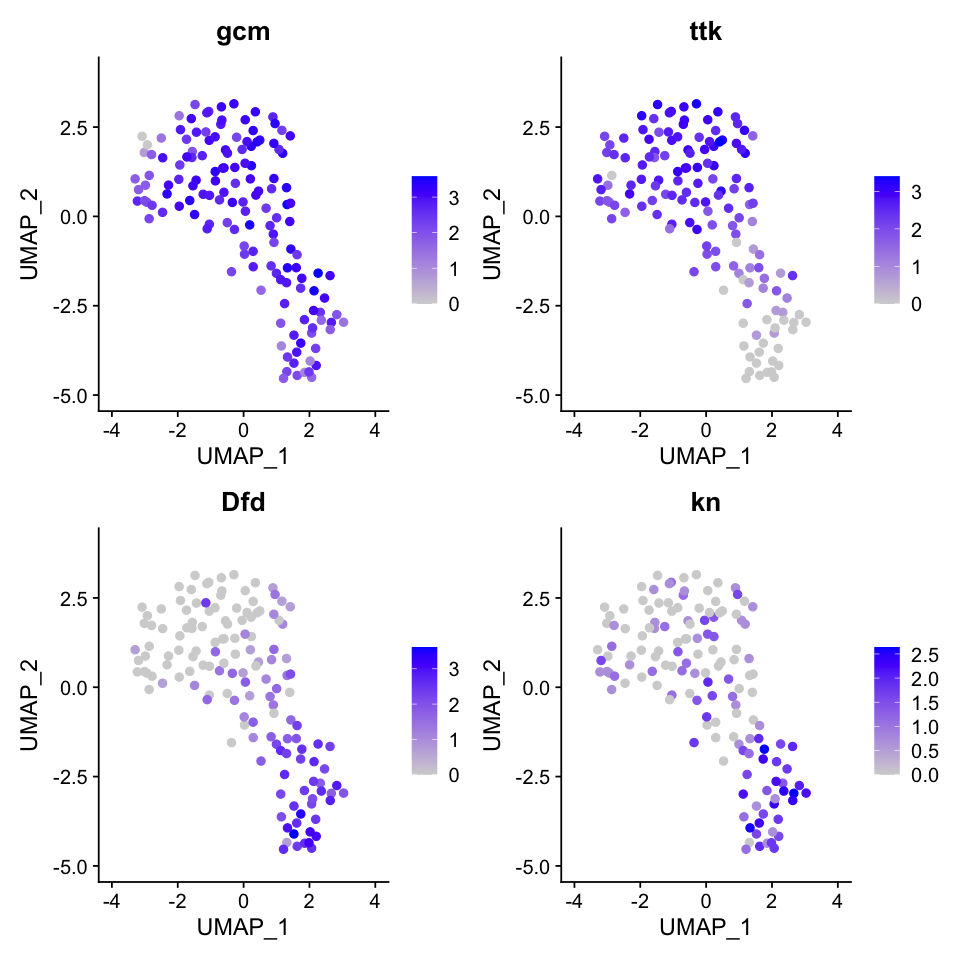

In [70]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_meso_gcm, reduction = "umap", features =c("gcm", "ttk","Dfd","kn"), pt.size = 2,  ncol = 2)

### Add annotation

In [71]:
# test <- seu_HQC_meso_gcm$seurat_clusters
# test <- as.data.frame(test)
# head(test)

In [72]:
# colnames(test) <- c("ID")
# head(test)

In [73]:
manual_ID_gcm <- as.data.frame(seu_HQC_meso_gcm$seurat_clusters)
colnames(manual_ID_gcm) <- c("manual_ID")
manual_ID_gcm$manual_ID <- dplyr::recode(manual_ID_gcm$manual_ID,
                                         "0" = "mesoderm_gcm", #Dfd-
                                         "1" = "mesoderm_gcm_Dfd", #Dfd+
                                         )

head(manual_ID_gcm)

,manual_ID
,<fct>
AAACGCTCAGCCCACA,mesoderm_gcm_Dfd
AAAGTGATCTATCACT,mesoderm_gcm
AACCTTTTCGAGAACG,mesoderm_gcm
AACTTCTGTAGTGGCA,mesoderm_gcm_Dfd
AAGAACAAGCAGGTCA,mesoderm_gcm
AAGATAGTCACTCTTA,mesoderm_gcm


In [74]:
write.table(manual_ID_gcm, file="./manual_ID_list/seu_HQC_meso_gcm_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [75]:
seu_HQC_meso_gcm$manual_ID <- manual_ID_gcm

Calculating cluster mesoderm_gcm

Calculating cluster mesoderm_gcm_Dfd



[1] 219   7

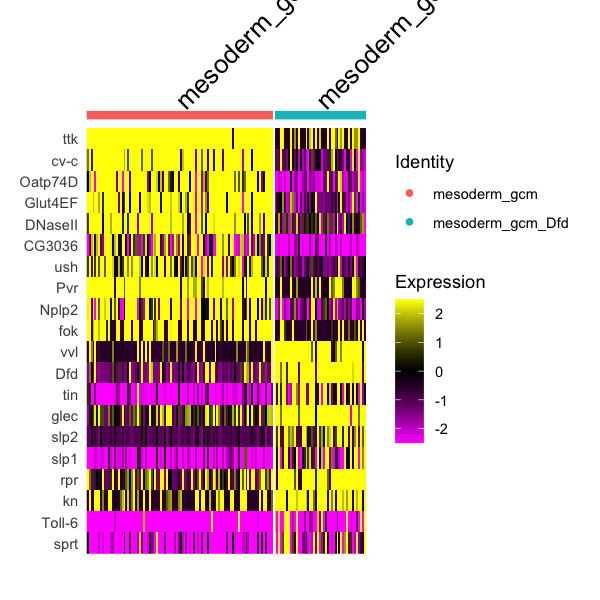

In [76]:
Idents(seu_HQC_meso_gcm) <- 'manual_ID'
all.markers <- FindAllMarkers(seu_HQC_meso_gcm, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
options(repr.plot.width=5, repr.plot.height=5)
DoHeatmap(seu_HQC_meso_gcm, features = c(all.markers.top10$gene))
write.table(all.markers, file = './subcluster_markers/markers_meso_gcm.txt', sep = '\t')

Saving 7 x 7 in image



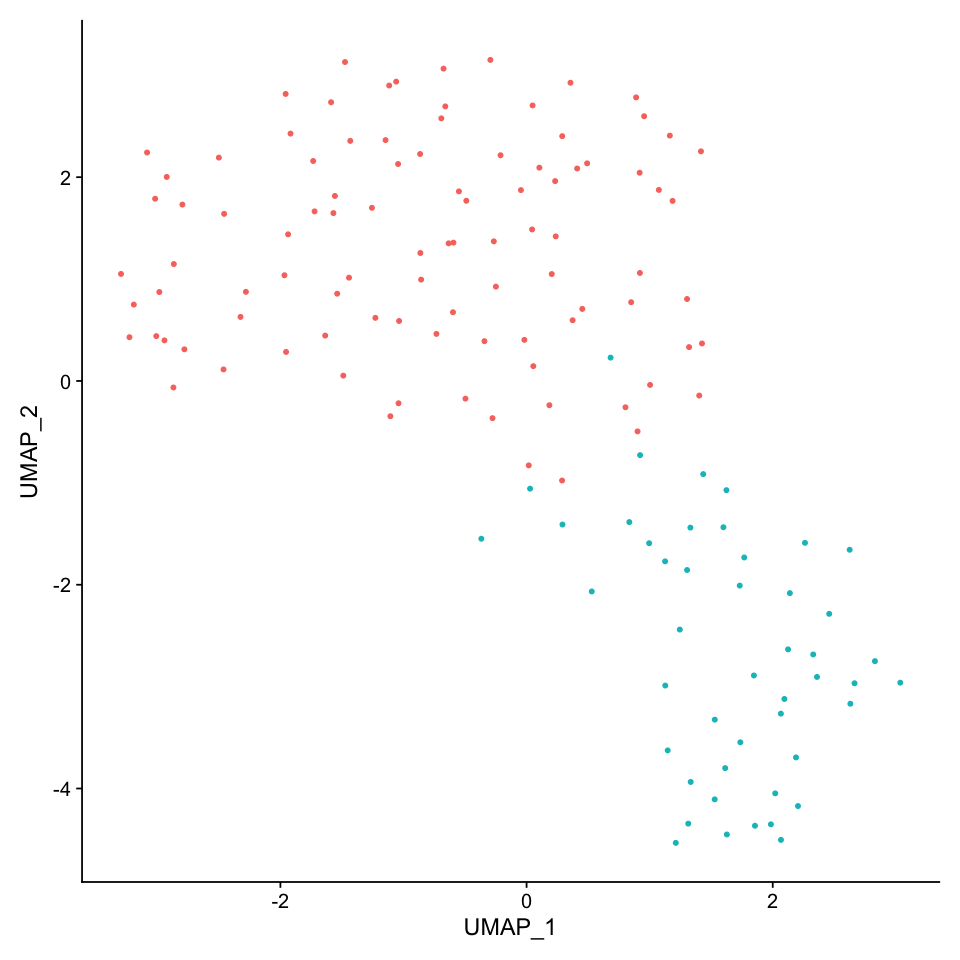

In [77]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso_gcm, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/gcm_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



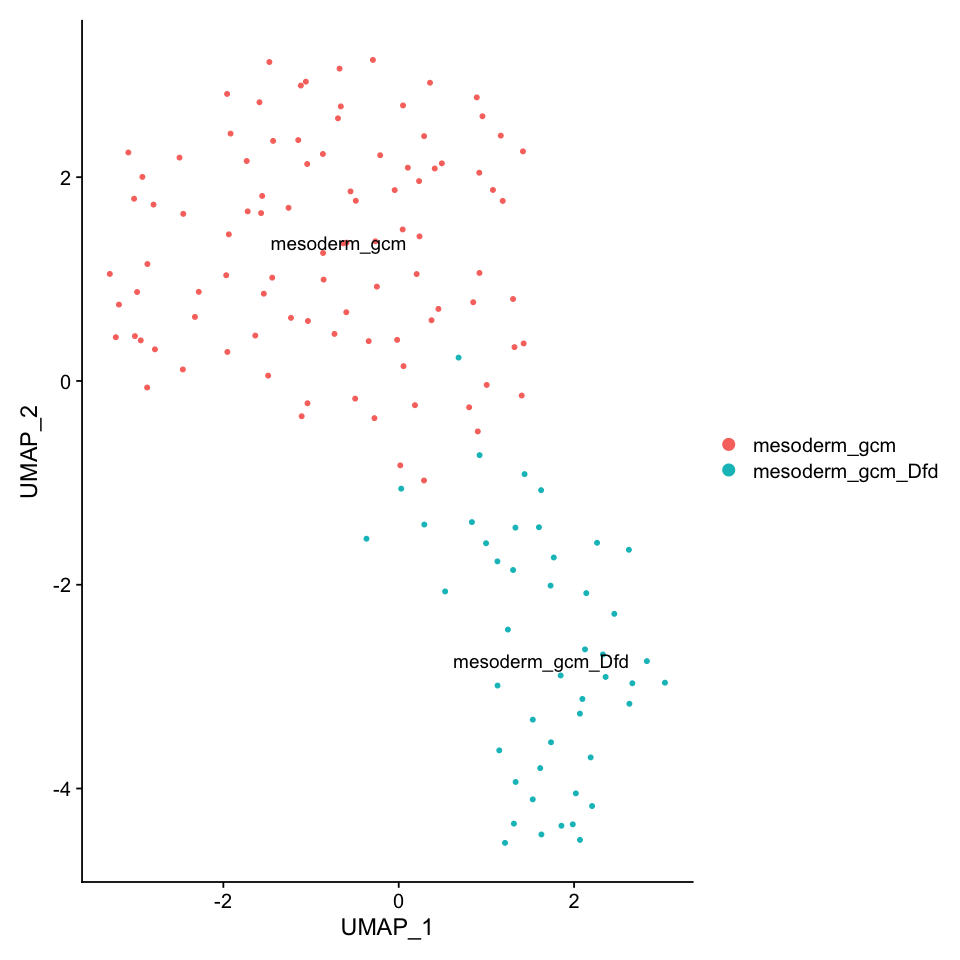

In [78]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso_gcm, reduction =  "umap", label = TRUE) 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/gcm_meso_umap2.eps", dpi = 300)

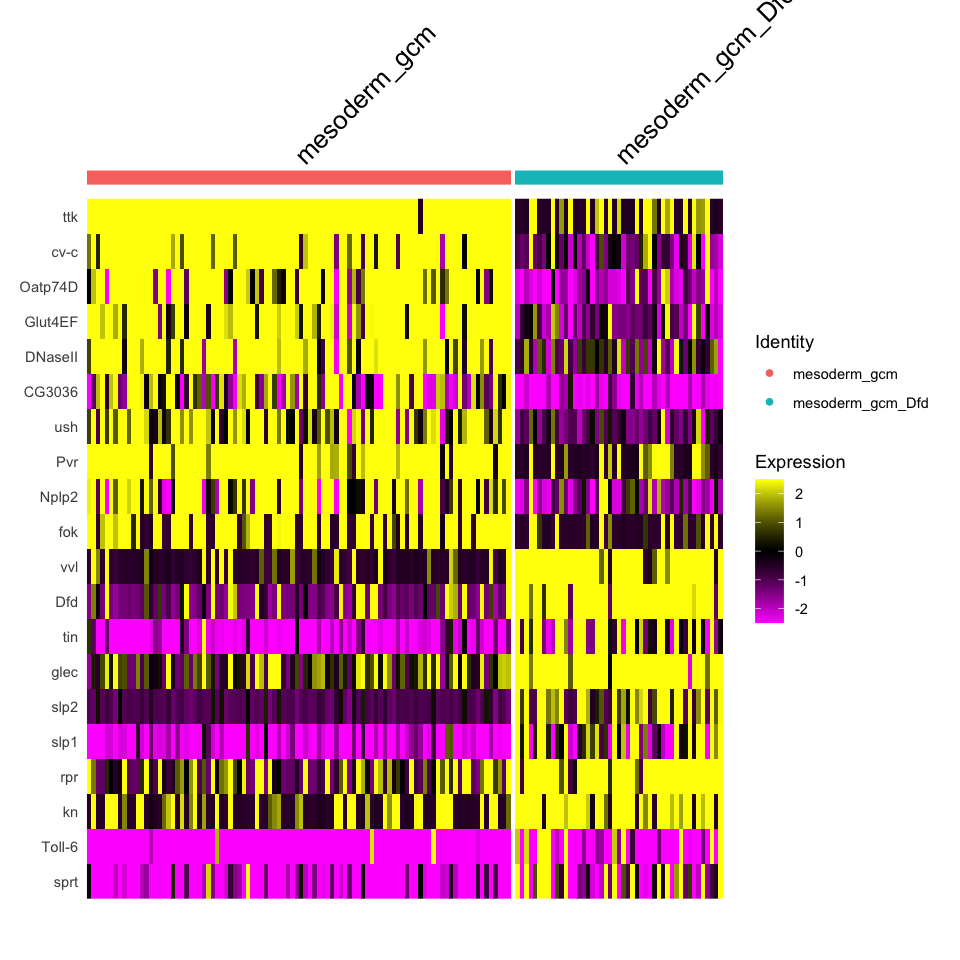

In [79]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_meso_gcm,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/gcm_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

In [80]:
DefaultAssay(seu_HQC_meso_gcm) <- 'RNA'
seu_HQC_meso_gcm_renorm <- suppressWarnings(SCTransform(seu_HQC_meso_gcm, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

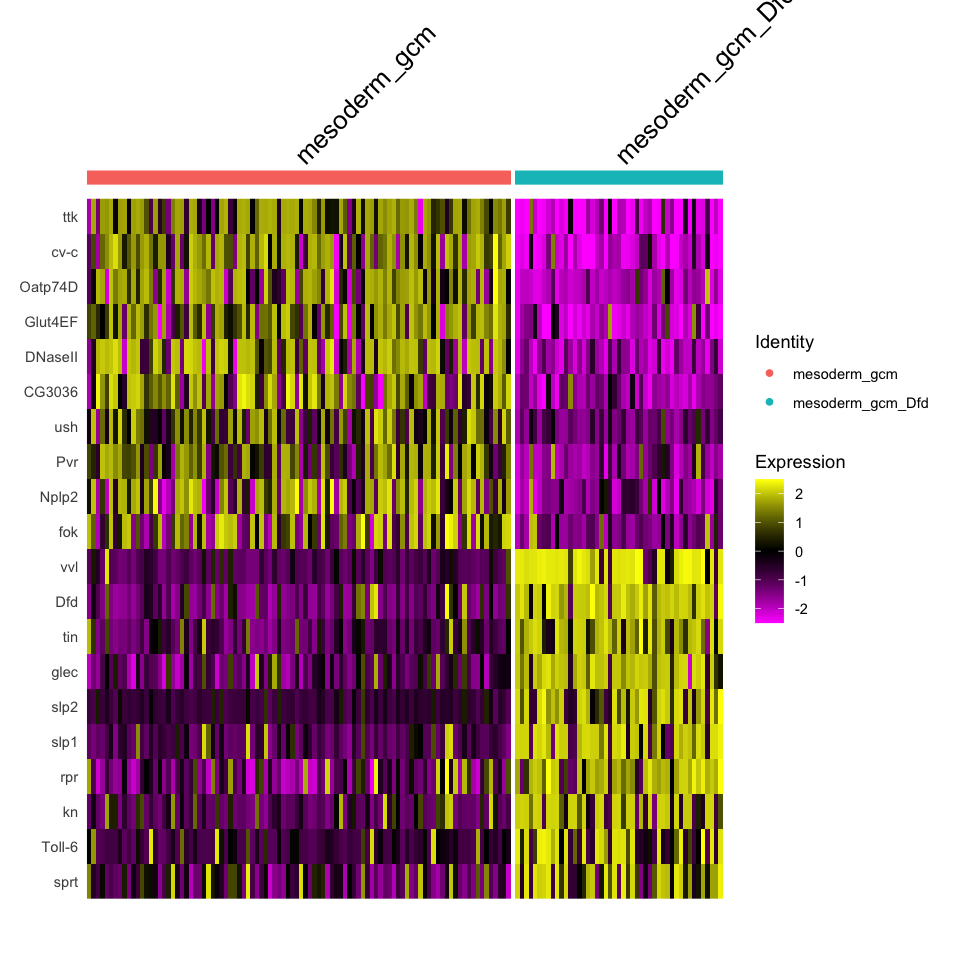

In [81]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_meso_gcm_renorm,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/gcm_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

## Anterior midgut and head mesoderm
### picking up target clusters

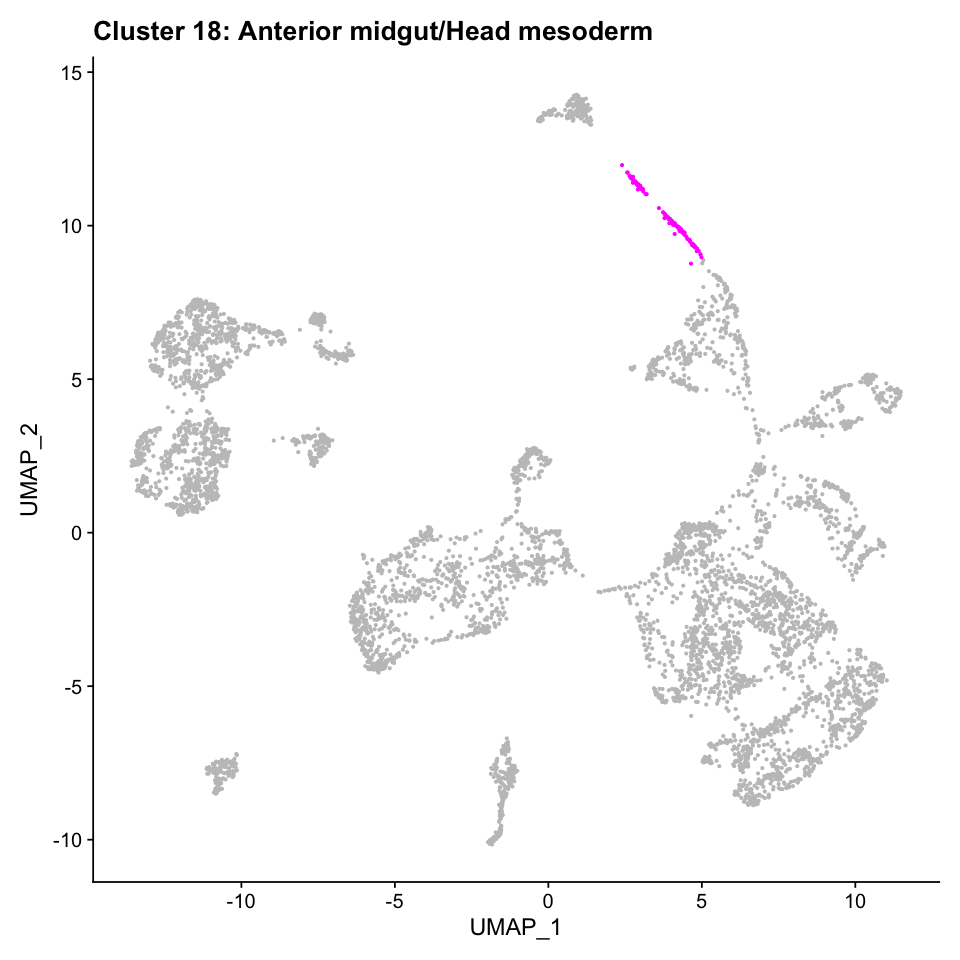

In [82]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(18))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 18: Anterior midgut/Head mesoderm')

In [83]:
seu_HQC_ant_end_meso <- subset(seu_HQC, ident = 18)
seu_HQC_ant_end_meso

An object of class Seurat 
28756 features across 128 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
The number of cells (128) < 500  
Skipping re-normalize

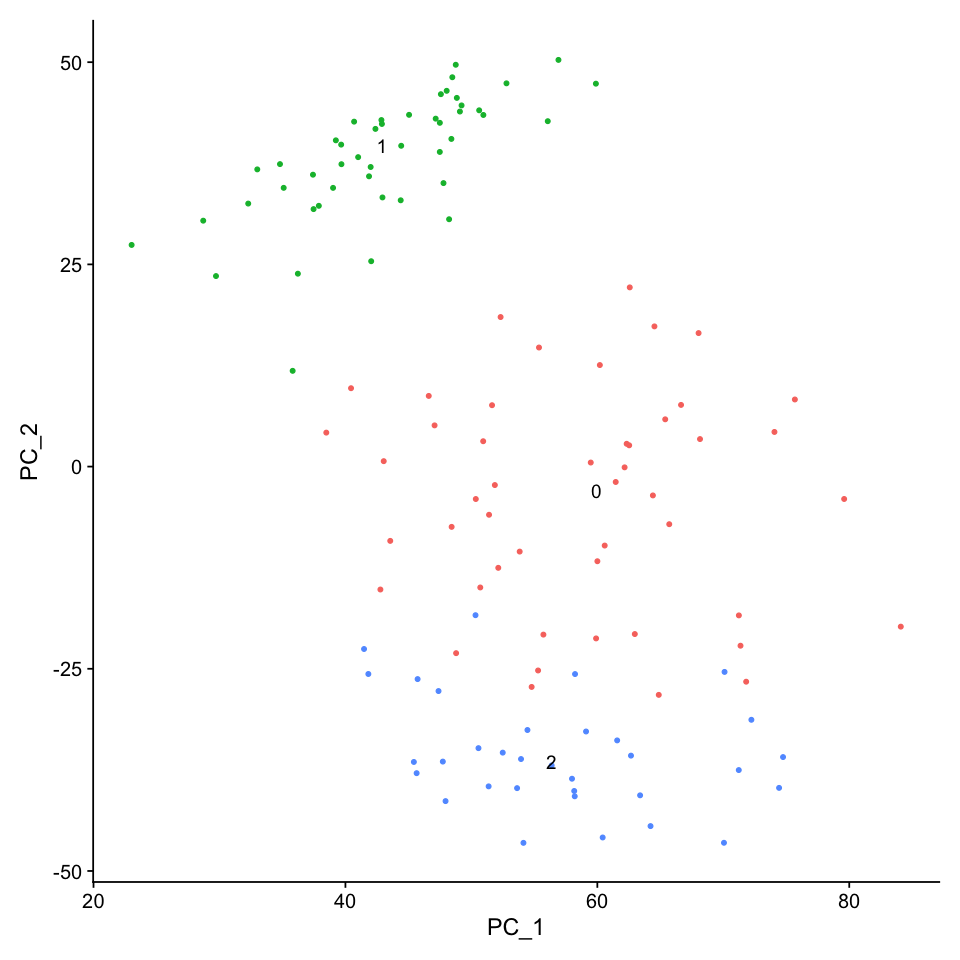

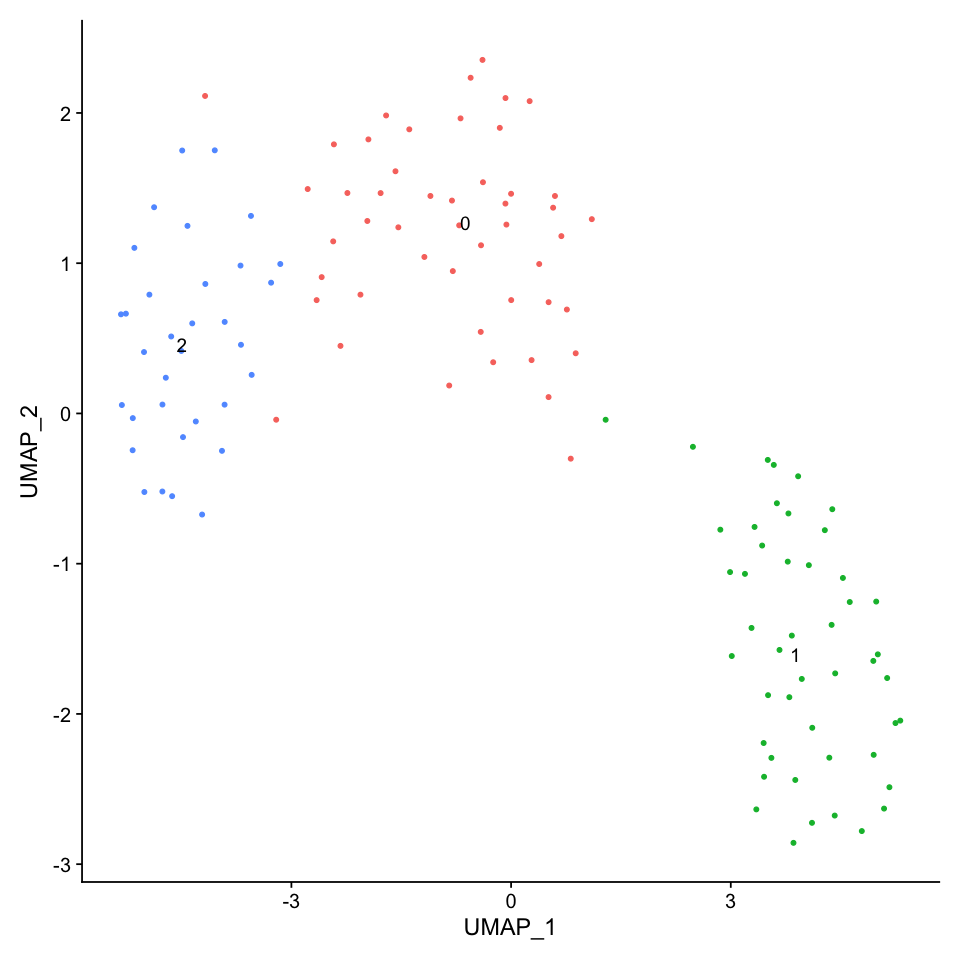

In [84]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_ant_end_meso <- RunPCA(seu_HQC_ant_end_meso, verbose = FALSE)
# seu_HQC_ant_end_meso <- RunTSNE(seu_HQC_ant_end_meso, dims = 1:30, verbose = FALSE)
seu_HQC_ant_end_meso <- RunUMAP(seu_HQC_ant_end_meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_ant_end_meso <- FindNeighbors(seu_HQC_ant_end_meso, dims = 1:30, verbose = FALSE)
seu_HQC_ant_end_meso <- FindClusters(seu_HQC_ant_end_meso, verbose = FALSE)
DimPlot(seu_HQC_ant_end_meso, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_ant_end_meso, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_ant_end_meso, reduction =  "umap", label = TRUE) + NoLegend()

In [85]:
levels(seu_HQC_ant_end_meso) <- c(1,0,2)
all.markers.ant_end_meso <- FindAllMarkers(object = seu_HQC_ant_end_meso, only.pos = TRUE)
nrow(all.markers.ant_end_meso)
all.markers.ant_end_meso.top10 <- all.markers.ant_end_meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.ant_end_meso.top10)

Calculating cluster 1

Calculating cluster 0

Calculating cluster 2



[1] 577

[1] 30

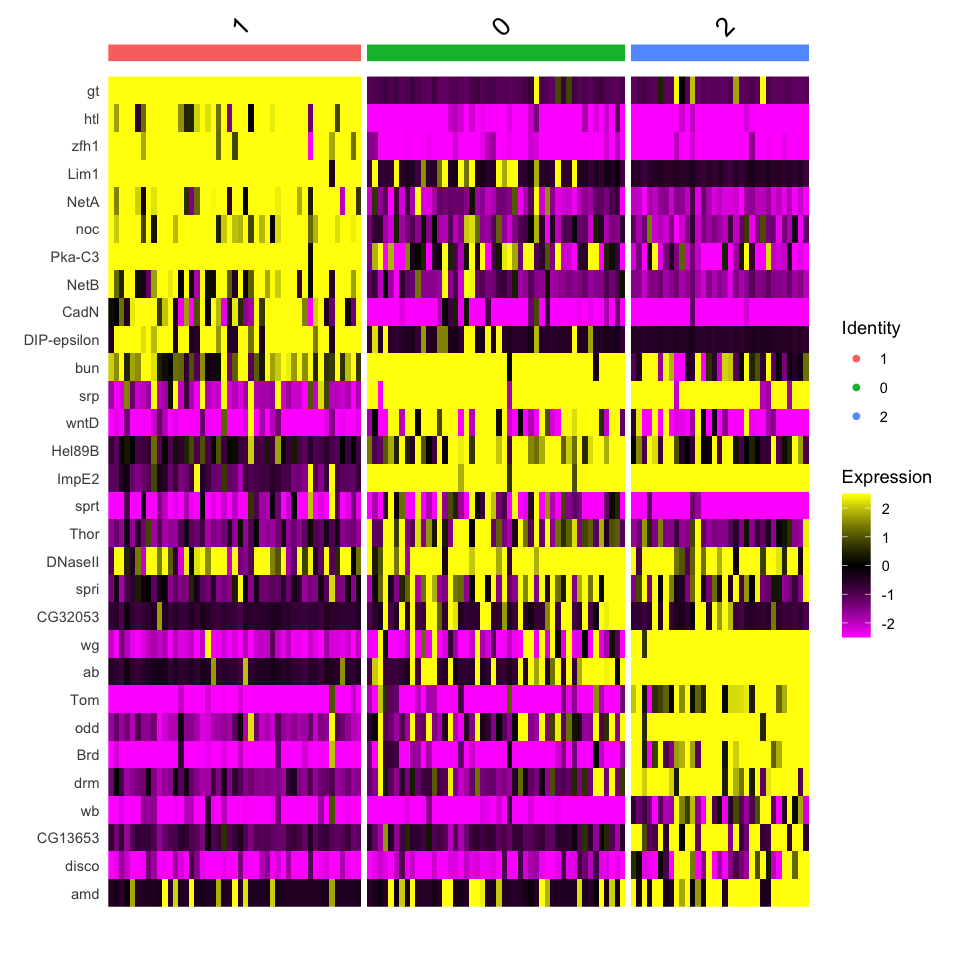

In [86]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_ant_end_meso, features = c(all.markers.ant_end_meso.top10$gene))

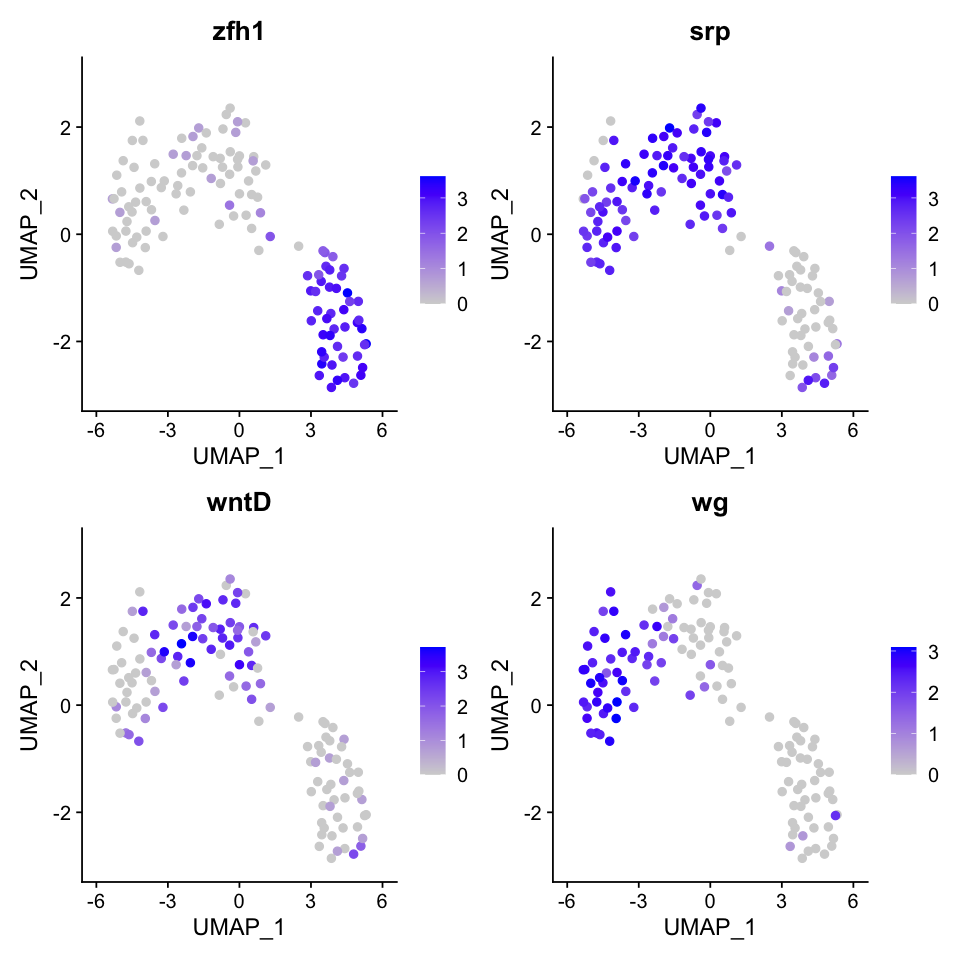

In [87]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_ant_end_meso, reduction = "umap", features =c("zfh1","srp","wntD","wg"), pt.size = 2,  ncol = 2)

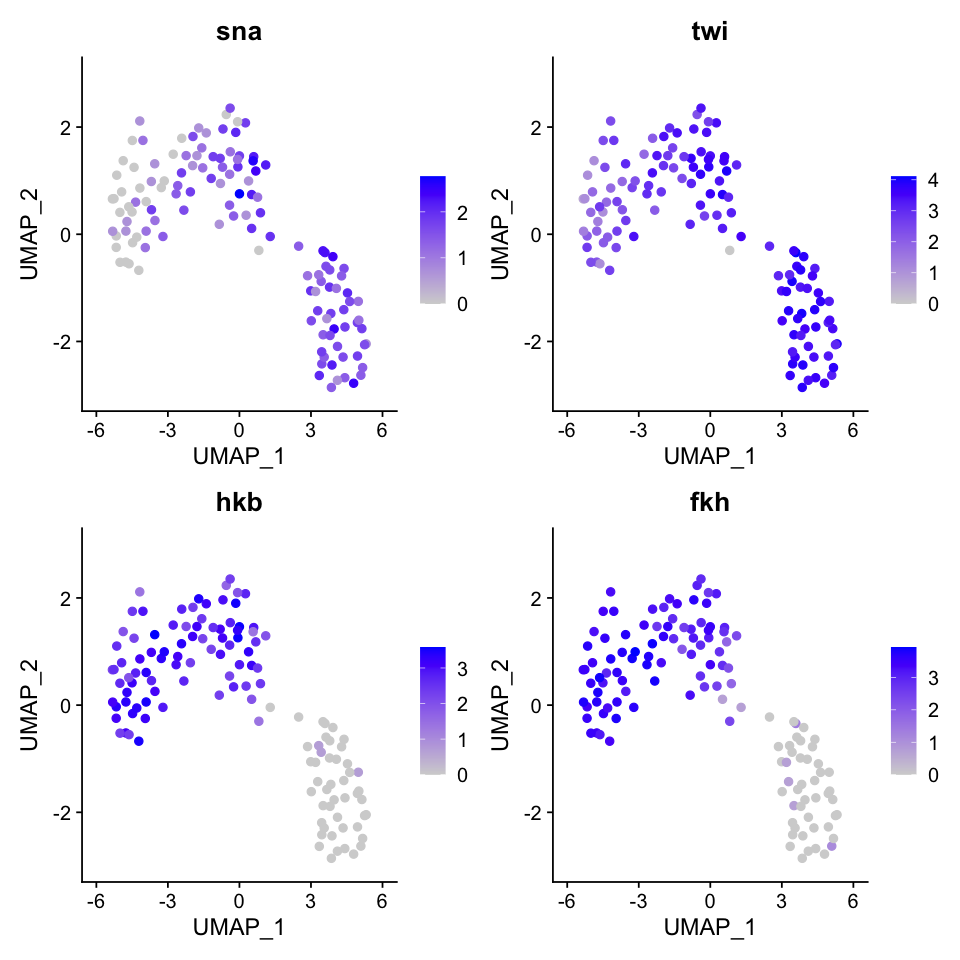

In [88]:
#major mesoderm/endoderm maker genes
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_ant_end_meso, reduction = "umap", features =c("sna","twi","hkb","fkh"), pt.size = 2,  ncol = 2)

### Add annotation

In [89]:
manual_ID_ant <- as.data.frame(seu_HQC_ant_end_meso$seurat_clusters)
colnames(manual_ID_ant) <- c('manual_ID')
head(manual_ID_ant)
manual_ID_ant$manual_ID <- dplyr::recode(manual_ID_ant$manual_ID,
                                    "1" = "mesoderm_head", #CadN+, srp-, sna+, twi+
                                    "0" = "endoderm_antMG_wntD", #CadN-, srp+, wntD+, sna+, twi+
                                    "2" = "endoderm_antMG_wg", #CadN-, srp+, wg+, sna+, twi+
                                    )
head(manual_ID_ant)

,manual_ID
,<fct>
AAAGAACGTGTTCGTA,0
AACACACTCGTGGAAG,1
AACCTTTCACCCTCTA,0
AATGCCAAGTCAGGGT,1
ACACAGTAGAAGGATG,1
ACAGCCGGTTAGGCTT,0


,manual_ID
,<fct>
AAAGAACGTGTTCGTA,endoderm_antMG_wntD
AACACACTCGTGGAAG,mesoderm_head
AACCTTTCACCCTCTA,endoderm_antMG_wntD
AATGCCAAGTCAGGGT,mesoderm_head
ACACAGTAGAAGGATG,mesoderm_head
ACAGCCGGTTAGGCTT,endoderm_antMG_wntD


In [90]:
write.table(manual_ID_ant, file="./manual_ID_list/seu_HQC_ant_end_meso_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [91]:
seu_HQC_ant_end_meso$manual_ID <- manual_ID_ant

Calculating cluster endoderm_antMG_wg

Calculating cluster endoderm_antMG_wntD

Calculating cluster mesoderm_head



[1] 577   7

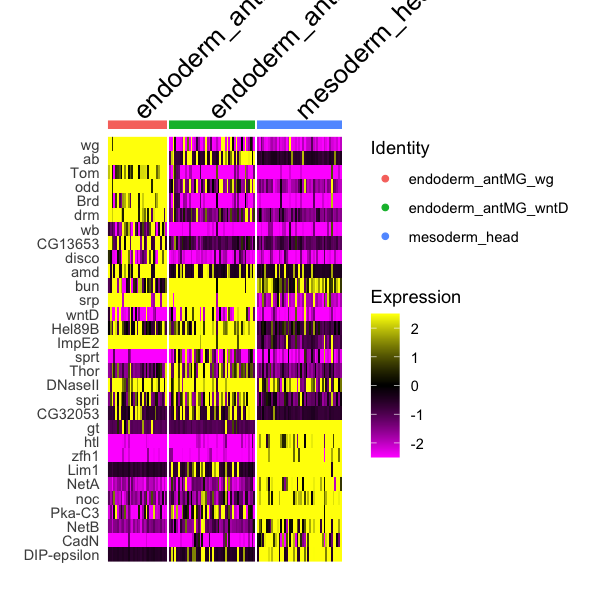

In [92]:
Idents(seu_HQC_ant_end_meso) <- 'manual_ID'
levels(seu_HQC_ant_end_meso) <- c('endoderm_antMG_wg','endoderm_antMG_wntD','mesoderm_head')
all.markers <- FindAllMarkers(seu_HQC_ant_end_meso, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
options(repr.plot.width=5, repr.plot.height=5)
DoHeatmap(seu_HQC_ant_end_meso, features = c(all.markers.top10$gene))
write.table(all.markers, file = './subcluster_markers/markers_ant_meso.txt', sep = '\t')

Saving 7 x 7 in image



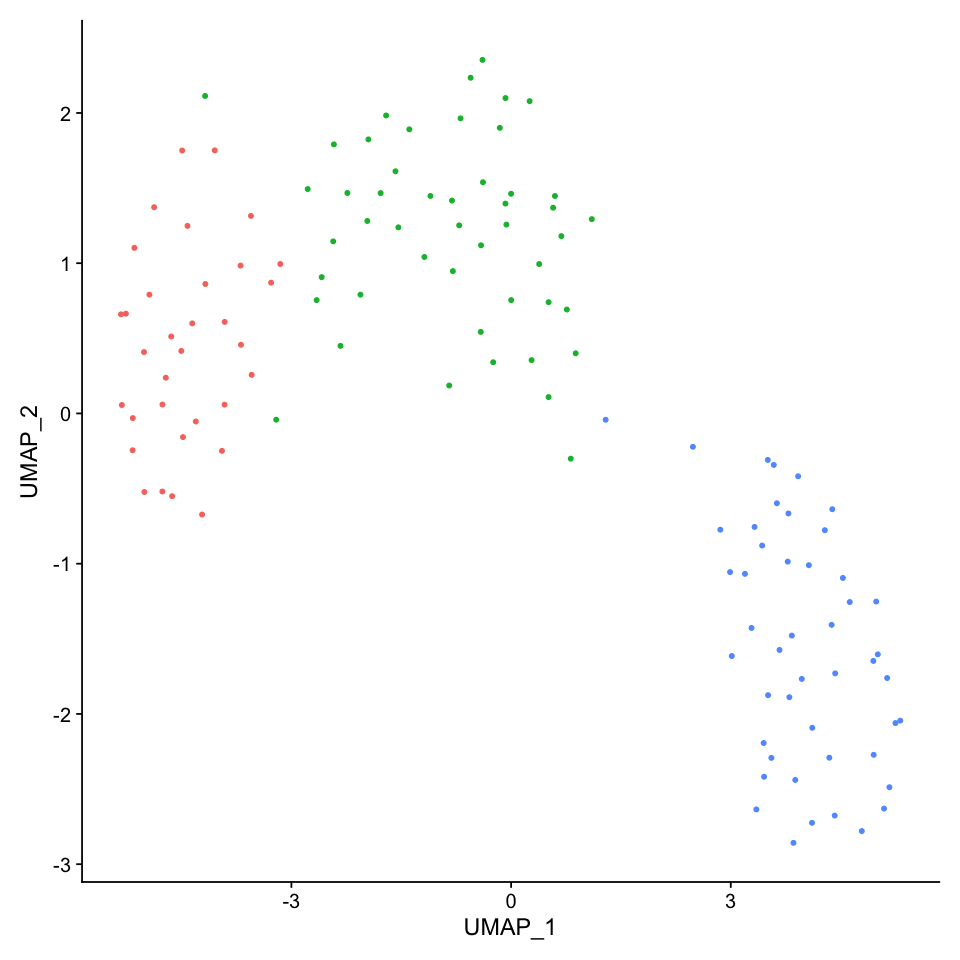

In [93]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_ant_end_meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



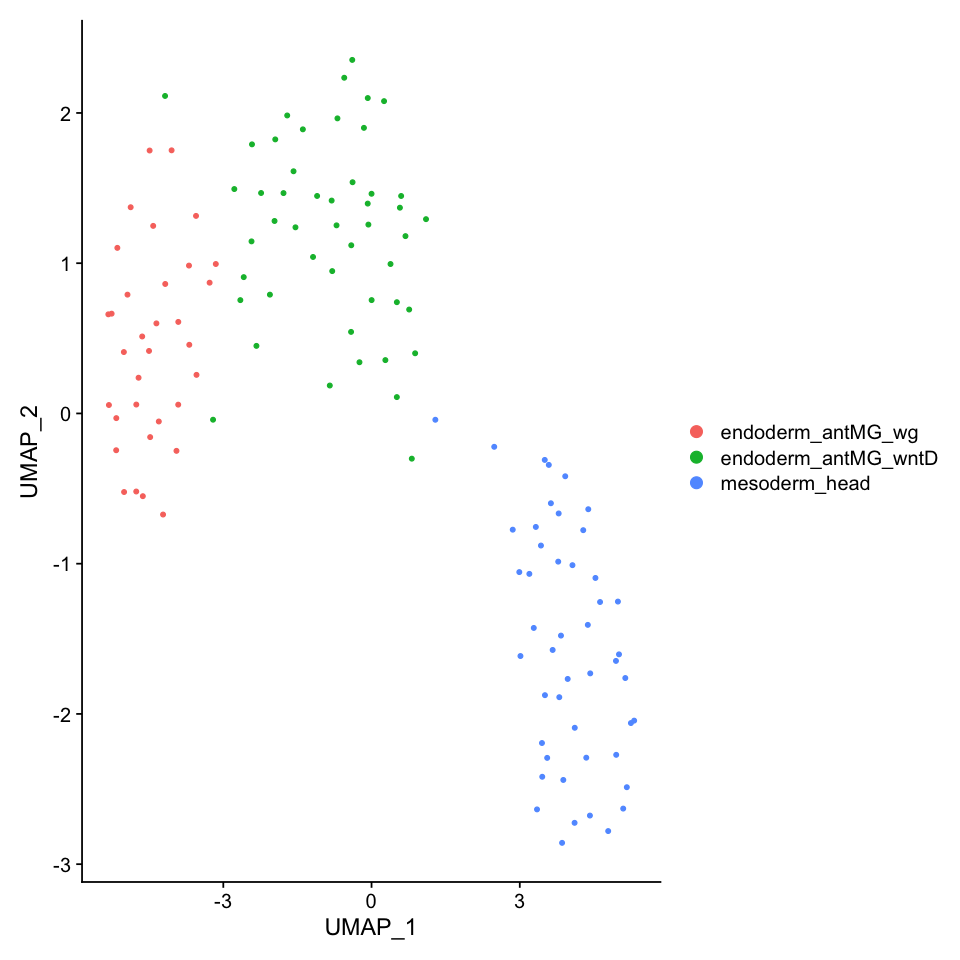

In [94]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_ant_end_meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_umap2.eps", dpi = 300)

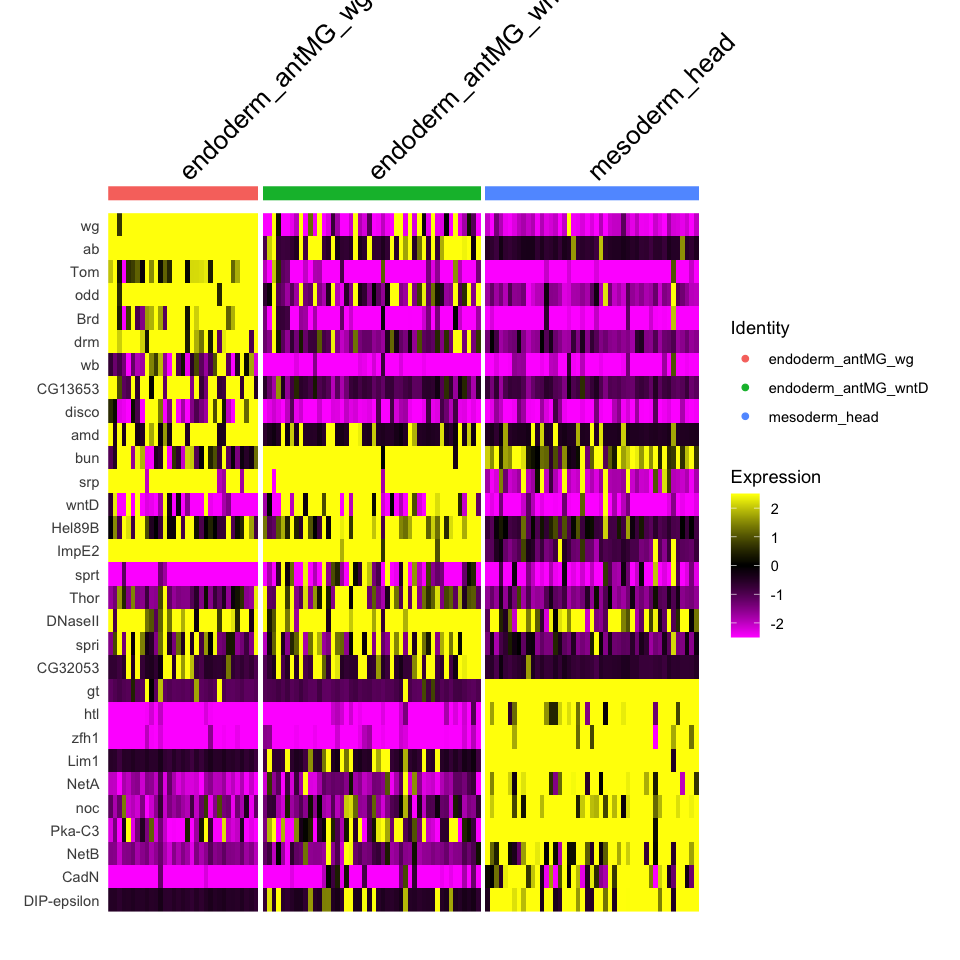

In [95]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_ant_end_meso,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

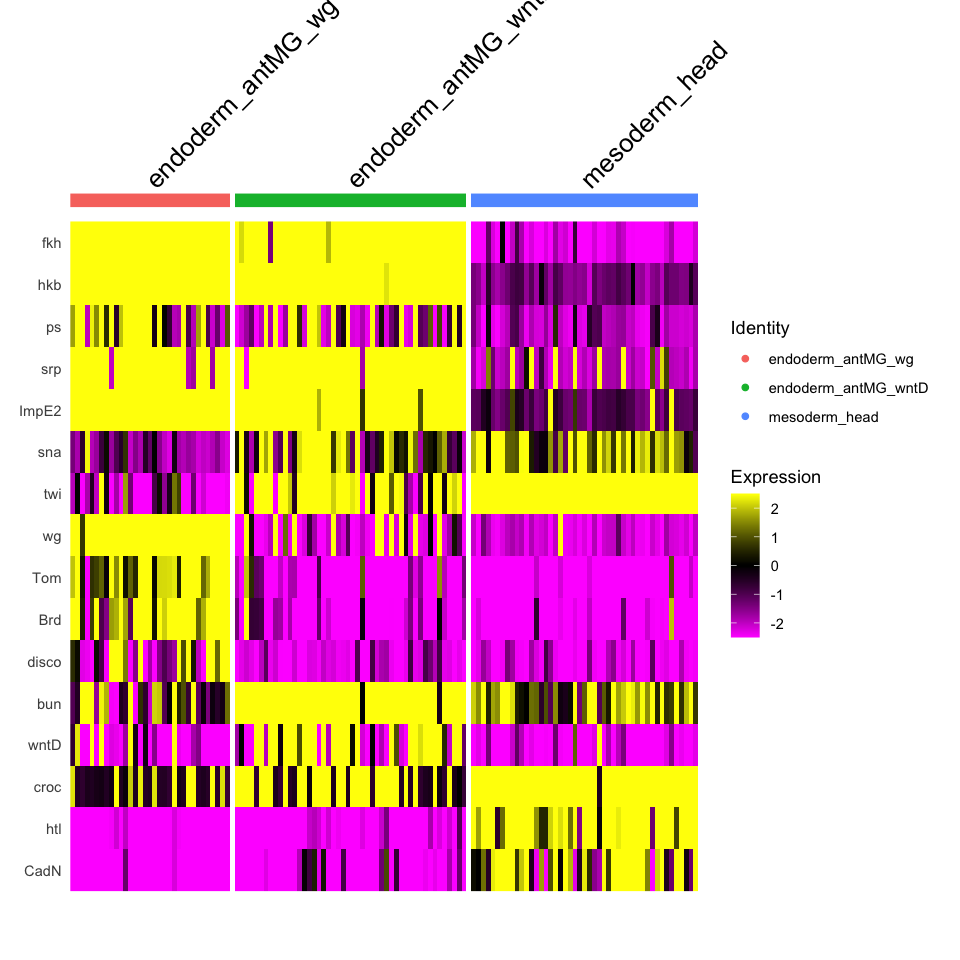

In [96]:
f <- c('fkh','hkb','ps','srp','ImpE2','sna','twi',
       'wg','Tom','Brd','disco','bun','wntD',
       'croc','htl','CadN')
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_ant_end_meso,  features = f)
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_manualID_heatmap_selected.eps", dpi = 300,  width = 12, height = 8)

In [97]:
#renormalize for heatmap
DefaultAssay(seu_HQC_ant_end_meso) <- 'RNA'
seu_HQC_ant_end_meso_renorm <- suppressWarnings(SCTransform(seu_HQC_ant_end_meso, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

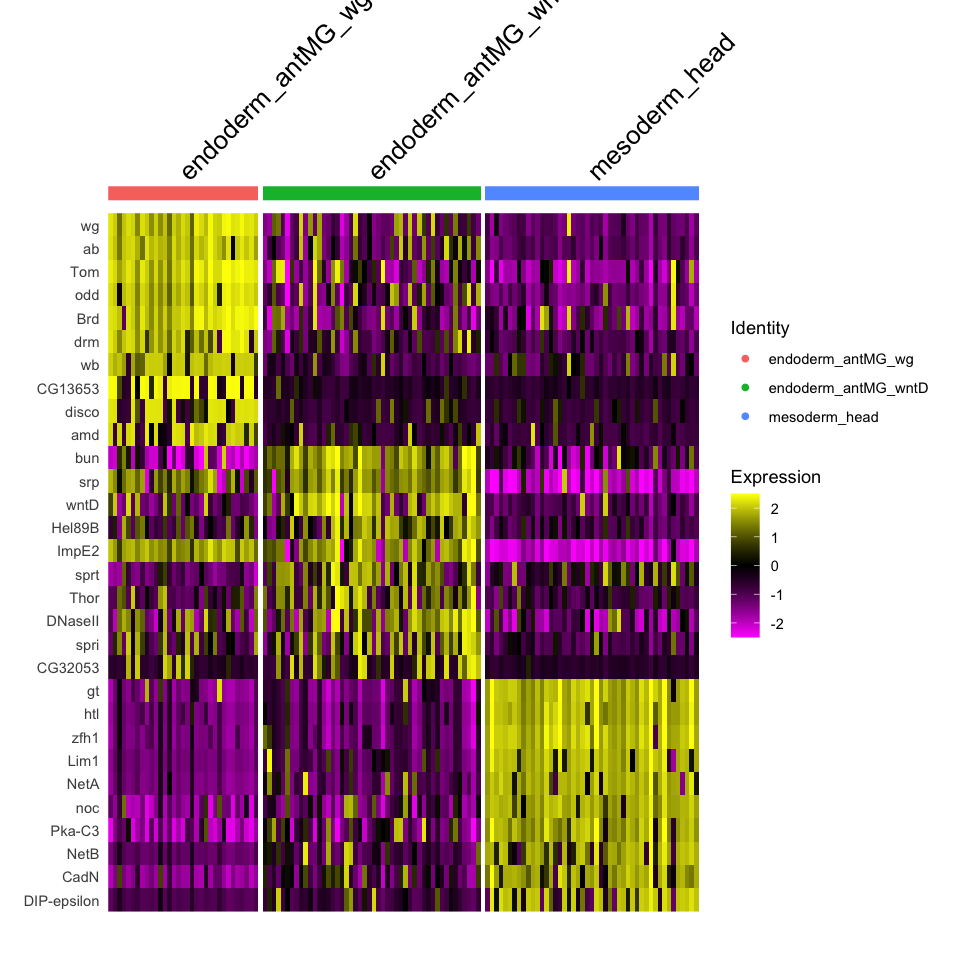

In [98]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_ant_end_meso_renorm,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

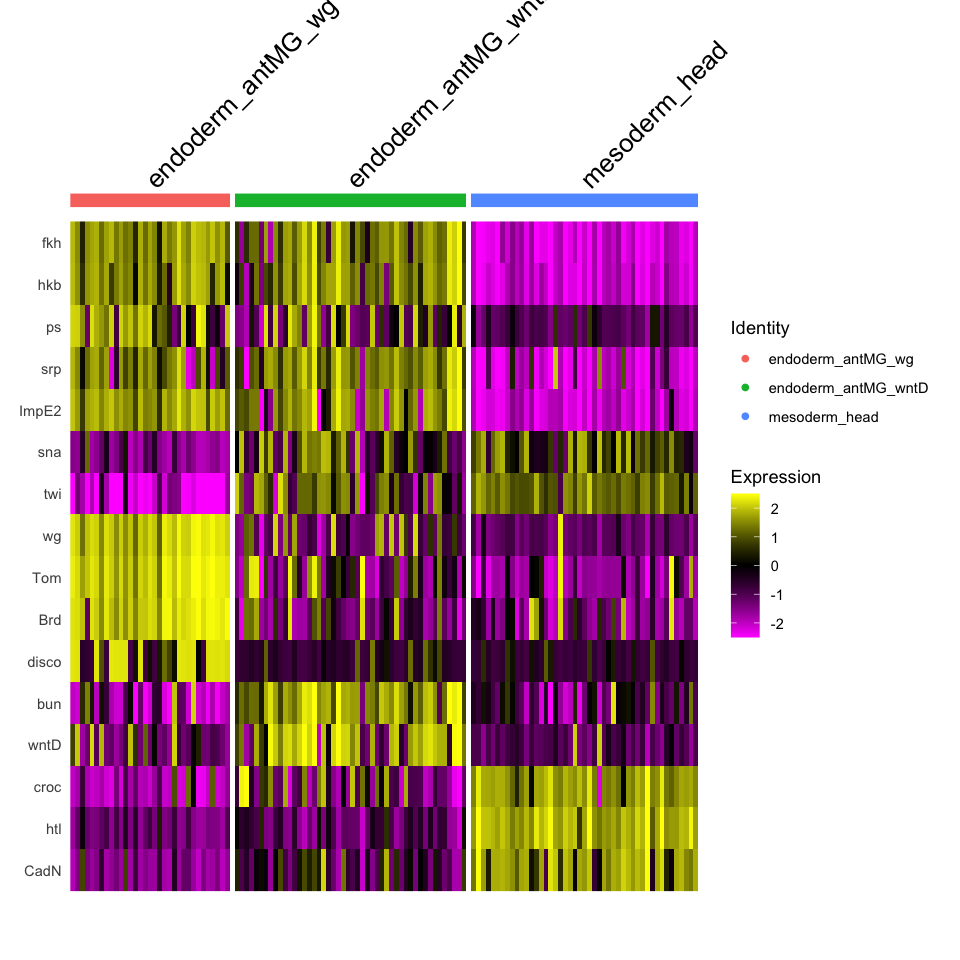

In [99]:
f <- c('fkh','hkb','ps','srp','ImpE2','sna','twi',
       'wg','Tom','Brd','disco','bun','wntD',
       'croc','htl','CadN')
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_ant_end_meso_renorm,  features = f)
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/ant_end_meso_manualID_heatmap_renorm_selected.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS1–2
### picking up tareget cluster

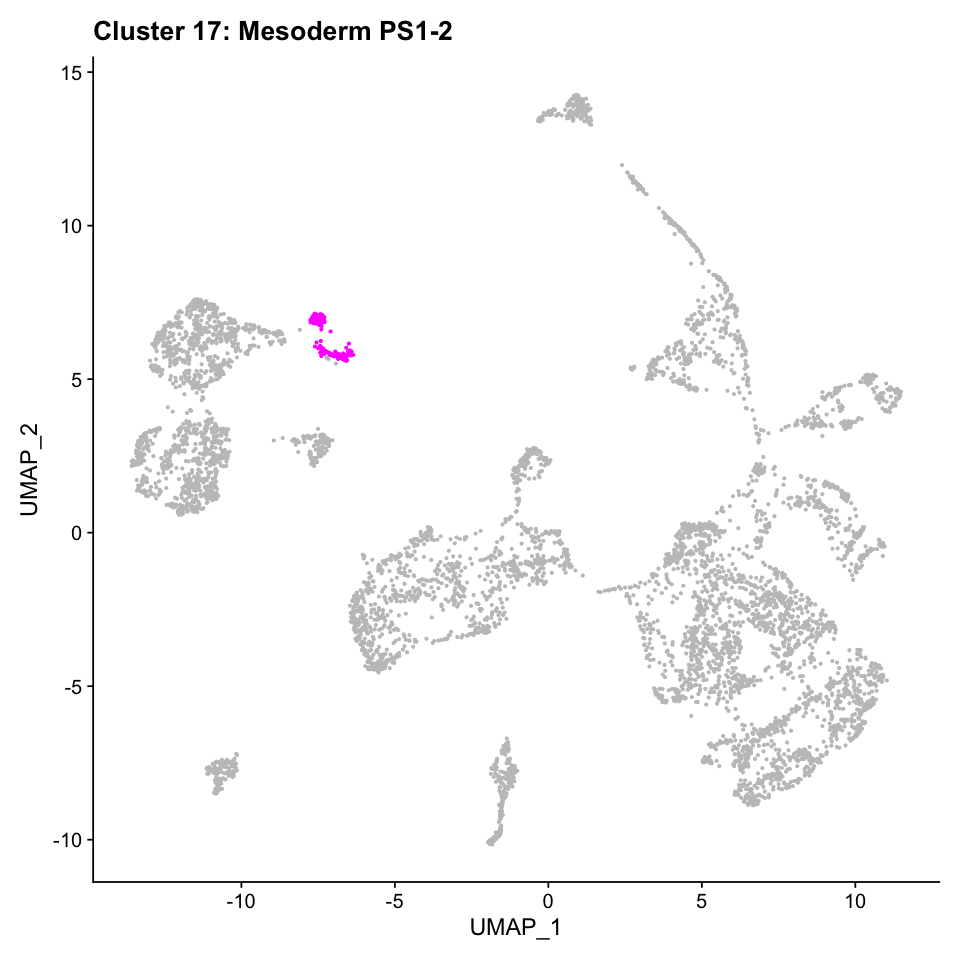

In [100]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(17))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 17: Mesoderm PS1-2')

In [101]:
seu_HQC_dfd_ken_meso <- subset(seu_HQC, ident = 17)
seu_HQC_dfd_ken_meso

An object of class Seurat 
28756 features across 132 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

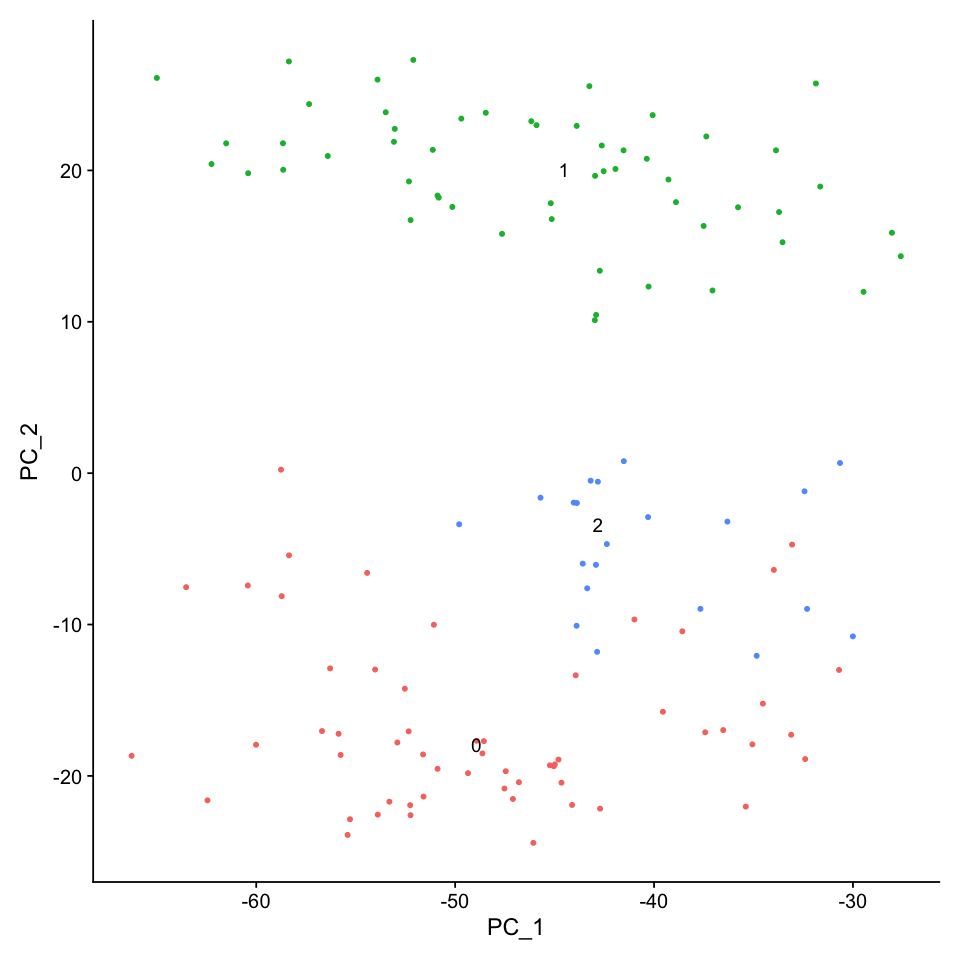

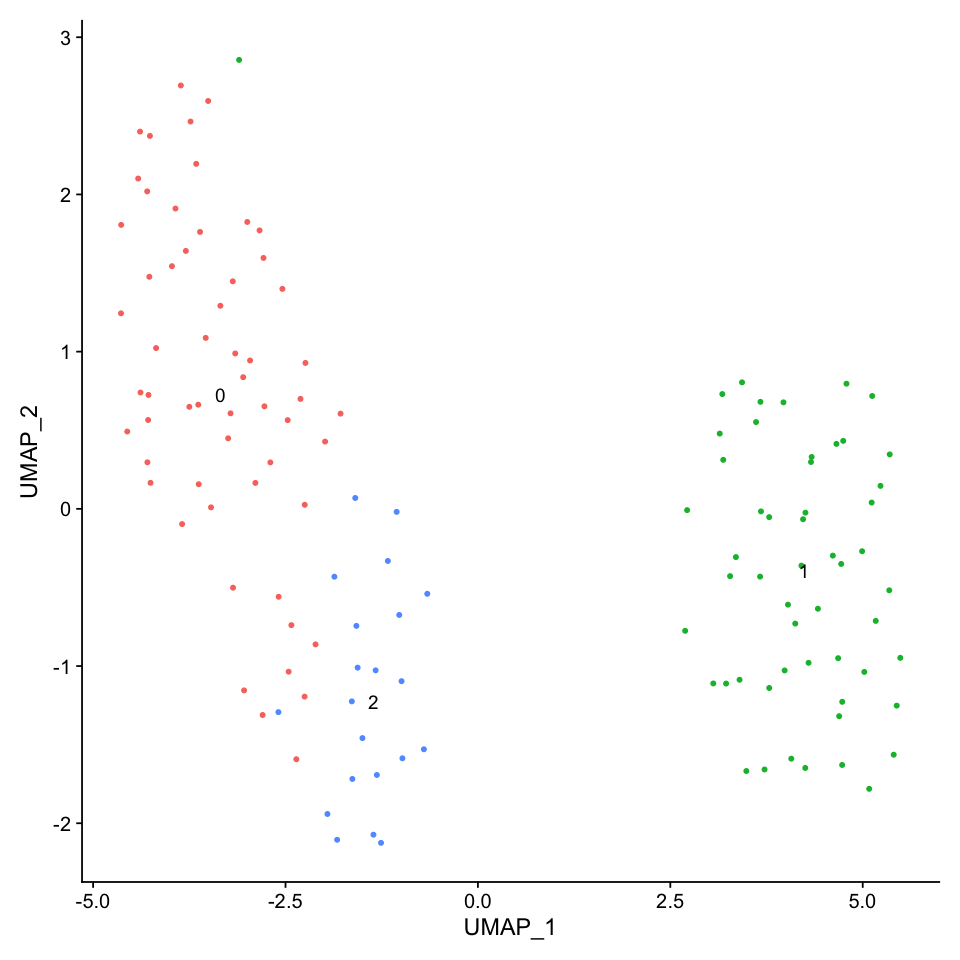

In [102]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_dfd_ken_meso <- RunPCA(seu_HQC_dfd_ken_meso, verbose = FALSE)
# seu_HQC_dfd_ken_meso <- RunTSNE(seu_HQC_dfd_ken_meso, dims = 1:30, verbose = FALSE)
seu_HQC_dfd_ken_meso <- RunUMAP(seu_HQC_dfd_ken_meso, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_dfd_ken_meso <- FindNeighbors(seu_HQC_dfd_ken_meso, dims = 1:30, verbose = FALSE)
seu_HQC_dfd_ken_meso <- FindClusters(seu_HQC_dfd_ken_meso, verbose = FALSE, resolution = 0.9)
DimPlot(seu_HQC_dfd_ken_meso, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_dfd_ken_meso, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_dfd_ken_meso, reduction =  "umap", label = TRUE) + NoLegend()

In [103]:
levels(seu_HQC_dfd_ken_meso) <- c(1,0,2)
all.markers.dfd_ken_meso <- FindAllMarkers(object = seu_HQC_dfd_ken_meso, only.pos = TRUE)
all.markers.dfd_ken_meso.top10 <- all.markers.dfd_ken_meso %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 1

Calculating cluster 0

Calculating cluster 2



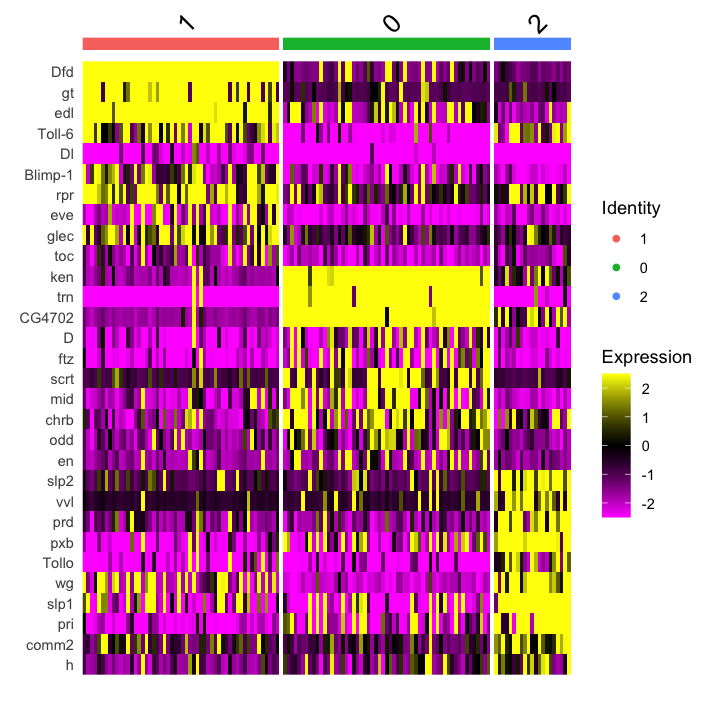

In [104]:
options(repr.plot.width=6, repr.plot.height=6)
DoHeatmap(seu_HQC_dfd_ken_meso, features = c(all.markers.dfd_ken_meso.top10$gene))

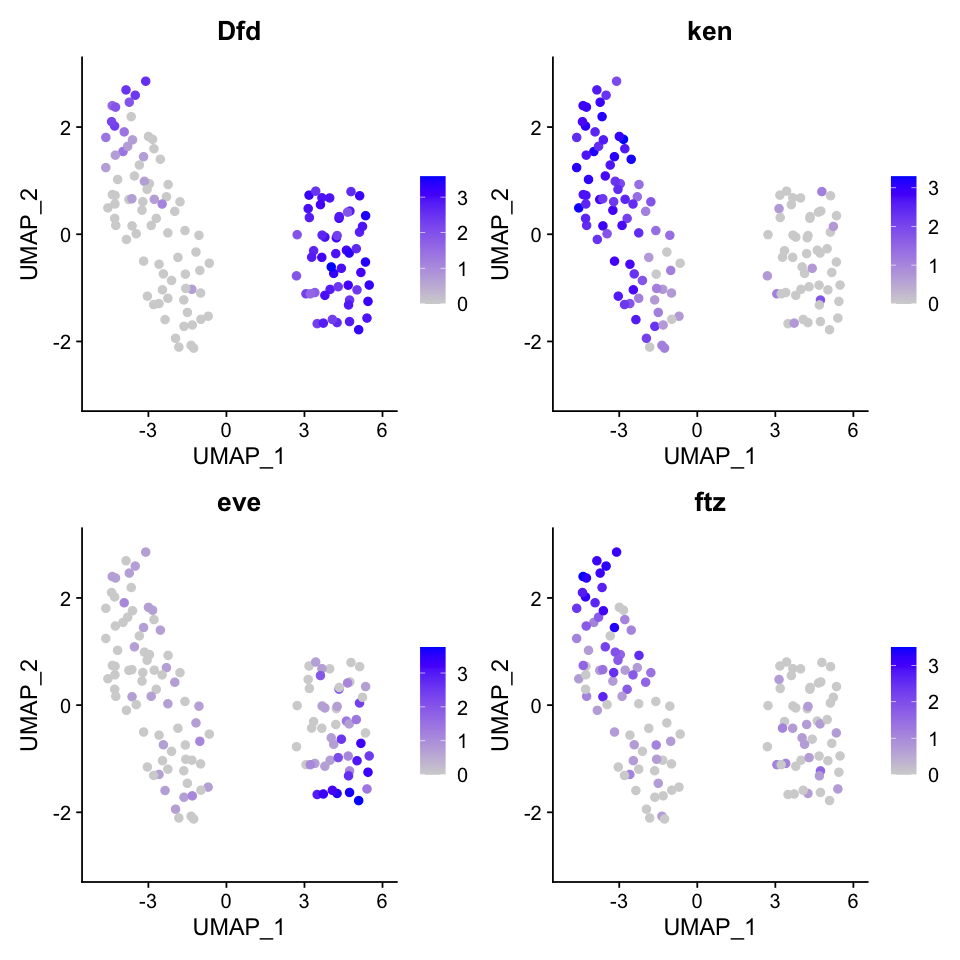

In [105]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_dfd_ken_meso, reduction = "umap", features =c("Dfd","ken","eve","ftz"), pt.size = 2,  ncol = 2)

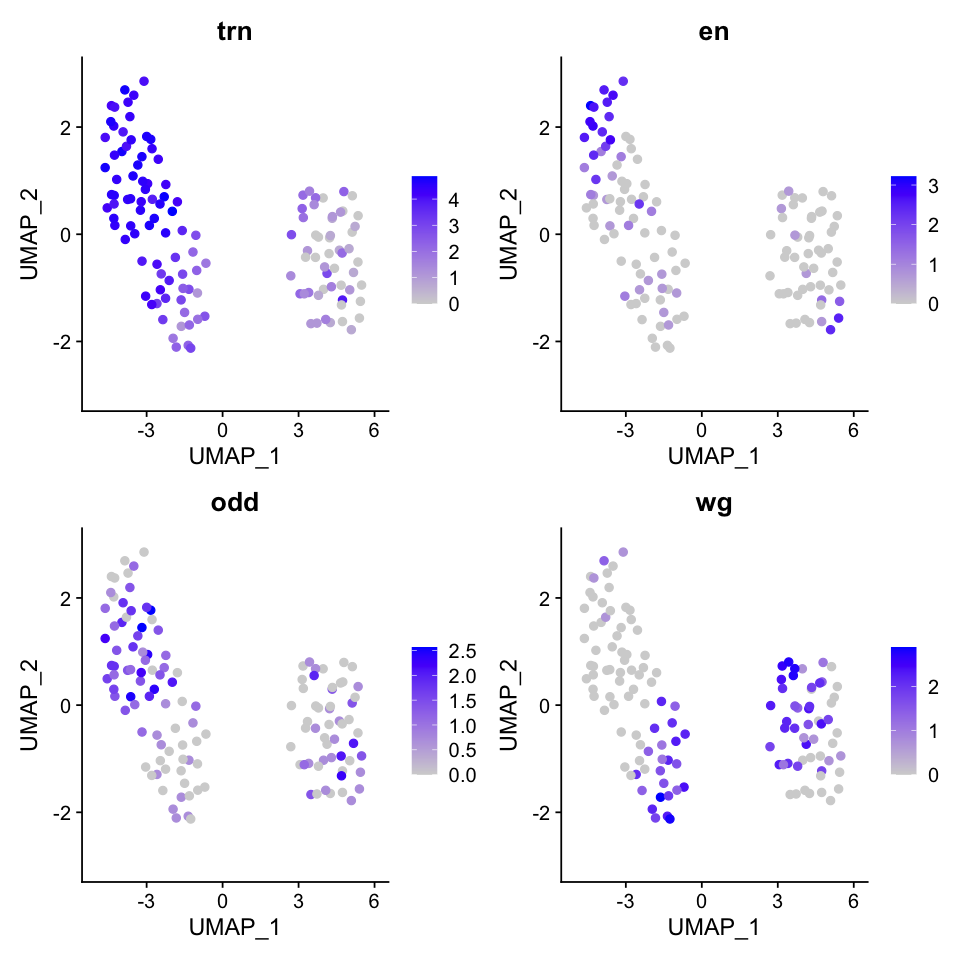

In [106]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_dfd_ken_meso, reduction = "umap", features =c("trn","en","odd","wg"), pt.size = 2,  ncol = 2)

### Add annotation

In [107]:
manual_ID_ps1ps2 <- as.data.frame(seu_HQC_dfd_ken_meso$seurat_clusters)
colnames(manual_ID_ps1ps2) <- c('manual_ID')
head(manual_ID_ps1ps2)
manual_ID_ps1ps2$manual_ID <- dplyr::recode(manual_ID_ps1ps2$manual_ID, 
                                        "2" = "mesoderm_PS2_ken", #Dfd-, slp2+, post. part of parasegment 2
                                        "0" = "mesoderm_PS2_ken", #Dfd-, ant. part of parasegment 2
                                        "1" = "mesoderm_PS1_Dfd", #Dfd+, PS1
                                        )
head(manual_ID_ps1ps2)

,manual_ID
,<fct>
AAAGGATCACTTGAAC,1
AAGCATCAGCTAAATG,1
AAGGAATGTACTGGGA,2
AATAGAGCAAGTATAG,2
AATCACGCAGGTACGA,0
AATCGACCACCTGTCT,0


,manual_ID
,<fct>
AAAGGATCACTTGAAC,mesoderm_PS1_Dfd
AAGCATCAGCTAAATG,mesoderm_PS1_Dfd
AAGGAATGTACTGGGA,mesoderm_PS2_ken
AATAGAGCAAGTATAG,mesoderm_PS2_ken
AATCACGCAGGTACGA,mesoderm_PS2_ken
AATCGACCACCTGTCT,mesoderm_PS2_ken


In [108]:
write.table(manual_ID_ps1ps2, file="./manual_ID_list/seu_HQC_meso_dfd_ken_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [109]:
seu_HQC_dfd_ken_meso$manual_ID <- manual_ID_ps1ps2

Calculating cluster mesoderm_PS1_Dfd

Calculating cluster mesoderm_PS2_ken



[1] 139   7

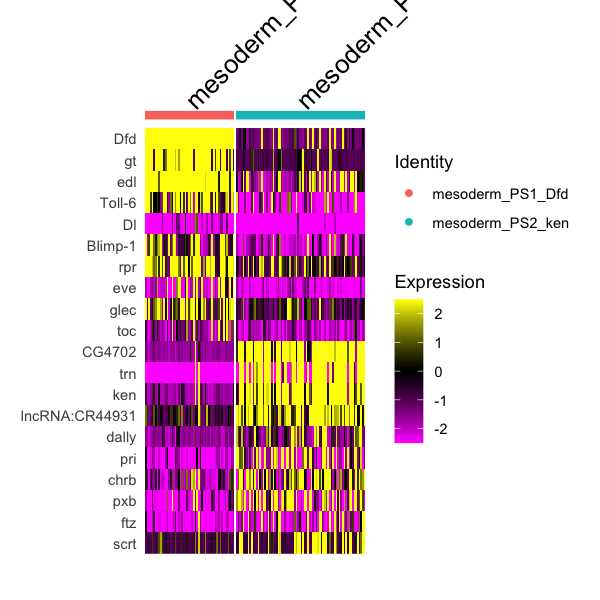

In [110]:
Idents(seu_HQC_dfd_ken_meso) <- 'manual_ID'
levels(seu_HQC_dfd_ken_meso) <- c('mesoderm_PS1_Dfd','mesoderm_PS2_ken')
all.markers <- FindAllMarkers(seu_HQC_dfd_ken_meso, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
options(repr.plot.width=5, repr.plot.height=5)
DoHeatmap(seu_HQC_dfd_ken_meso, features = c(all.markers.top10$gene))
write.table(all.markers, file = './subcluster_markers/markers_meso_PS1-2.txt', sep = '\t')

Saving 7 x 7 in image



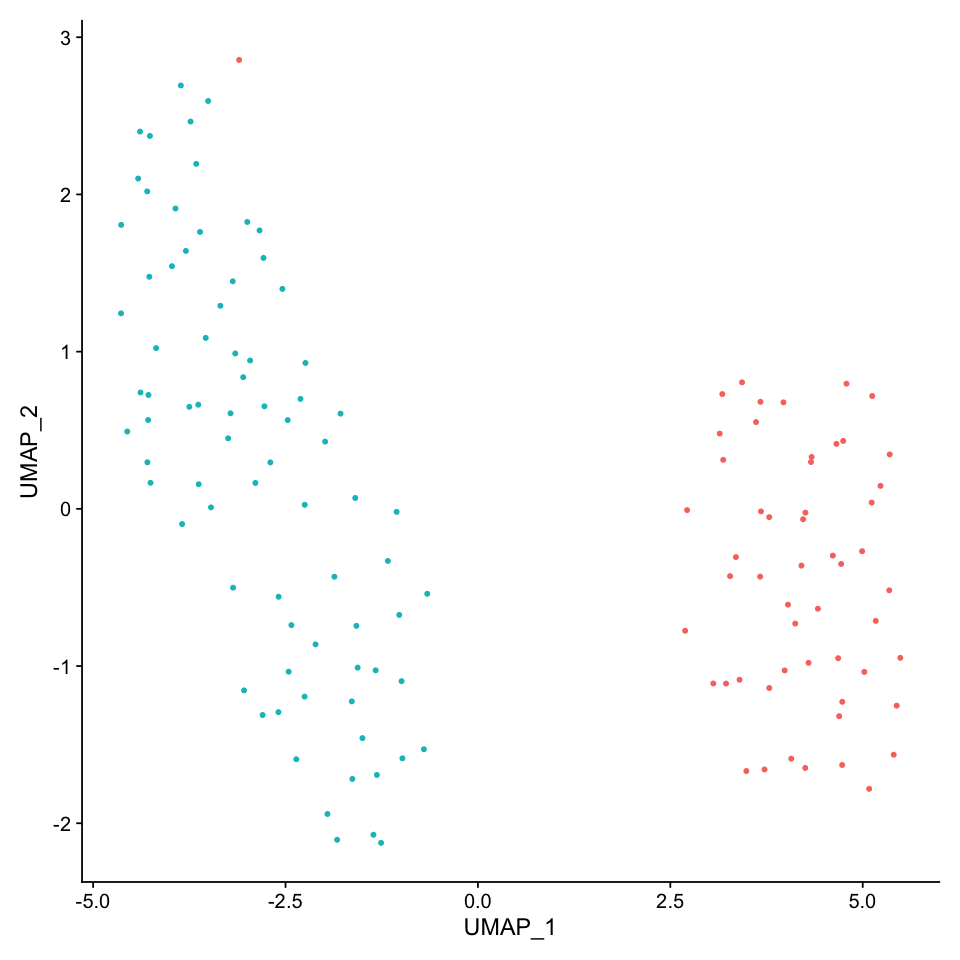

In [111]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_dfd_ken_meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/dfd_ken_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



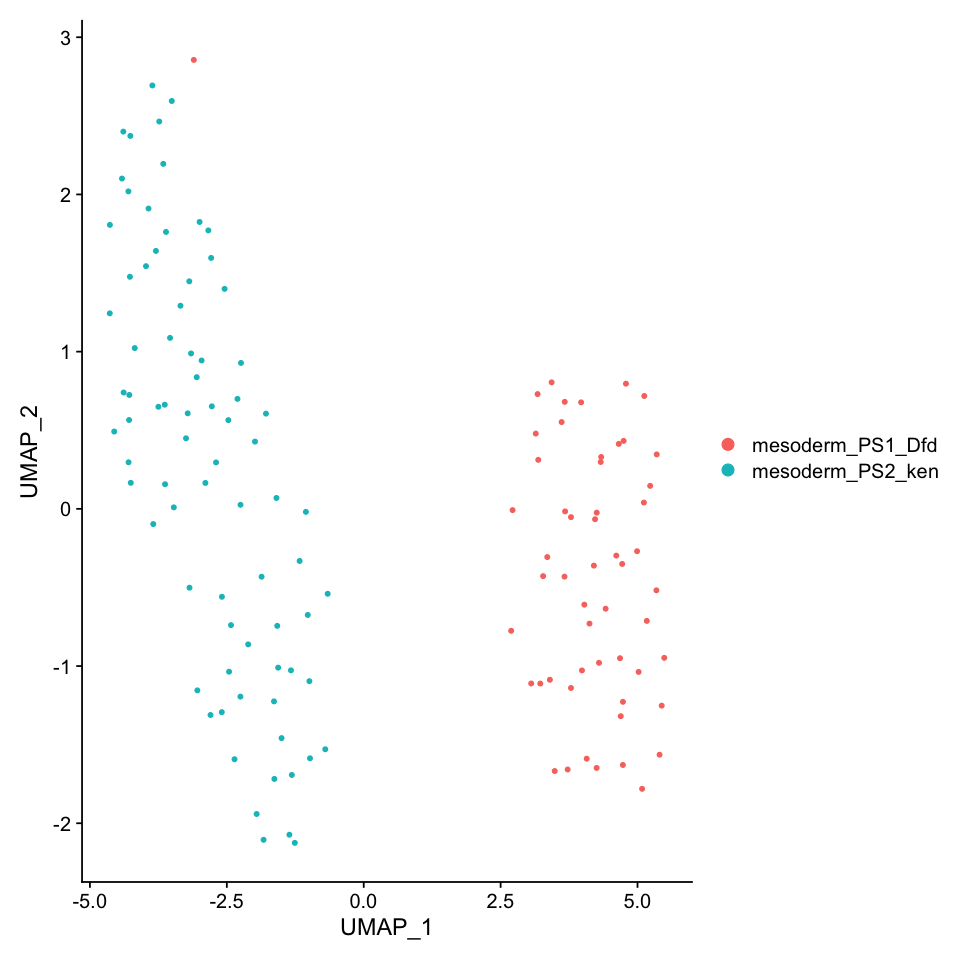

In [112]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_dfd_ken_meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/dfd_ken_meso_umap2.eps", dpi = 300)

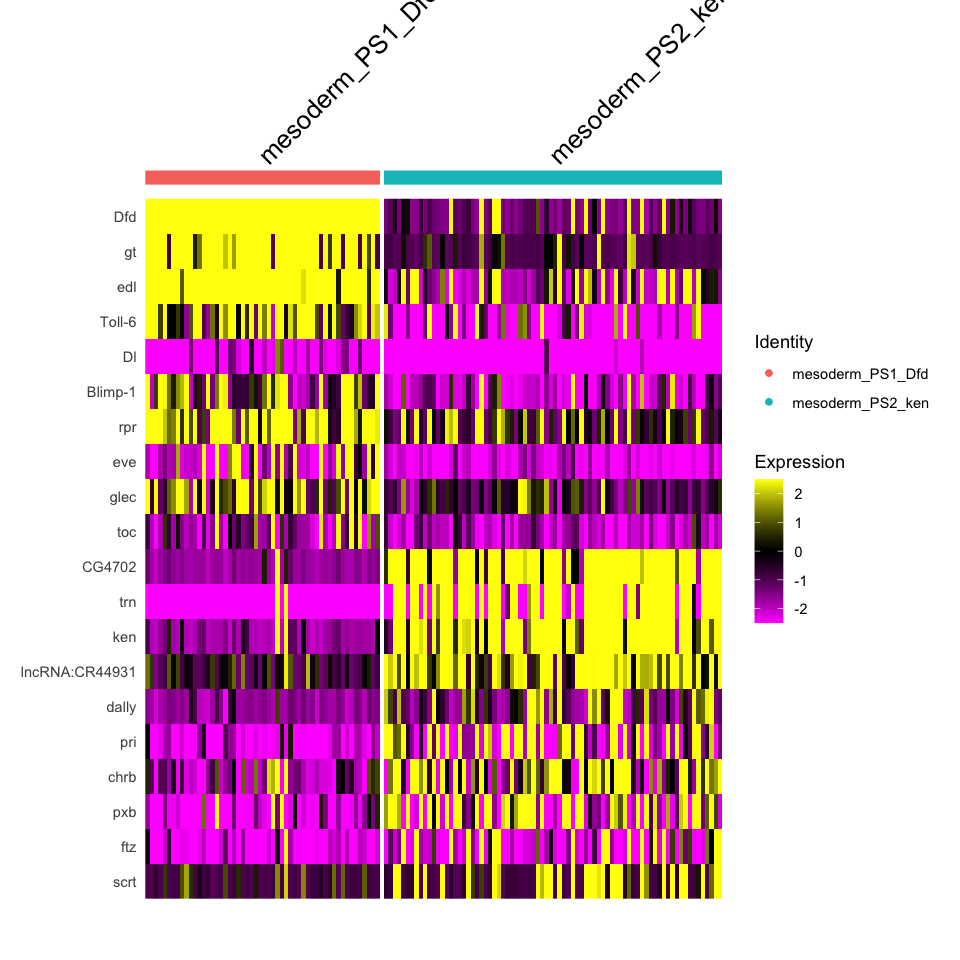

In [113]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_dfd_ken_meso,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/dfd_ken_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

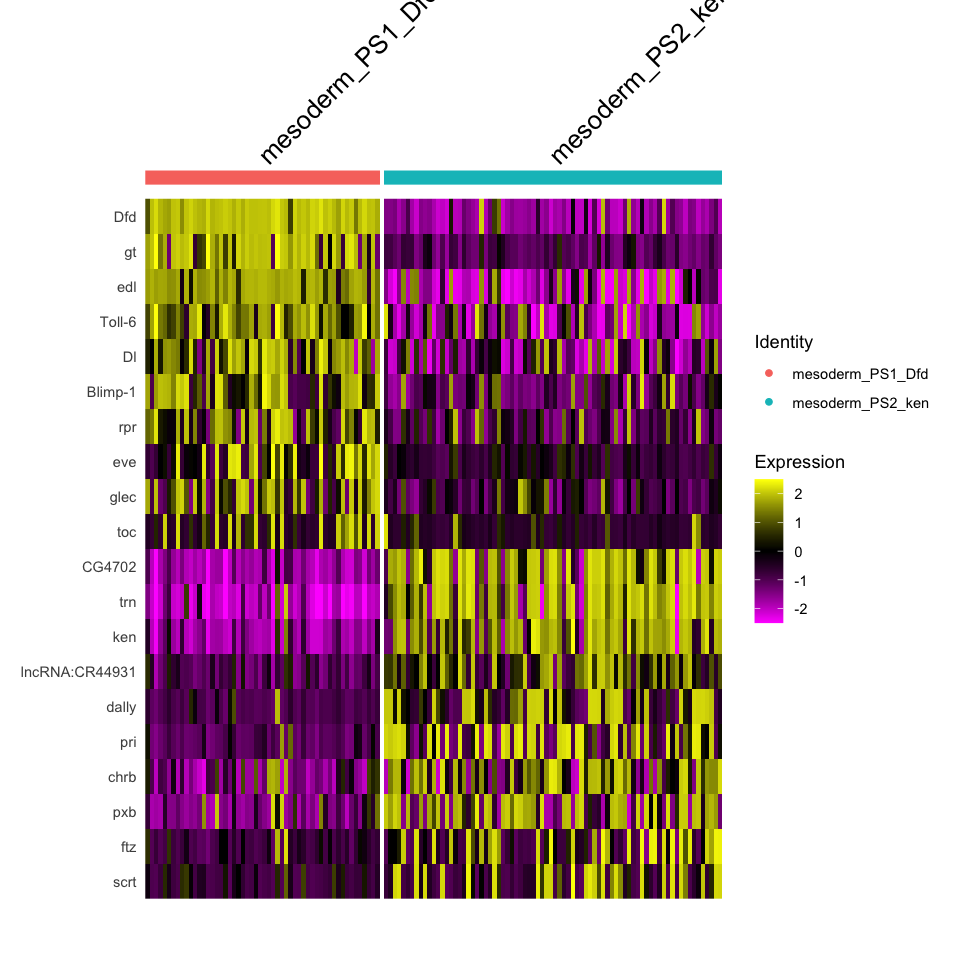

In [114]:
#renormalize for heatmap
DefaultAssay(seu_HQC_dfd_ken_meso) <- 'RNA'
seu_renorm <- suppressWarnings(SCTransform(seu_HQC_dfd_ken_meso, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_renorm,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/dfd_ken_meso_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

## Posterior Mesoderm
### picking up tareget cluster

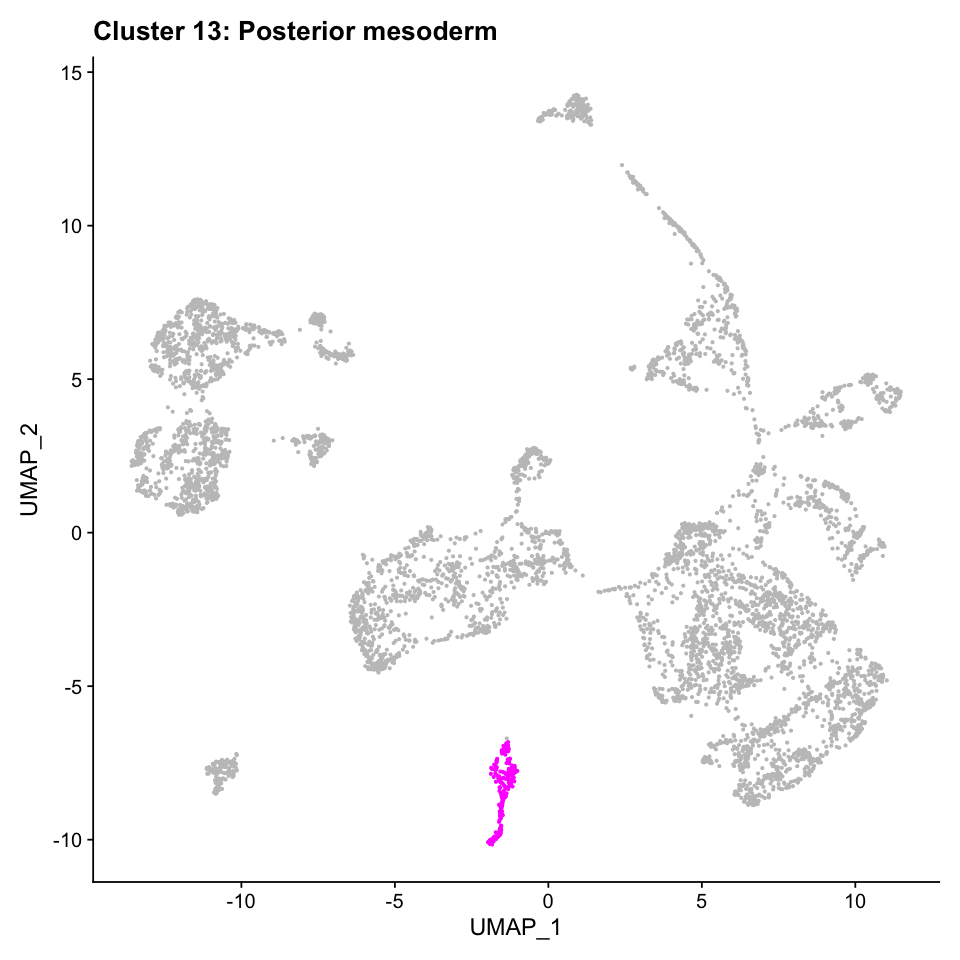

In [115]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(13))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 13: Posterior mesoderm')


In [116]:
seu_HQC_meso_PS14 <- subset(seu_HQC, ident = 13)
seu_HQC_meso_PS14

An object of class Seurat 
28756 features across 207 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### Clustering
Num of cells < 500  
Skipping re-normalize

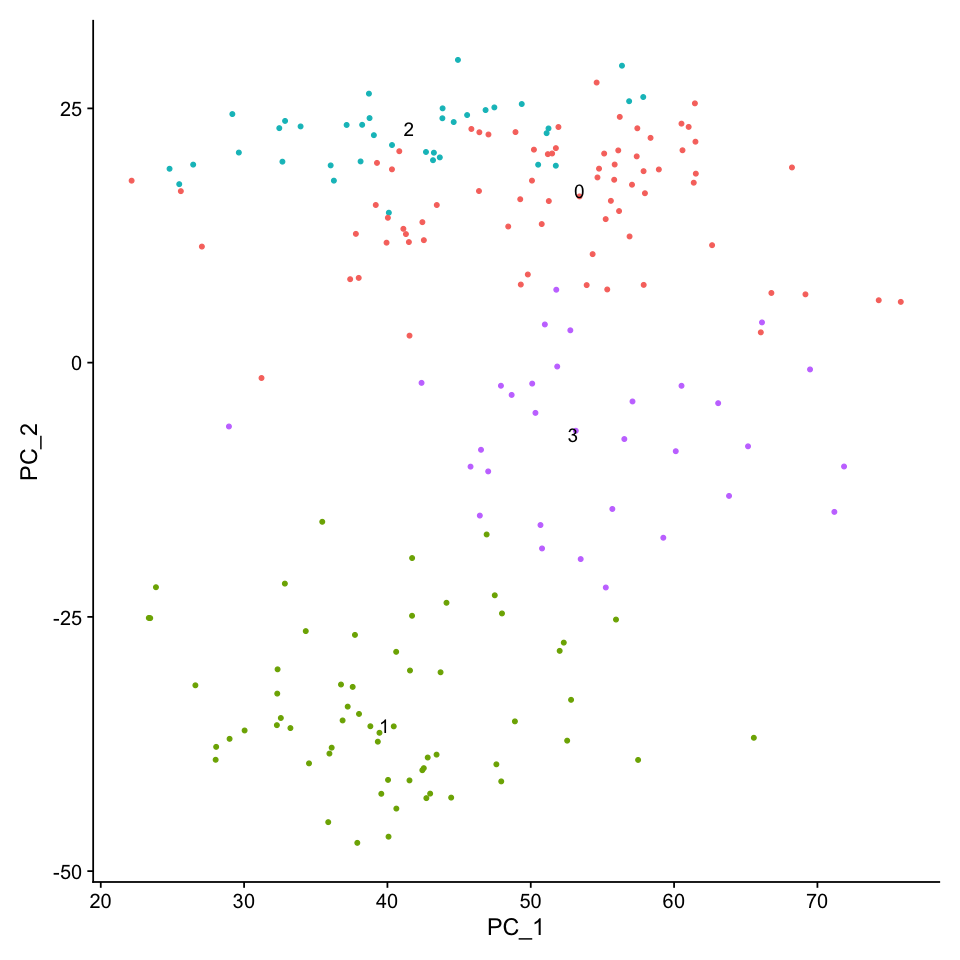

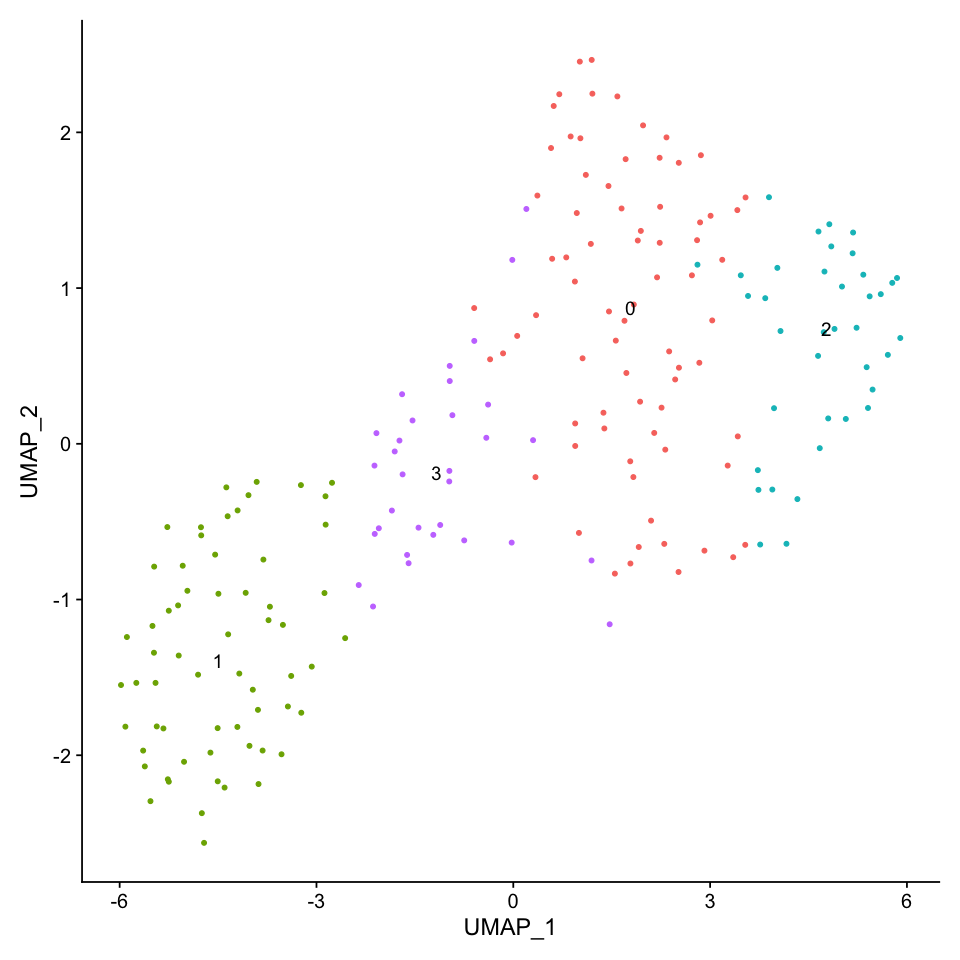

In [117]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso_PS14 <- RunPCA(seu_HQC_meso_PS14, verbose = FALSE)
# seu_HQC_meso_PS14 <- RunTSNE(seu_HQC_meso_PS14, dims = 1:30, verbose = FALSE)
seu_HQC_meso_PS14 <- RunUMAP(seu_HQC_meso_PS14, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso_PS14 <- FindNeighbors(seu_HQC_meso_PS14, dims = 1:30, verbose = FALSE)
seu_HQC_meso_PS14 <- FindClusters(seu_HQC_meso_PS14, verbose = FALSE)
DimPlot(seu_HQC_meso_PS14, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso_PS14, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso_PS14, reduction =  "umap", label = TRUE) + NoLegend()

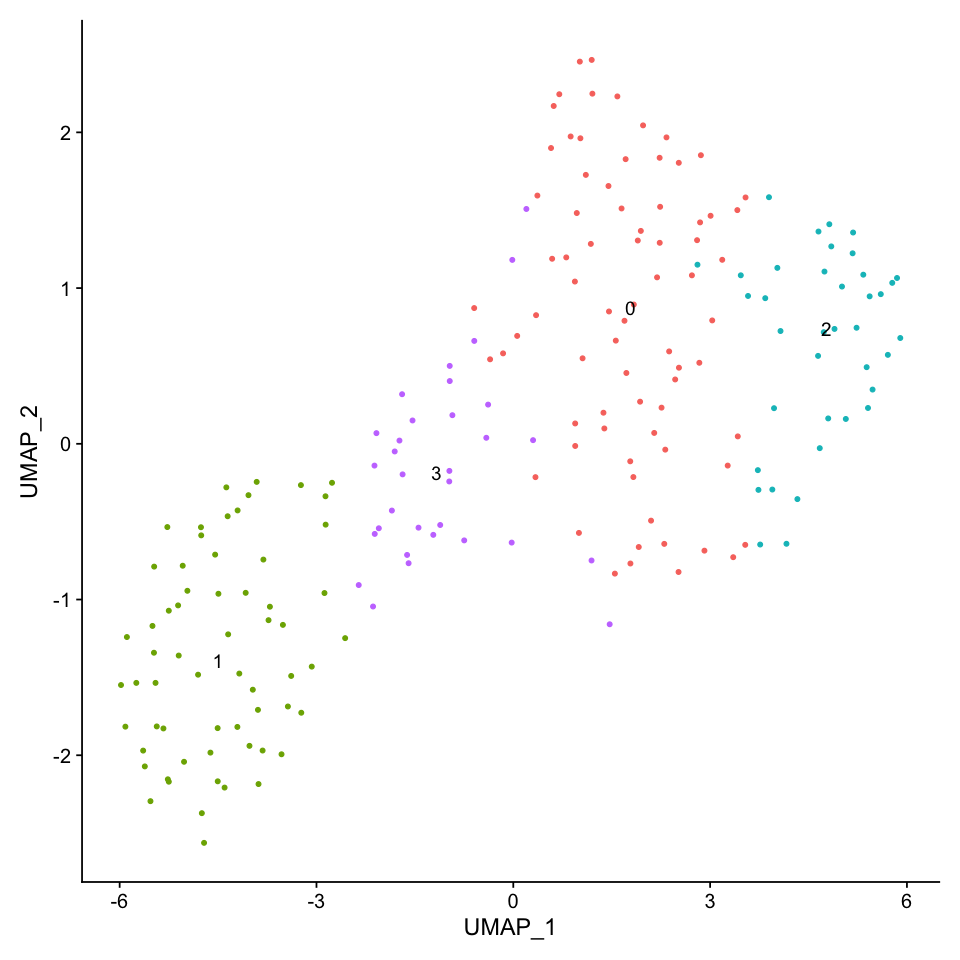

In [118]:
seu_HQC_meso_PS14 <- FindClusters(seu_HQC_meso_PS14, verbose = FALSE, resolution = 0.8)
DimPlot(seu_HQC_meso_PS14, reduction =  "umap", label = TRUE) + NoLegend()

In [119]:
levels(seu_HQC_meso_PS14) <- c(2,0,3,1)
all.markers.meso_PS14 <- FindAllMarkers(object = seu_HQC_meso_PS14, only.pos = TRUE)
all.markers.meso_PS14.top10 <- all.markers.meso_PS14 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 2

Calculating cluster 0

Calculating cluster 3

Calculating cluster 1



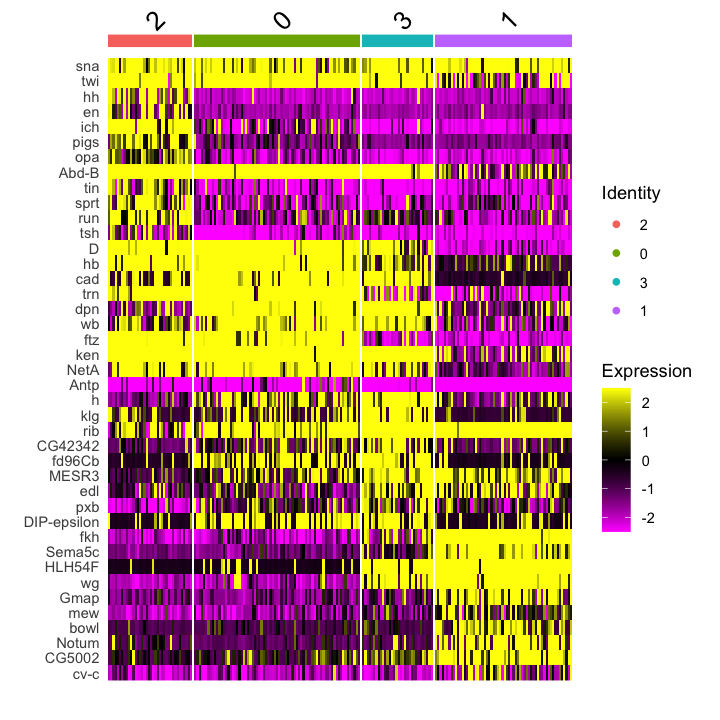

In [120]:
options(repr.plot.width=6, repr.plot.height=6)
DoHeatmap(seu_HQC_meso_PS14, features = c("sna", "twi", all.markers.meso_PS14.top10$gene))

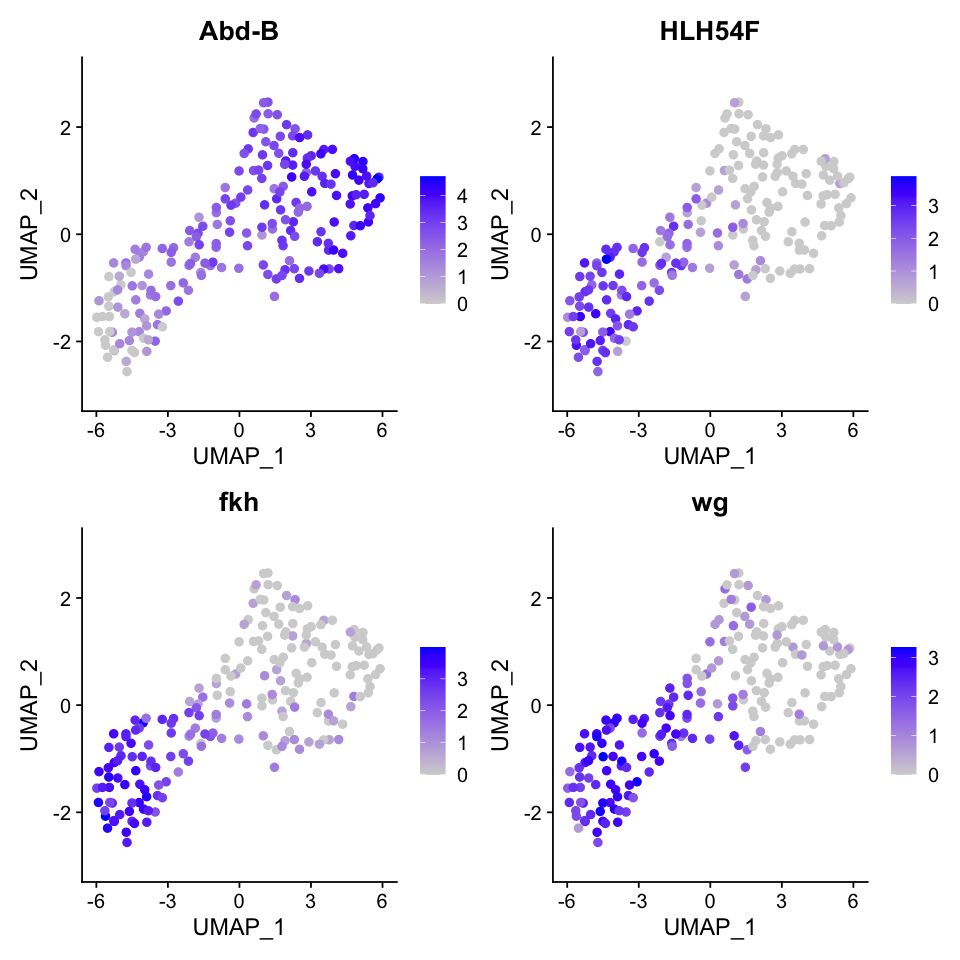

In [121]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu_HQC_meso_PS14, reduction = "umap", 
            features =c("Abd-B","HLH54F","fkh","wg"), pt.size = 2,  ncol = 2)

### Add annotation

In [122]:
test <- seu_HQC_meso_PS14$seurat_clusters
test <- as.data.frame(test)
head(test)

,test
,<fct>
AAAGGATCAGGCACAA,0
AACACACAGGTCGCCT,0
AACACACGTGGCATCC,1
AACGAAAAGCCATTTG,1
AAGCGAGAGGAGCAAA,2
AATCGACGTCAACACT,2


In [123]:
colnames(test) <- c("ID")
head(test)

,ID
,<fct>
AAAGGATCAGGCACAA,0
AACACACAGGTCGCCT,0
AACACACGTGGCATCC,1
AACGAAAAGCCATTTG,1
AAGCGAGAGGAGCAAA,2
AATCGACGTCAACACT,2


In [124]:
manual_ID_post <- as.data.frame(seu_HQC_meso_PS14$seurat_clusters)
colnames(manual_ID_post) <- c('manual_ID')
head(manual_ID_post)
manual_ID_post$manual_ID <- dplyr::recode(manual_ID_post$manual_ID, 
                                    "1" = "mesoderm_caudal_visceral", #HLH54F+, wg+, Abd-B-
                                    "0" = "mesoderm_PS14", #HLH54F-, Abd-B+, ftz+, wg-
                                    "2" = "mesoderm_PS14", #HLH54F-, Abd-B+, ftz+, wg-
                                    "3" = "mesoderm_PS14/mesoderm_caudal_visceral", #HLH54F+, Abd-B+, ftz-, wg+
                                    )
head(manual_ID_post)

,manual_ID
,<fct>
AAAGGATCAGGCACAA,0
AACACACAGGTCGCCT,0
AACACACGTGGCATCC,1
AACGAAAAGCCATTTG,1
AAGCGAGAGGAGCAAA,2
AATCGACGTCAACACT,2


,manual_ID
,<fct>
AAAGGATCAGGCACAA,mesoderm_PS14
AACACACAGGTCGCCT,mesoderm_PS14
AACACACGTGGCATCC,mesoderm_caudal_visceral
AACGAAAAGCCATTTG,mesoderm_caudal_visceral
AAGCGAGAGGAGCAAA,mesoderm_PS14
AATCGACGTCAACACT,mesoderm_PS14


In [125]:
write.table(manual_ID_post, file="./manual_ID_list/seu_HQC_meso_PS14_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [126]:
seu_HQC_meso_PS14$manual_ID <- manual_ID_post

Calculating cluster mesoderm_PS14

Calculating cluster mesoderm_PS14/mesoderm_caudal_visceral

Calculating cluster mesoderm_caudal_visceral



[1] 278   7

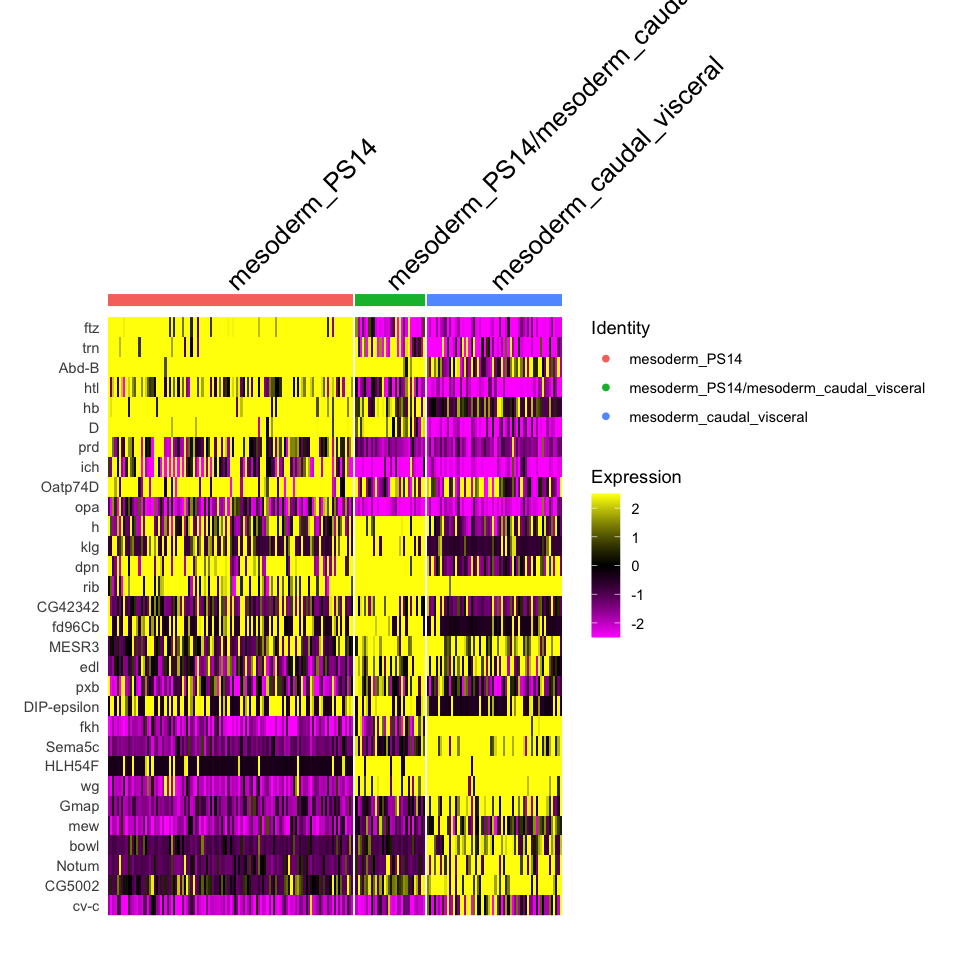

In [127]:
Idents(seu_HQC_meso_PS14) <- 'manual_ID'
levels(seu_HQC_meso_PS14) <- c('mesoderm_PS14','mesoderm_PS14/mesoderm_caudal_visceral', 'mesoderm_caudal_visceral')
all.markers <- FindAllMarkers(seu_HQC_meso_PS14, only.pos = T)
dim(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu_HQC_meso_PS14, features = c(all.markers.top10$gene))
write.table(all.markers, file = './subcluster_markers/markers_meso_post.txt', sep = '\t')

Saving 7 x 7 in image



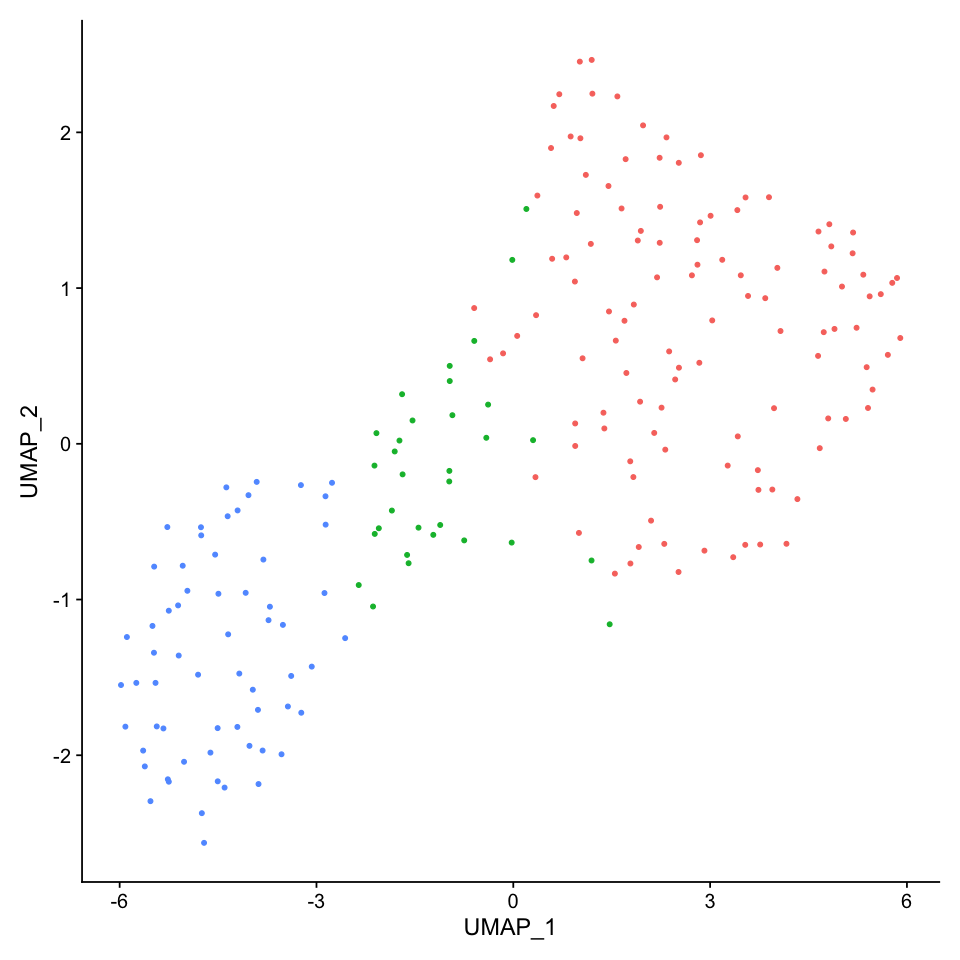

In [128]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso_PS14, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/meso_PS14_umap1.eps", dpi = 300)

Saving 7 x 7 in image



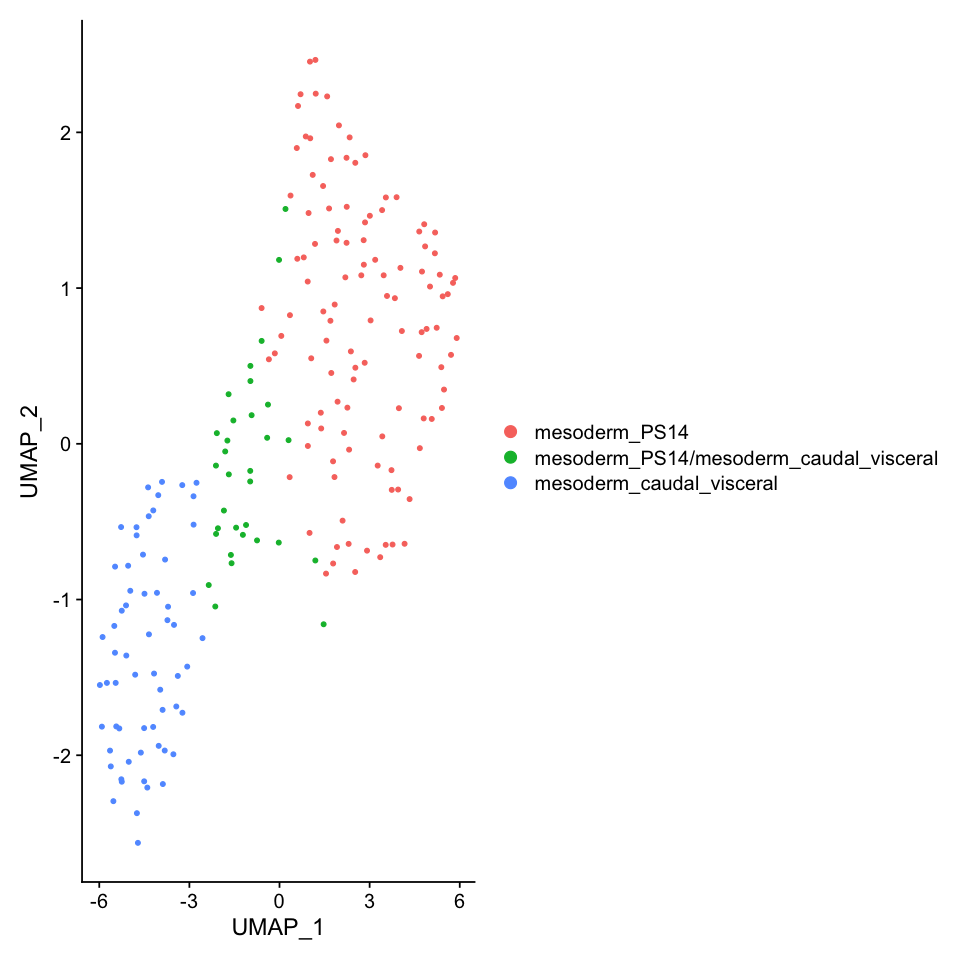

In [129]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu_HQC_meso_PS14, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/meso_PS14_umap2.eps", dpi = 300)

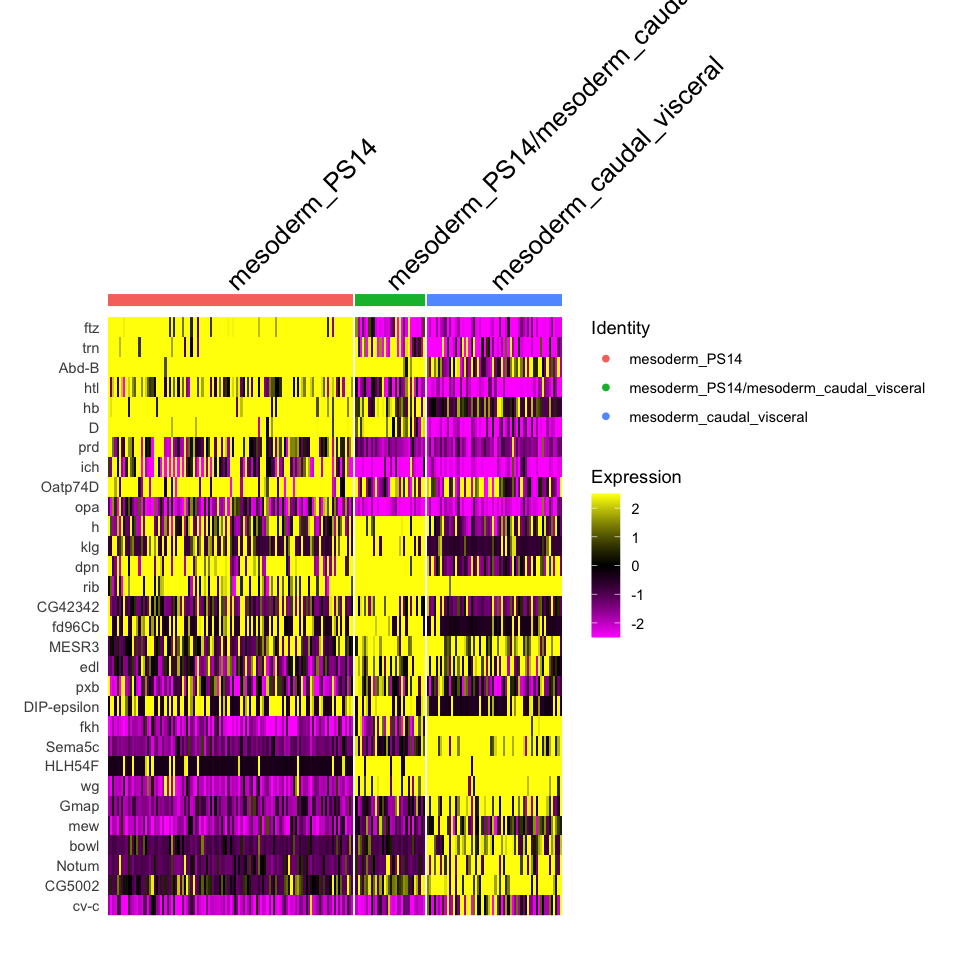

In [130]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_HQC_meso_PS14,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/meso_PS14_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

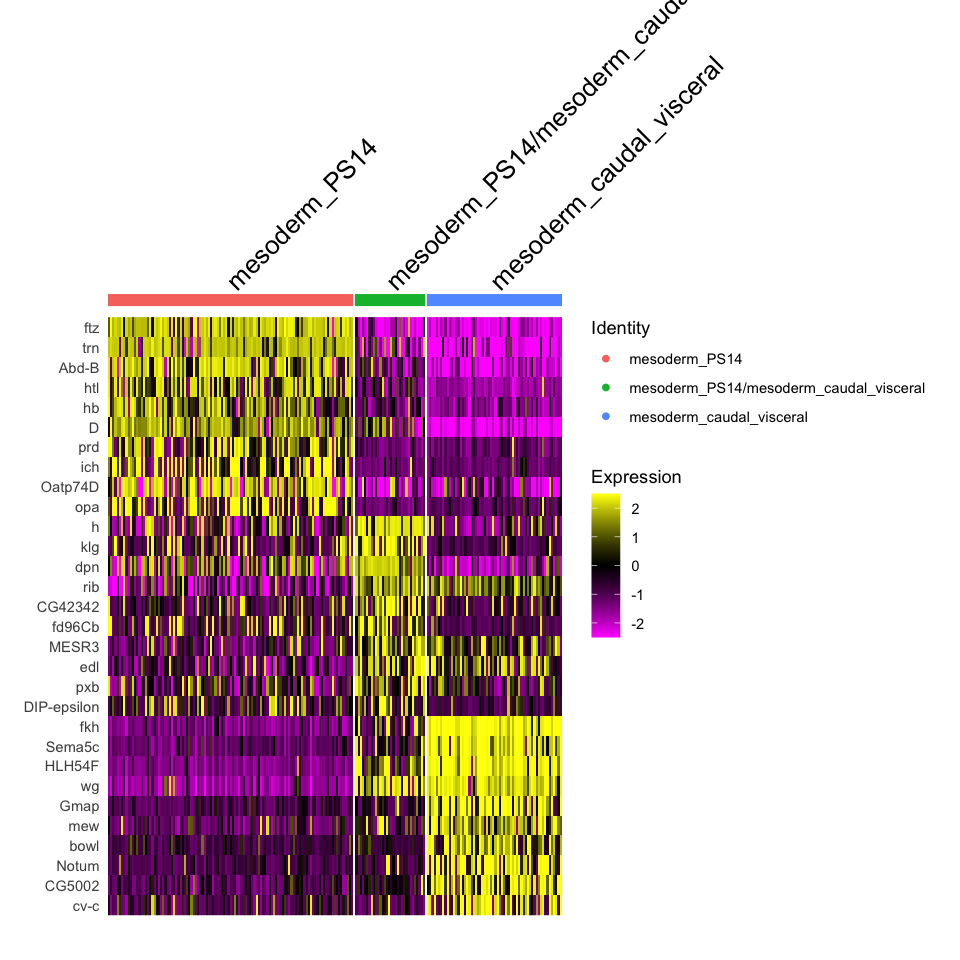

In [131]:
#renormalize for heatmap
DefaultAssay(seu_HQC_meso_PS14) <- 'RNA'
seu_renorm <- suppressWarnings(SCTransform(seu_HQC_meso_PS14, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE))

options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu_renorm,  features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/03_subclustering_meso_manualID/meso_PS14_manualID_heatmap_renorm.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS13
### picking up target clusters

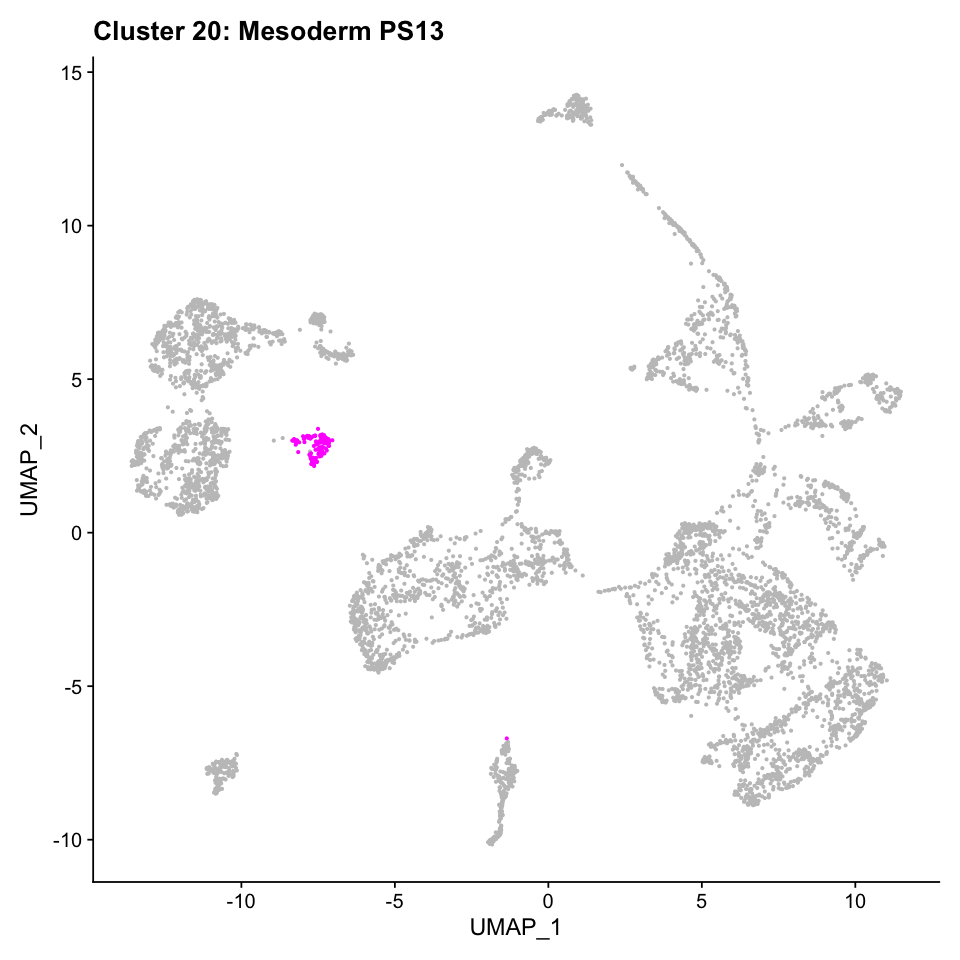

In [132]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(20))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 20: Mesoderm PS13')

In [133]:
seu_HQC_meso_PS13 <- subset(seu_HQC, ident = 20)
seu_HQC_meso_PS13

An object of class Seurat 
28756 features across 114 samples within 2 assays 
Active assay: SCT (11250 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

### clustering
Num of cells < 500  
skipping re-normalize

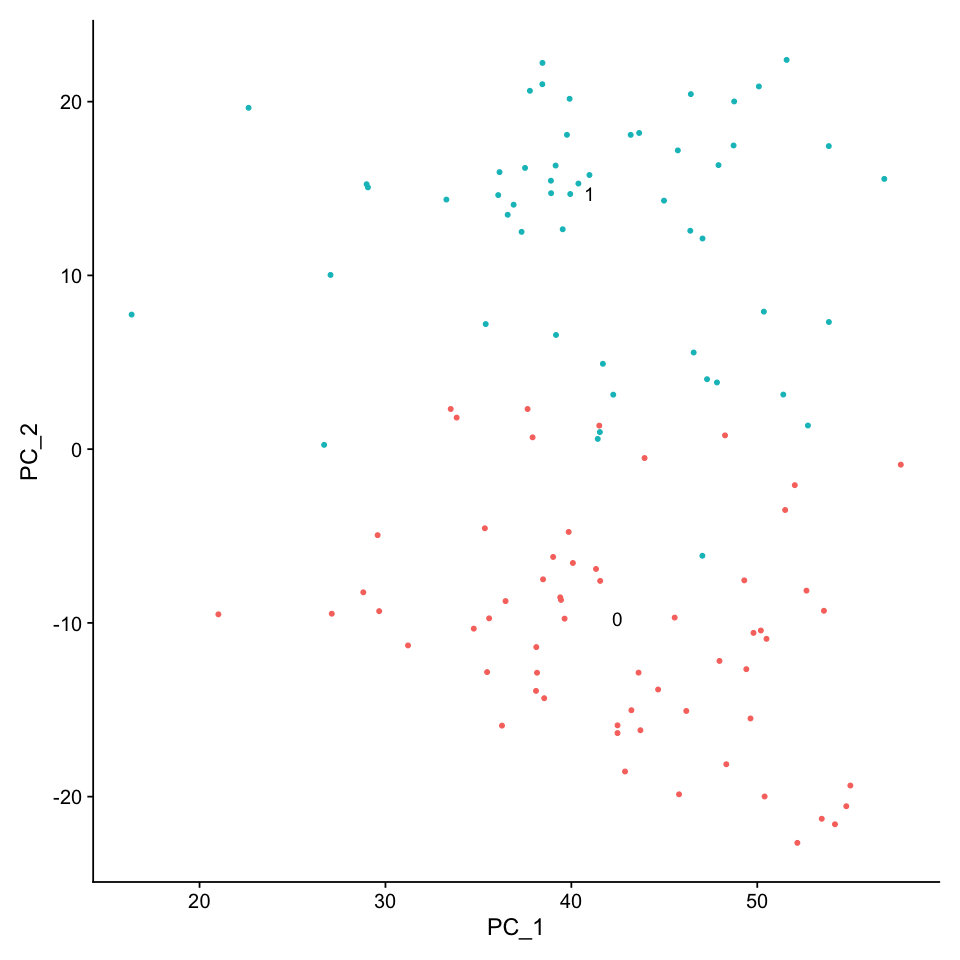

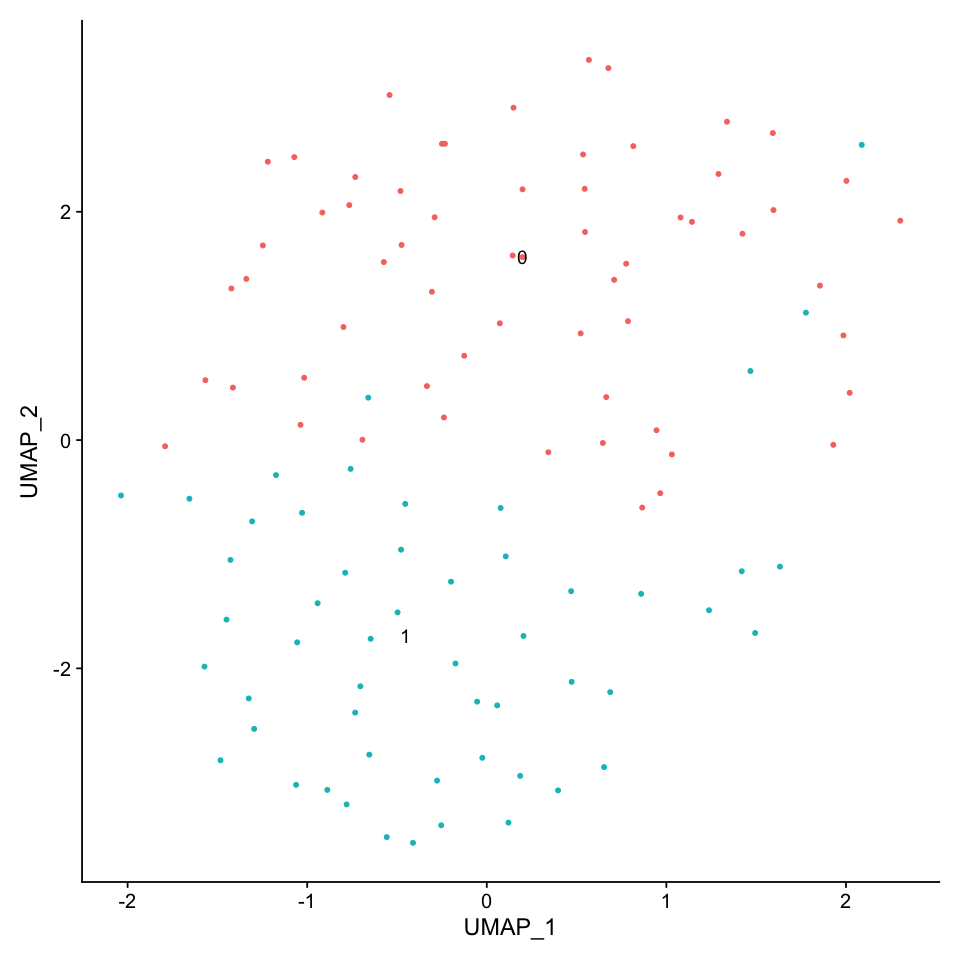

In [134]:
options(repr.plot.width=8, repr.plot.height=8)
seu_HQC_meso_PS13 <- RunPCA(seu_HQC_meso_PS13, verbose = FALSE)
# seu_HQC_meso_PS13 <- RunTSNE(seu_HQC_meso_PS13, dims = 1:30, verbose = FALSE)
seu_HQC_meso_PS13 <- RunUMAP(seu_HQC_meso_PS13, dims = 1:30, verbose = FALSE, n.neighbors = 20L)
seu_HQC_meso_PS13 <- FindNeighbors(seu_HQC_meso_PS13, dims = 1:30, verbose = FALSE)
seu_HQC_meso_PS13 <- FindClusters(seu_HQC_meso_PS13, verbose = FALSE, resolution = 0.9)
DimPlot(seu_HQC_meso_PS13, reduction =  "pca", label = TRUE) + NoLegend()
# DimPlot(seu_HQC_meso_PS13, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC_meso_PS13, reduction =  "umap", label = TRUE) + NoLegend()

In [135]:
all.markers.meso_PS13 <- FindAllMarkers(object = seu_HQC_meso_PS13, only.pos = TRUE)
nrow(all.markers.meso_PS14)
all.markers.meso_PS13.top10 <- all.markers.meso_PS13 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.meso_PS13.top10)

Calculating cluster 0

Calculating cluster 1



[1] 316

[1] 20

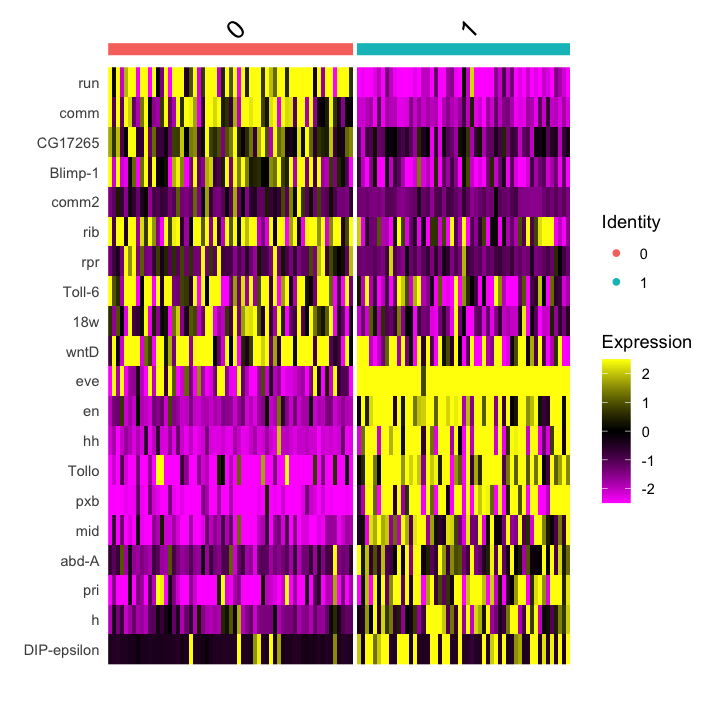

In [136]:
options(repr.plot.width=6, repr.plot.height=6)
DoHeatmap(seu_HQC_meso_PS13, features = c(all.markers.meso_PS13.top10$gene))

Anterior/Posterior parts in PS13 

In [137]:
meso_PS13_list <- colnames(seu_HQC_meso_PS13)
length(meso_PS13_list)

[1] 114

In [138]:
ID <- rep("mesoderm_PS13", length=length(meso_PS13_list)) 
ID

[1] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
  [5] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
  [9] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [13] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [17] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [21] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [25] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [29] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [33] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [37] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [41] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [45] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [49] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [53] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [57] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [61] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [65] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [69] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [73] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [77] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [81] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [85] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [89] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [93] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
 [97] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
[101] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
[105] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
[109] "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13" "mesoderm_PS13"
[113] "mesoderm_PS13" "mesoderm_PS13"

In [139]:
PS13_mesoderm_ID <- data.frame(meso_PS13_list, ID)
head(PS13_mesoderm_ID)

,meso_PS13_list,ID
,<chr>,<chr>
1,AAACCCATCCACGGGT,mesoderm_PS13
2,AAAGTCCCATGACTGT,mesoderm_PS13
3,AACCTGAGTCTACATG,mesoderm_PS13
4,AAGCGTTTCATTACCT,mesoderm_PS13
5,AATTCCTTCCCATAGA,mesoderm_PS13
6,ACGTTCCCAAGATTGA,mesoderm_PS13


In [140]:
PS13_mesoderm_ID <- PS13_mesoderm_ID %>% column_to_rownames("meso_PS13_list")
head(PS13_mesoderm_ID)

,ID
,<chr>
AAACCCATCCACGGGT,mesoderm_PS13
AAAGTCCCATGACTGT,mesoderm_PS13
AACCTGAGTCTACATG,mesoderm_PS13
AAGCGTTTCATTACCT,mesoderm_PS13
AATTCCTTCCCATAGA,mesoderm_PS13
ACGTTCCCAAGATTGA,mesoderm_PS13


In [141]:
write.table(PS13_mesoderm_ID, file="./manual_ID_list/seu_HQC_meso_PS13_manualID.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [142]:
seu_HQC_meso_PS13$manual_ID <- PS13_mesoderm_ID

In [143]:
seu.meso.merge <- merge(x = seu_HQC_ant_end_meso, y =c(seu_HQC_meso_gcm,seu_HQC_dfd_ken_meso,
                                                       seu_HQC_meso2, seu_HQC_meso_PS13, seu_HQC_meso_PS14))
seu.others <- subset(seu_HQC, cells = colnames(seu.meso.merge), invert=TRUE)
seu.others$manual_ID <- 'others'
seu.result <- merge(x=seu.meso.merge, y=seu.others)
seu_HQC$manual_ID <- as.data.frame(seu.result$manual_ID)

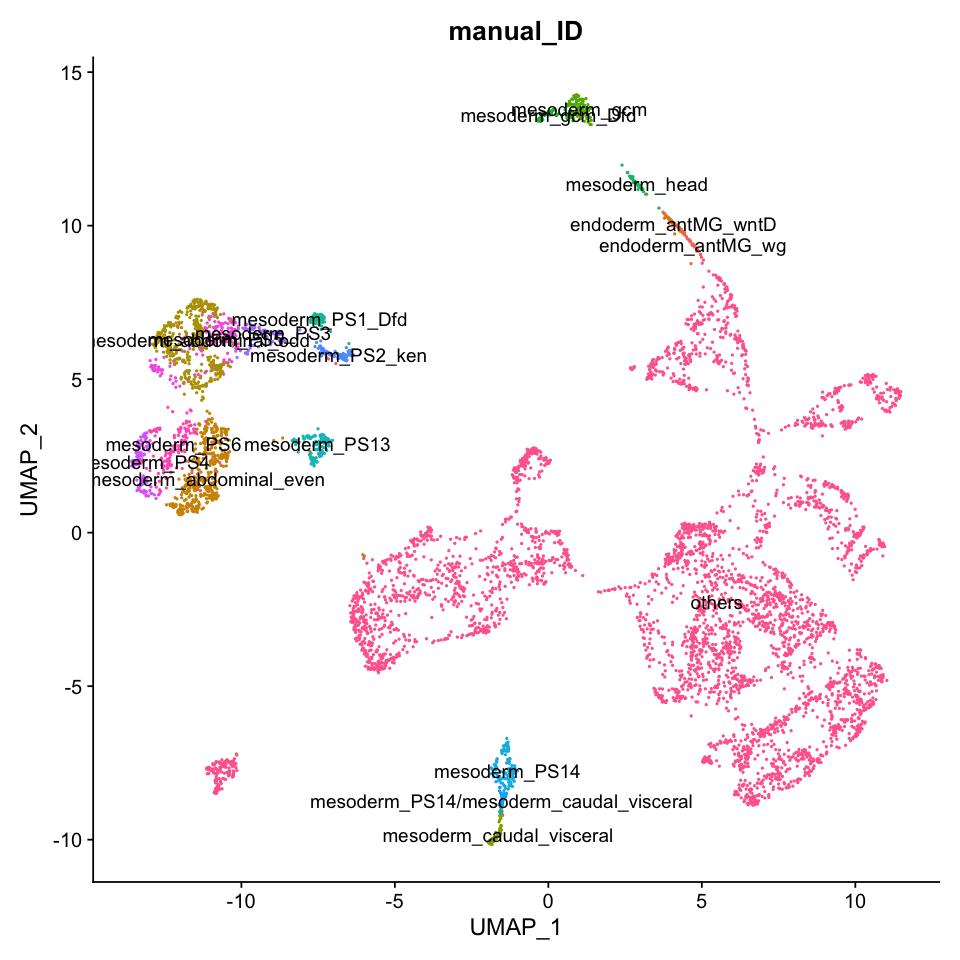

In [144]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [145]:
saveRDS(seu.meso.merge, file = '../../data/seurat_object/Set3/subclustering/seu_meso_subclustered.obj')

In [146]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
[5] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18   
 [13] uwot_0.1.10           mgcv